In [303]:
import seaborn as sns

In [304]:
import pandas as pd

df1 = pd.read_csv('col_mat_nuw_output.csv',header=None)
df2 = pd.read_csv('kan_output.csv',header=None)
df3 = pd.read_csv('mon_kur_jaf_output.csv',header=None)

combined_df = pd.concat([df1, df2, df3])

combined_df = pd.concat([df1, df2, df3])

column_names = ['HCHO Reading', 'Location', 'Current Date', 'Next Date']

combined_df.columns = column_names
combined_df

,HCHO Reading,Location,Current Date,Next Date
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000263,Colombo Proper,2019-01-02,2019-01-03
2,0.000099,Colombo Proper,2019-01-03,2019-01-04
3,0.000210,Colombo Proper,2019-01-04,2019-01-05
4,0.000179,Colombo Proper,2019-01-05,2019-01-06
...,...,...,...,...
5473,NaN,Jaffna Proper,2023-12-27,2023-12-28
5474,0.000051,Jaffna Proper,2023-12-28,2023-12-29
5475,0.000127,Jaffna Proper,2023-12-29,2023-12-30
5476,0.000117,Jaffna Proper,2023-12-30,2023-12-31


In [305]:
combined_df.shape

(12782, 4)

In [306]:
combined_df.describe

<bound method NDFrame.describe of       HCHO Reading        Location Current Date   Next Date
0         0.000197  Colombo Proper   2019-01-01  2019-01-02
1         0.000263  Colombo Proper   2019-01-02  2019-01-03
2         0.000099  Colombo Proper   2019-01-03  2019-01-04
3         0.000210  Colombo Proper   2019-01-04  2019-01-05
4         0.000179  Colombo Proper   2019-01-05  2019-01-06
...            ...             ...          ...         ...
5473           NaN   Jaffna Proper   2023-12-27  2023-12-28
5474      0.000051   Jaffna Proper   2023-12-28  2023-12-29
5475      0.000127   Jaffna Proper   2023-12-29  2023-12-30
5476      0.000117   Jaffna Proper   2023-12-30  2023-12-31
5477      0.000065   Jaffna Proper   2023-12-31  2024-01-01

[12782 rows x 4 columns]>

# Handlening Null Values

In [307]:
combined_df.isnull().sum()

HCHO Reading    4864
Location           0
Current Date       0
Next Date          0
dtype: int64

In [308]:
combined_df = combined_df.fillna(method='ffill')
combined_df = combined_df.fillna(method='bfill')
combined_df.isnull().sum()

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\2747287286.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  combined_df = combined_df.fillna(method='ffill')
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\2747287286.py:2: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  combined_df = combined_df.fillna(method='bfill')


HCHO Reading    0
Location        0
Current Date    0
Next Date       0
dtype: int64

# Remove Outlieres

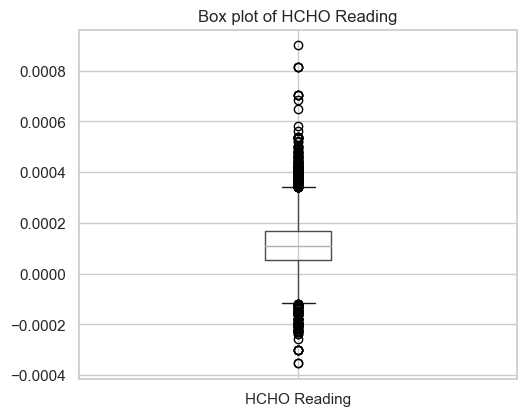

In [309]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
combined_df.boxplot(column='HCHO Reading')
plt.title('Box plot of HCHO Reading')
plt.tight_layout()
plt.show()

In [310]:
Q1 = combined_df['HCHO Reading'].quantile(0.25)
Q3 = combined_df['HCHO Reading'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to get outliers
outliers_below = combined_df[combined_df['HCHO Reading'] < lower_bound]
outliers_above = combined_df[combined_df['HCHO Reading'] > upper_bound]




(94, 4, 237, 4)

In [282]:
# Rinsorize the outliers
combined_df.loc[combined_df['HCHO Reading'] < lower_bound, 'HCHO Reading'] = lower_bound
combined_df.loc[combined_df['HCHO Reading'] > upper_bound, 'HCHO Reading'] = upper_bound


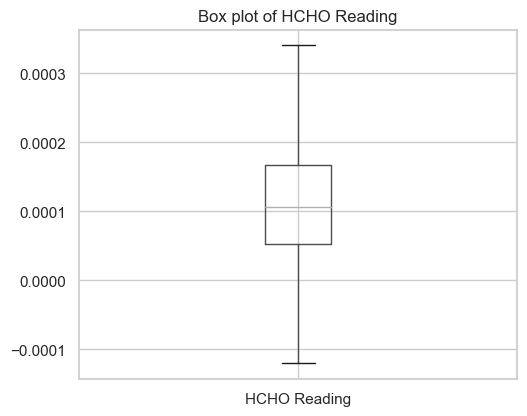

In [283]:
plt.figure(figsize=(10, 8))
plt.subplot(2, 2, 1)
combined_df.boxplot(column='HCHO Reading')
plt.title('Box plot of HCHO Reading')
plt.tight_layout()
plt.show()

In [284]:
import pandas as pd

city_stats = combined_df.groupby('Location')['HCHO Reading'].agg(['mean', 'median', 'std'])
print("Descriptive statistics for each city:")
print(city_stats)
overall_stats = combined_df['HCHO Reading'].agg(['mean', 'median', 'std'])
print("\nDescriptive statistics for the entire dataset:")
print(overall_stats)

Descriptive statistics for each city:
                         mean    median       std
Location                                         
Bibile, Monaragala   0.000120  0.000120  0.000093
Colombo Proper       0.000152  0.000145  0.000093
Deniyaya, Matara     0.000093  0.000082  0.000088
Jaffna Proper        0.000107  0.000099  0.000075
Kandy Proper         0.000100  0.000100  0.000088
Kurunegala Proper    0.000124  0.000118  0.000088
Nuwara Eliya Proper  0.000092  0.000083  0.000084

Descriptive statistics for the entire dataset:
mean      0.000112
median    0.000107
std       0.000089
Name: HCHO Reading, dtype: float64


# HCHO Reading Visualization

In [287]:
combined_df['Current Date'] = pd.to_datetime(combined_df['Current Date'])
combined_df2 = combined_df.copy()
df1 = combined_df.copy()
combined_df['Year'] = combined_df['Current Date'].dt.year
combined_df['Month'] = combined_df['Current Date'].dt.month
combined_df.set_index('Current Date', inplace=True)
combined_df['Month'] = combined_df.index.month

# Ensure the index is a DatetimeIndex
combined_df.index = pd.to_datetime(combined_df.index)

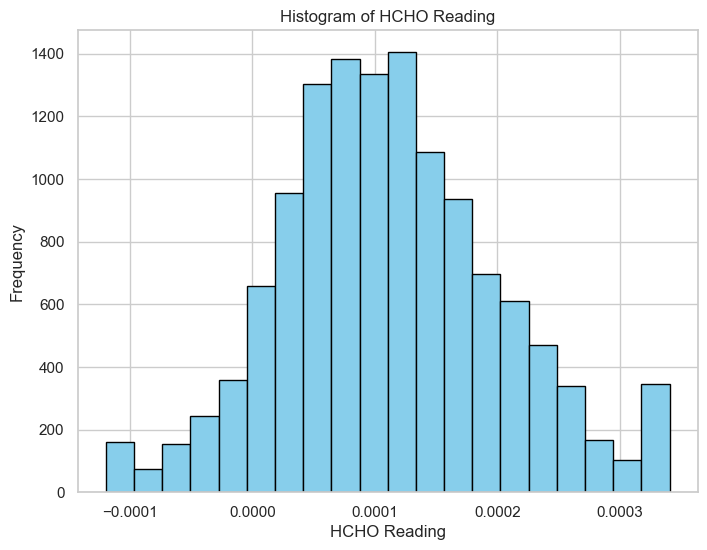

In [234]:
plt.figure(figsize=(8, 6))
plt.hist(combined_df['HCHO Reading'], bins=20, color='skyblue', edgecolor='black')

plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.title('Histogram of HCHO Reading')

plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


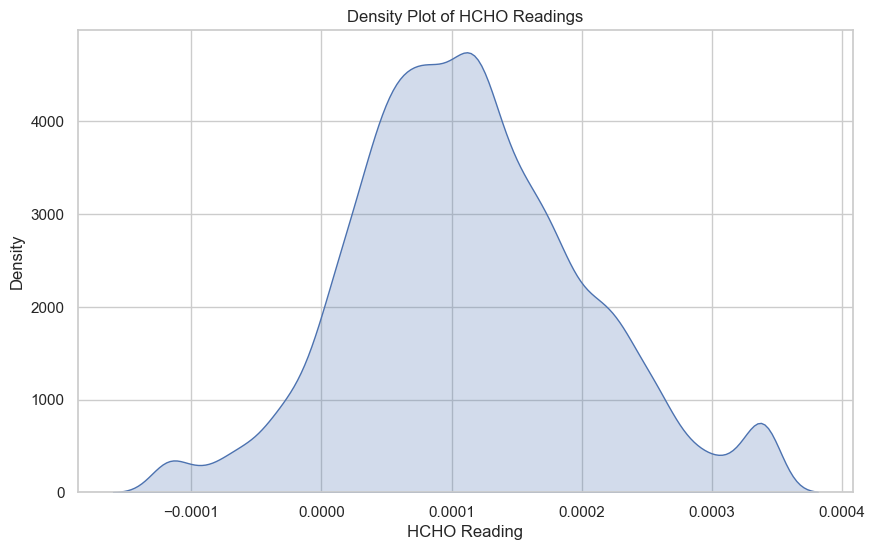

In [235]:
plt.figure(figsize=(10, 6))
sns.kdeplot(data=combined_df, x='HCHO Reading', fill=True)
plt.title('Density Plot of HCHO Readings')
plt.show()

<Figure size 1200x600 with 0 Axes>

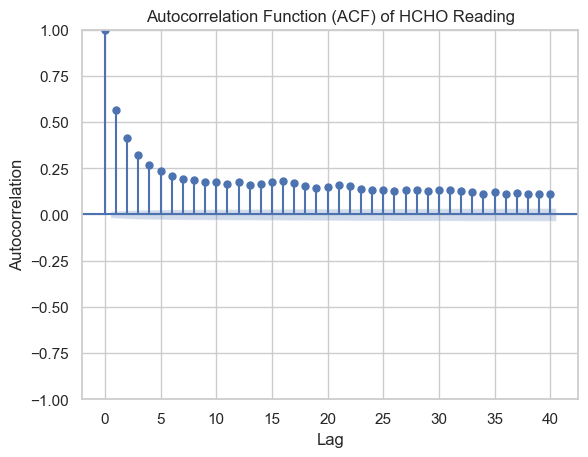

In [236]:
from statsmodels.graphics.tsaplots import plot_acf

plt.figure(figsize=(12, 6))
plot_acf(combined_df['HCHO Reading'], lags=40)  # Adjust 'lags' based on your data
plt.title('Autocorrelation Function (ACF) of HCHO Reading')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


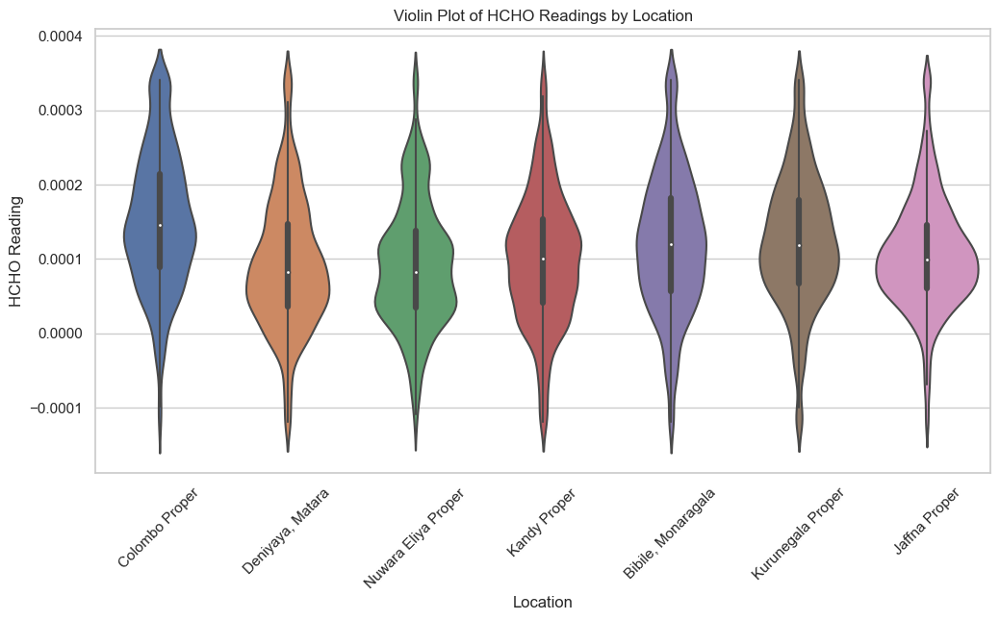

In [237]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=combined_df, x='Location', y='HCHO Reading')
plt.title('Violin Plot of HCHO Readings by Location')
plt.xticks(rotation=45)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

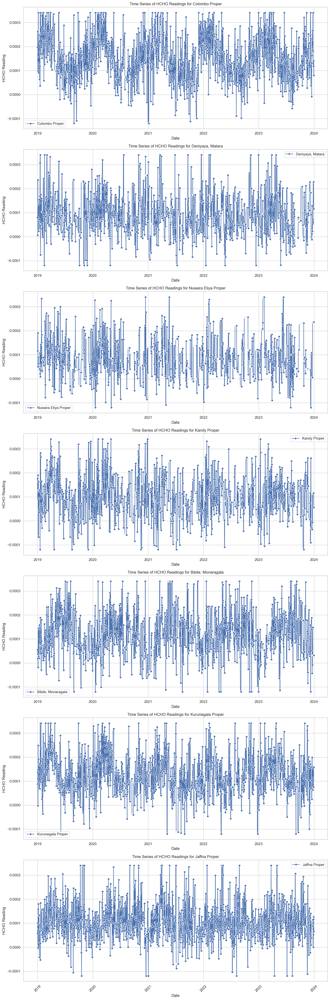

In [238]:
locations = combined_df['Location'].unique()
n_locations = len(locations)
fig, axs = plt.subplots(n_locations, 1, figsize=(14, 6 * n_locations))

for i, location in enumerate(locations):
    df_temp = combined_df[combined_df['Location'] == location]
    sns.lineplot(ax=axs[i], data=df_temp, x='Current Date', y='HCHO Reading', marker='o', label=location)
    axs[i].set_title(f'Time Series of HCHO Readings for {location}')
    axs[i].set_xlabel('Date')
    axs[i].set_ylabel('HCHO Reading')
    axs[i].legend()
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

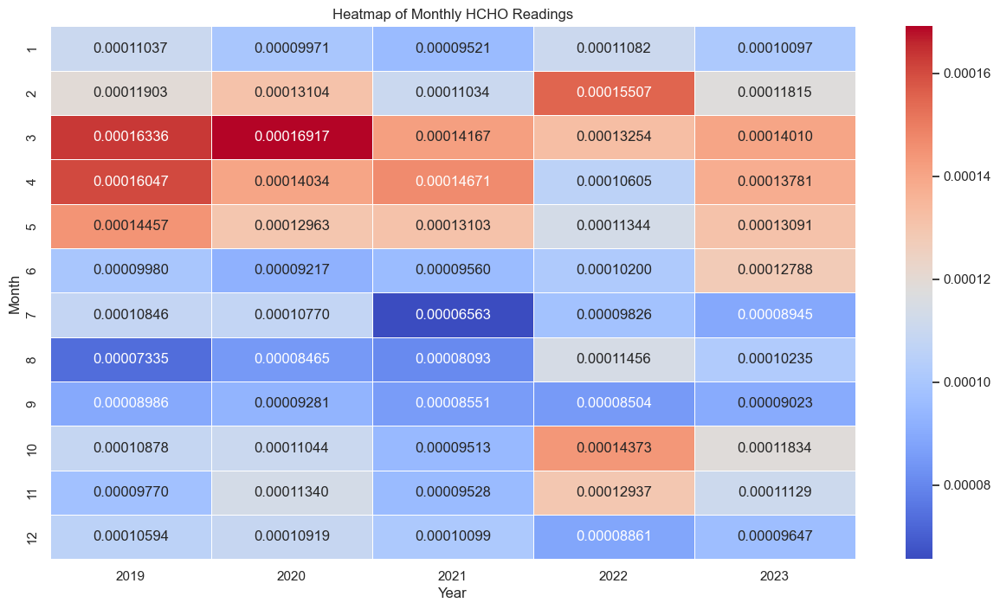

In [239]:
monthly_hcho = combined_df['HCHO Reading'].resample('M').mean()
monthly_yearly_hcho = monthly_hcho.groupby([monthly_hcho.index.month, monthly_hcho.index.year]).mean().unstack()

# Create a Heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(monthly_yearly_hcho, cmap='coolwarm', annot=True, fmt=".8f", linewidths=.5)
plt.title('Heatmap of Monthly HCHO Readings')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

# Spatio-Temporal Analysis

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

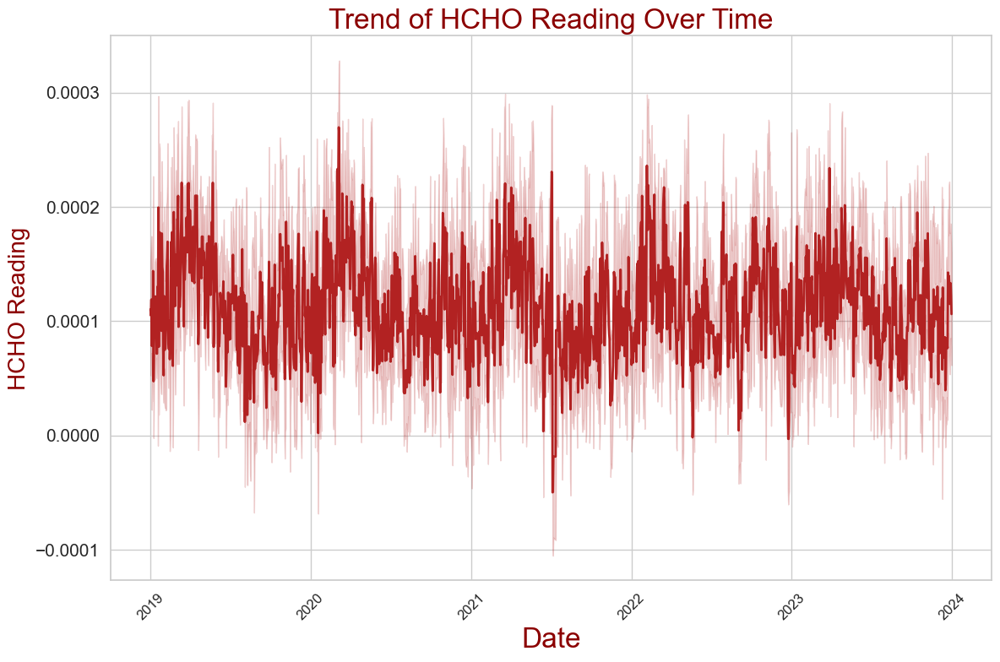

In [240]:
sns.set_style('whitegrid')

# Plotting
plt.figure(figsize=(12, 8))
sns.lineplot(data=combined_df, x=combined_df.index, y='HCHO Reading', linewidth=2, color='firebrick')

# Customizing the plot
plt.xlabel('Date', fontsize=24, color='darkred')
plt.ylabel('HCHO Reading', fontsize=20, color='darkred')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=15)
plt.title('Trend of HCHO Reading Over Time', fontsize=24, color='darkred')

plt.tight_layout()
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

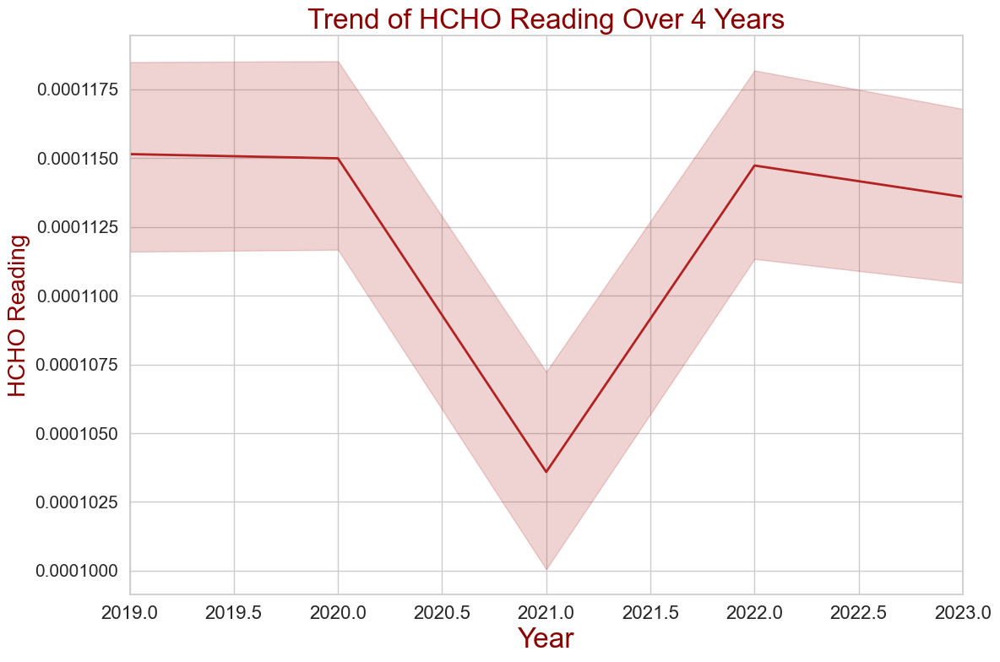

In [241]:
sns.set_style('whitegrid')

# Plotting
plt.figure(figsize=(12, 8))
sns.lineplot(data=combined_df, x=combined_df.index.year, y='HCHO Reading', linewidth=2, color='firebrick')

# Customizing the plot
plt.xlabel('Year', fontsize=24, color='darkred')
plt.ylabel('HCHO Reading', fontsize=20, color='darkred')
plt.xticks(fontsize=16)
plt.yticks(fontsize=15)
plt.title('Trend of HCHO Reading Over 4 Years', fontsize=24, color='darkred')

# Adding annotations
plt.annotate('Rapid increase starts', xy=(2019, combined_df['HCHO Reading'].max()), xytext=(2016, combined_df['HCHO Reading'].max() + 0.01),
             color='purple', fontsize=18, arrowprops=dict(facecolor='saddlebrown'))

# Set x-axis limits to include 2023
plt.xlim(combined_df.index.year.min(), combined_df.index.year.max()) 

plt.tight_layout()
plt.show()

# Seasonal variation

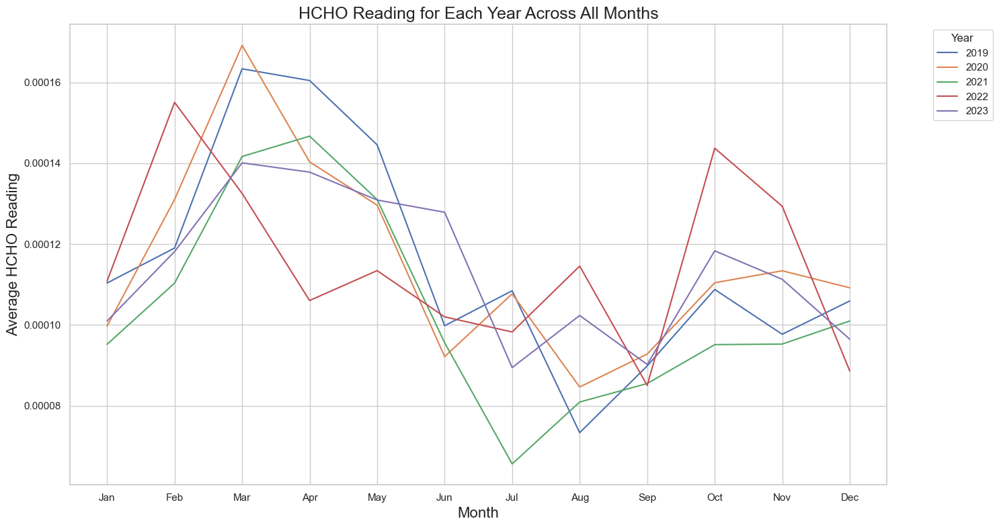

In [242]:
yearly_monthly_hcho = combined_df.groupby(['Year', 'Month'])['HCHO Reading'].mean().unstack()

plt.figure(figsize=(15, 8))

for year in yearly_monthly_hcho.index:
    plt.plot(yearly_monthly_hcho.columns, yearly_monthly_hcho.loc[year], label=year)

plt.xlabel('Month', fontsize=16)
plt.ylabel('Average HCHO Reading', fontsize=16)
plt.title('HCHO Reading for Each Year Across All Months', fontsize=18)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Year', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

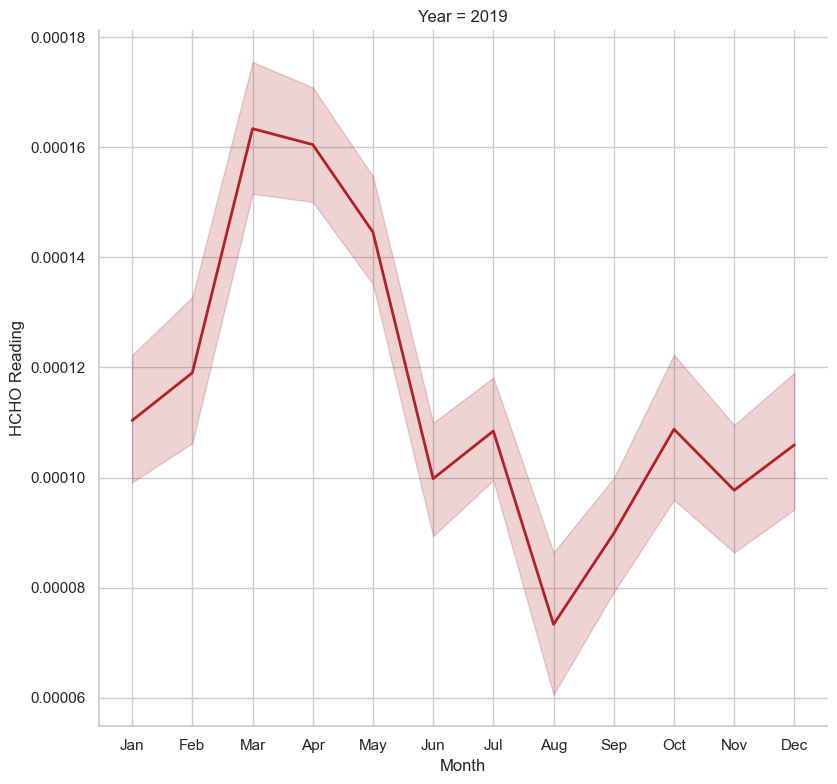

In [243]:
sns.set_style('whitegrid')
filtered_df = combined_df[combined_df['Year'] == 2019]

g = sns.FacetGrid(filtered_df, col='Year', col_wrap=2, height=8, sharey=False)
g = g.map(sns.lineplot, 'Month', 'HCHO Reading', linewidth=2, color='firebrick')

for ax in g.axes.flat:
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

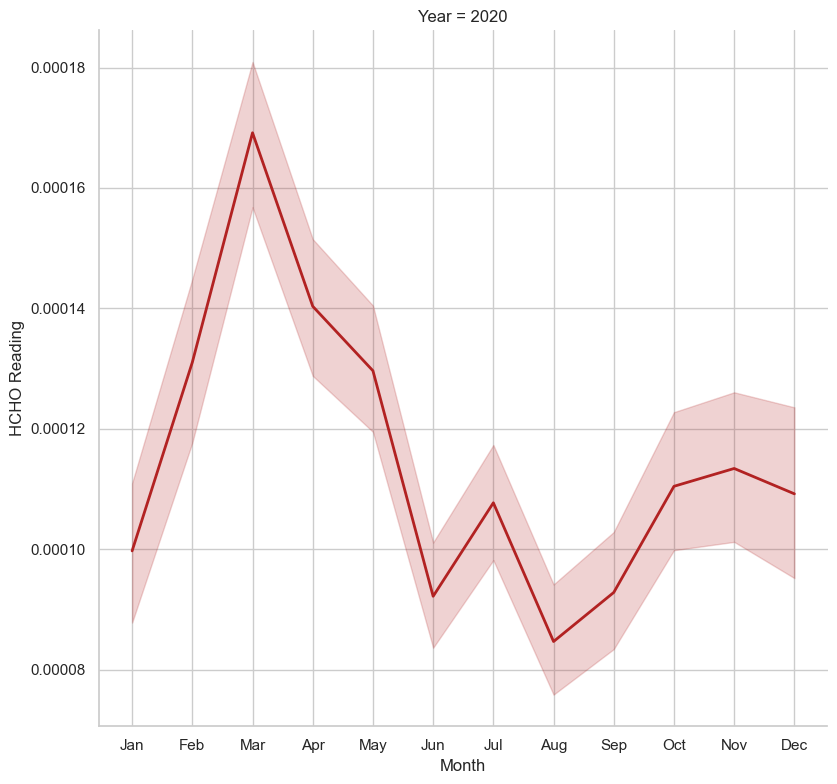

In [244]:
sns.set_style('whitegrid')
filtered_df = combined_df[combined_df['Year'] == 2020]

g = sns.FacetGrid(filtered_df, col='Year', col_wrap=2, height=8, sharey=False)
g = g.map(sns.lineplot, 'Month', 'HCHO Reading', linewidth=2, color='firebrick')

for ax in g.axes.flat:
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

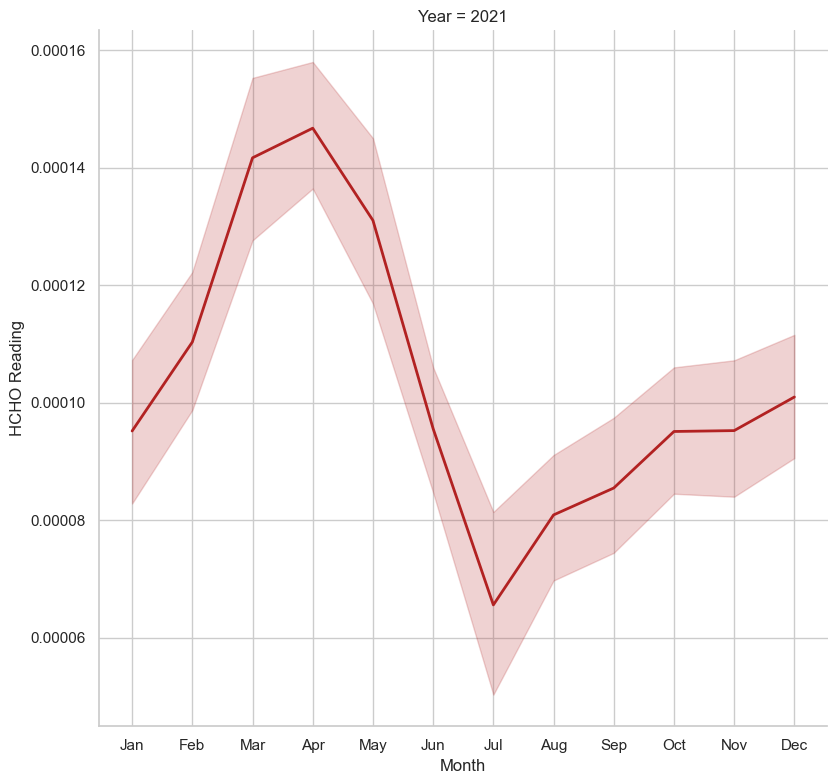

In [245]:
sns.set_style('whitegrid')
filtered_df = combined_df[combined_df['Year'] == 2021]

g = sns.FacetGrid(filtered_df, col='Year', col_wrap=2, height=8, sharey=False)
g = g.map(sns.lineplot, 'Month', 'HCHO Reading', linewidth=2, color='firebrick')

for ax in g.axes.flat:
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

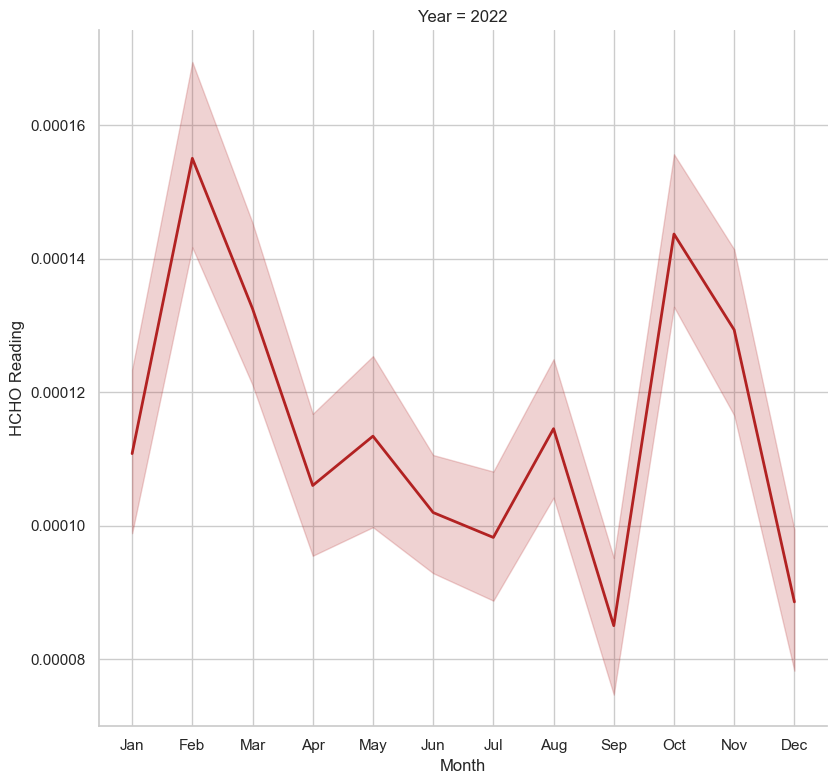

In [246]:
sns.set_style('whitegrid')
filtered_df = combined_df[combined_df['Year'] == 2022]

g = sns.FacetGrid(filtered_df, col='Year', col_wrap=2, height=8, sharey=False)
g = g.map(sns.lineplot, 'Month', 'HCHO Reading', linewidth=2, color='firebrick')

for ax in g.axes.flat:
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_con

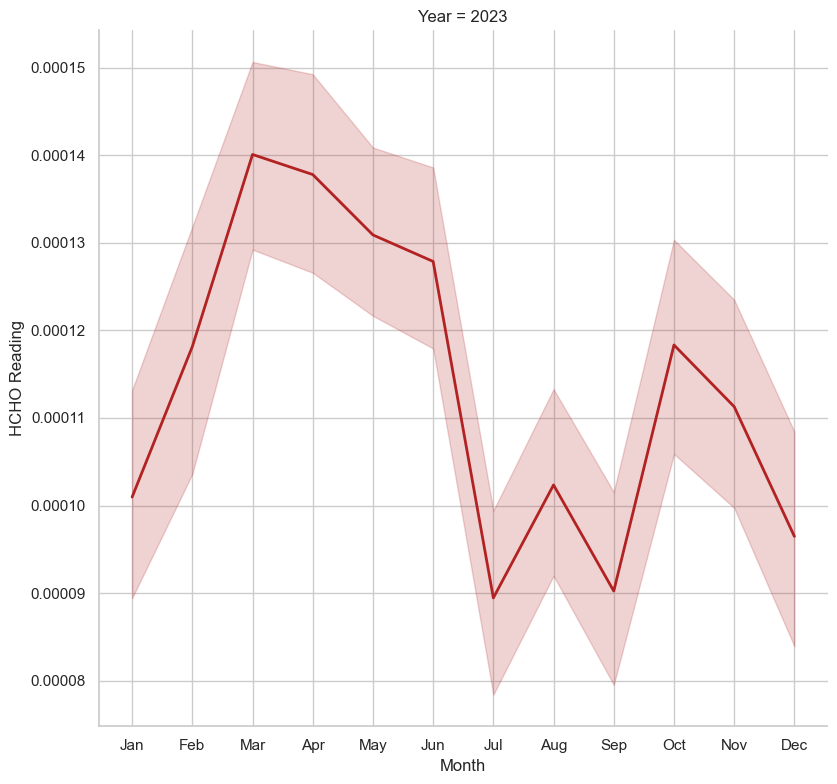

In [247]:
sns.set_style('whitegrid')
filtered_df = combined_df[combined_df['Year'] == 2023]

g = sns.FacetGrid(filtered_df, col='Year', col_wrap=2, height=8, sharey=False)
g = g.map(sns.lineplot, 'Month', 'HCHO Reading', linewidth=2, color='firebrick')

for ax in g.axes.flat:
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:848: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-pac

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:848: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Li

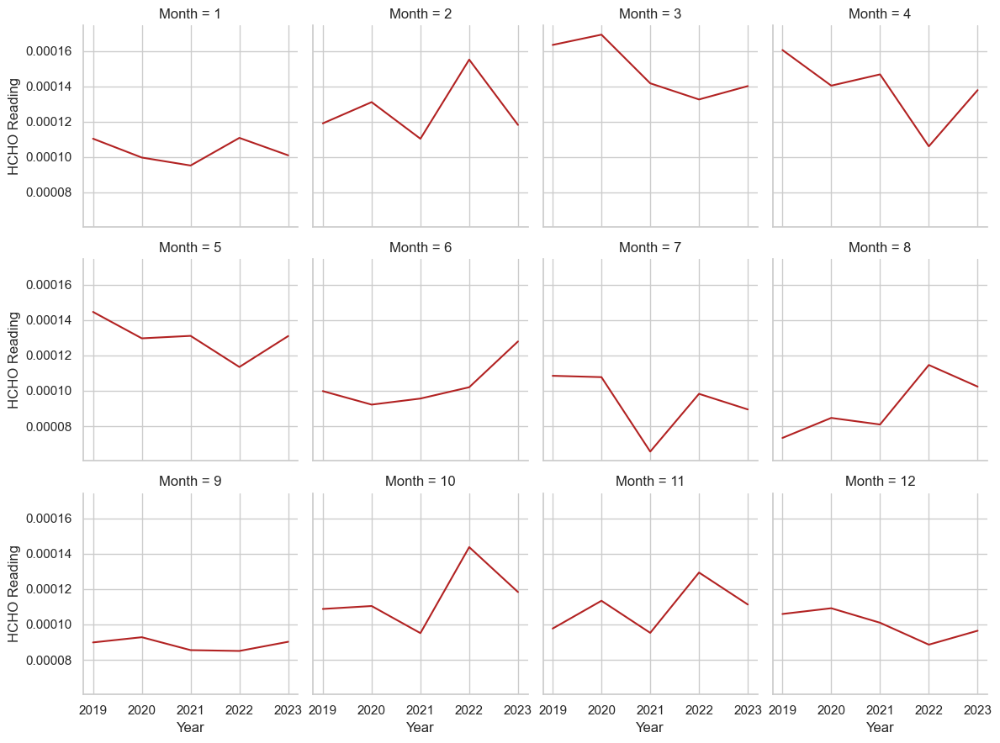

In [248]:
combined_df['Month'] = combined_df.index.month

# Create seasonal subplots
g = sns.FacetGrid(combined_df, col='Month', col_wrap=4, height=3)
g = g.map(sns.lineplot, 'Year', 'HCHO Reading', color='firebrick', ci=None)
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

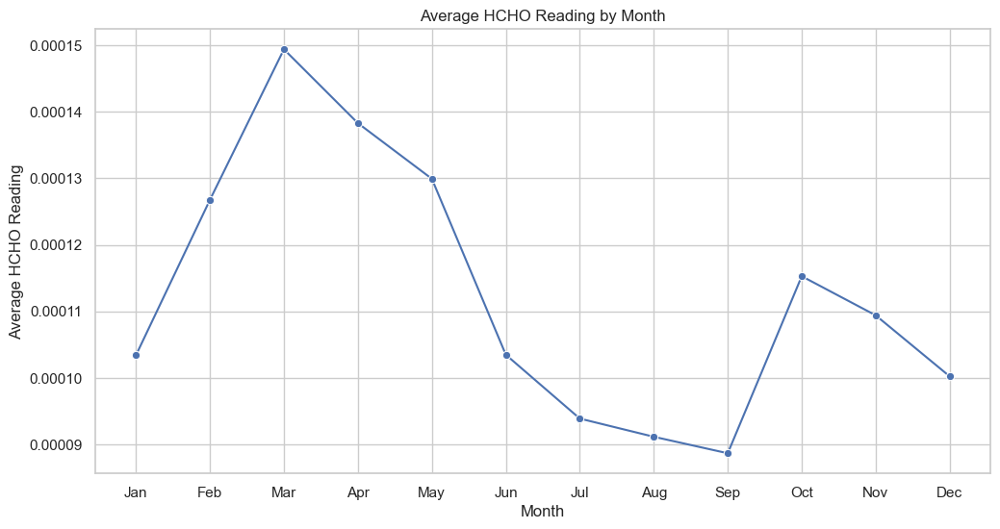

In [249]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

monthly_avg = combined_df.groupby(combined_df.index.month)['HCHO Reading'].mean()

# Plot the monthly average
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_avg.index, y=monthly_avg.values, marker='o', color='b')

plt.title('Average HCHO Reading by Month')
plt.xlabel('Month')
plt.ylabel('Average HCHO Reading')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

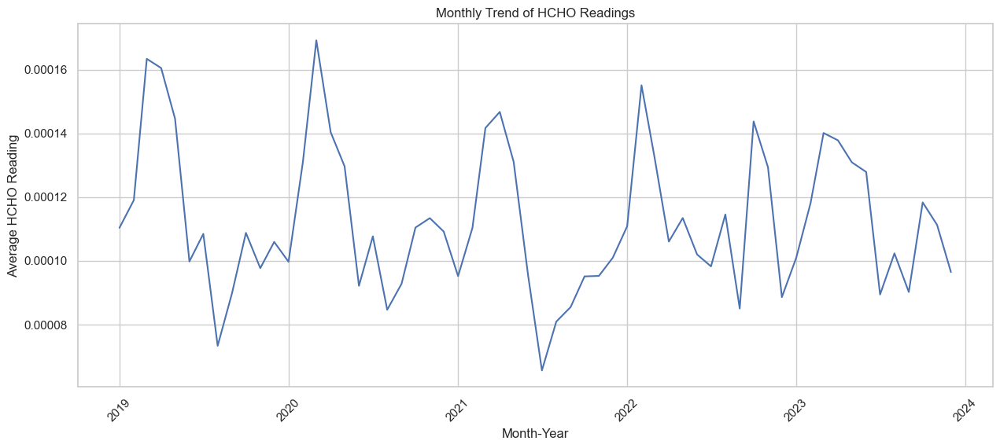

In [285]:
sns.set(style="whitegrid")
combined_df['Current Date'] = pd.to_datetime(combined_df['Current Date'])
# Aggregating the HCHO readings on a monthly basis
combined_df['Month-Year'] = combined_df['Current Date'].dt.to_period('M')
monthly_data = combined_df.groupby('Month-Year')['HCHO Reading'].mean().reset_index()

monthly_data['Month-Year'] = monthly_data['Month-Year'].dt.to_timestamp()

plt.figure(figsize=(15, 6))
sns.lineplot(x='Month-Year', y='HCHO Reading', data=monthly_data)
plt.title('Monthly Trend of HCHO Readings')
plt.xlabel('Month-Year')
plt.ylabel('Average HCHO Reading')
plt.xticks(rotation=45)
plt.show()

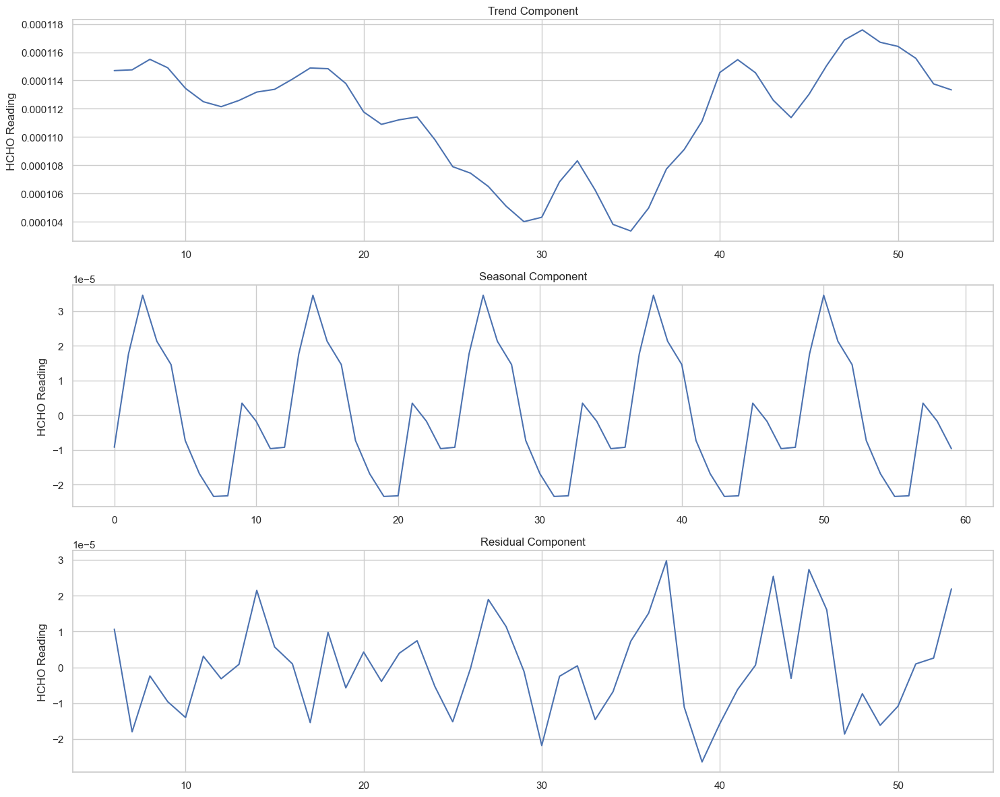

In [286]:
# Decomposing the time series
decomposition = seasonal_decompose(monthly_data['HCHO Reading'], model='additive', period=12)

# Plotting the decomposed components
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 12))
decomposition.trend.plot(ax=ax1)
ax1.set_title('Trend Component')
ax1.set_ylabel('HCHO Reading')

decomposition.seasonal.plot(ax=ax2)
ax2.set_title('Seasonal Component')
ax2.set_ylabel('HCHO Reading')

decomposition.resid.plot(ax=ax3)
ax3.set_title('Residual Component')
ax3.set_ylabel('HCHO Reading')

plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


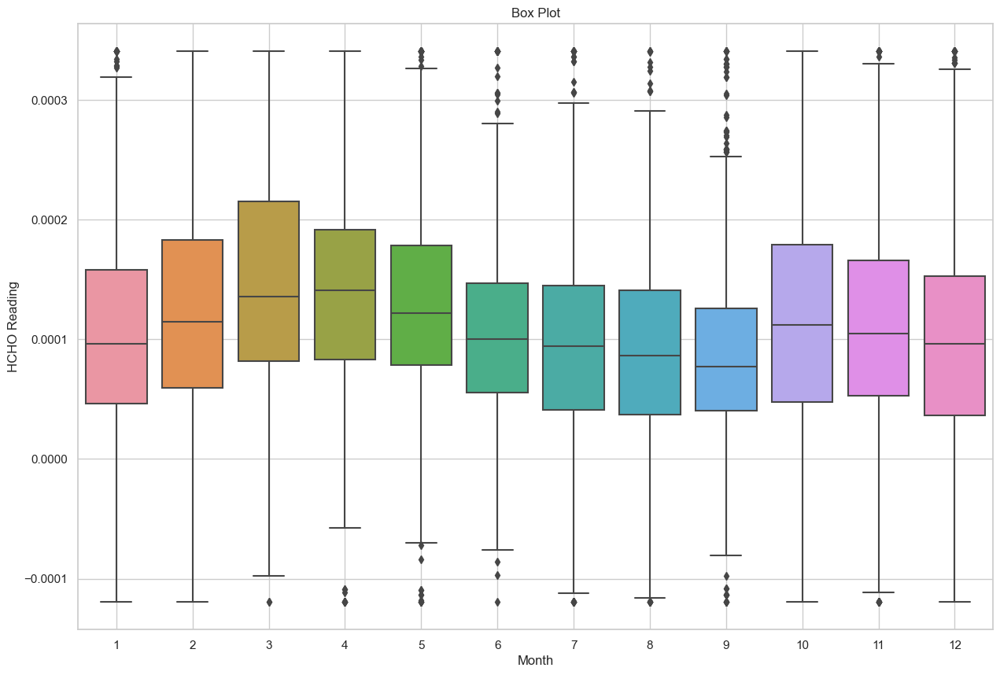

In [291]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='Month', y='HCHO Reading', data=combined_df)
plt.title('Box Plot')
plt.xlabel('Month')
plt.ylabel('HCHO Reading')
plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


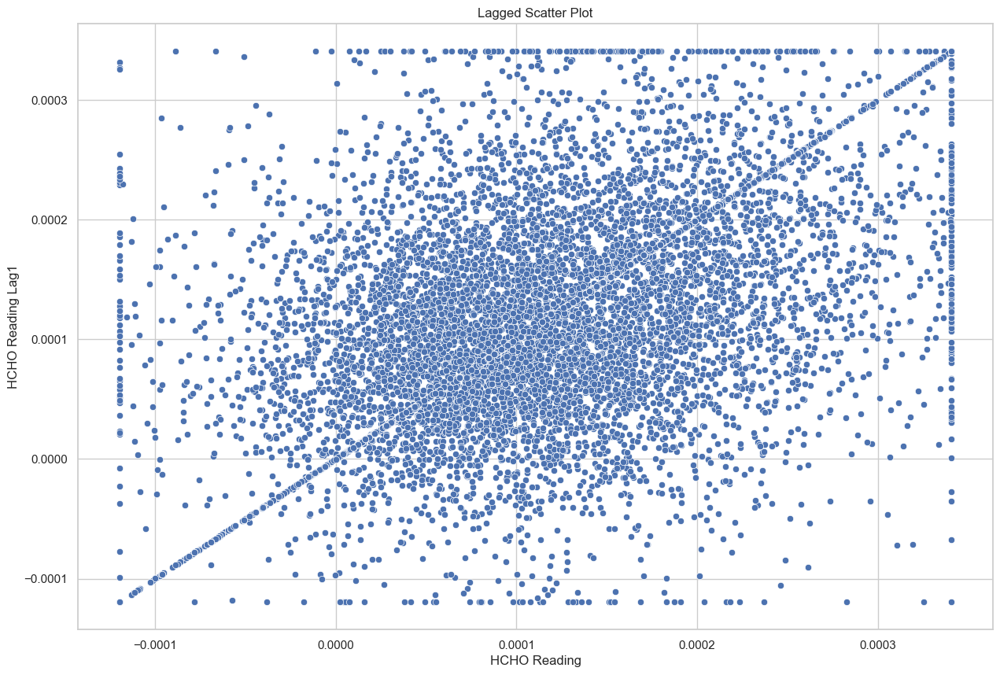

In [290]:
combined_df['HCHO Reading Lag1'] = combined_df['HCHO Reading'].shift(1)
# Lagged Scatter Plot
plt.figure(figsize=(15, 10))
sns.scatterplot(x='HCHO Reading', y='HCHO Reading Lag1', data=combined_df)
plt.title('Lagged Scatter Plot')
plt.xlabel('HCHO Reading')
plt.ylabel('HCHO Reading Lag1')
plt.grid(True)
plt.show()


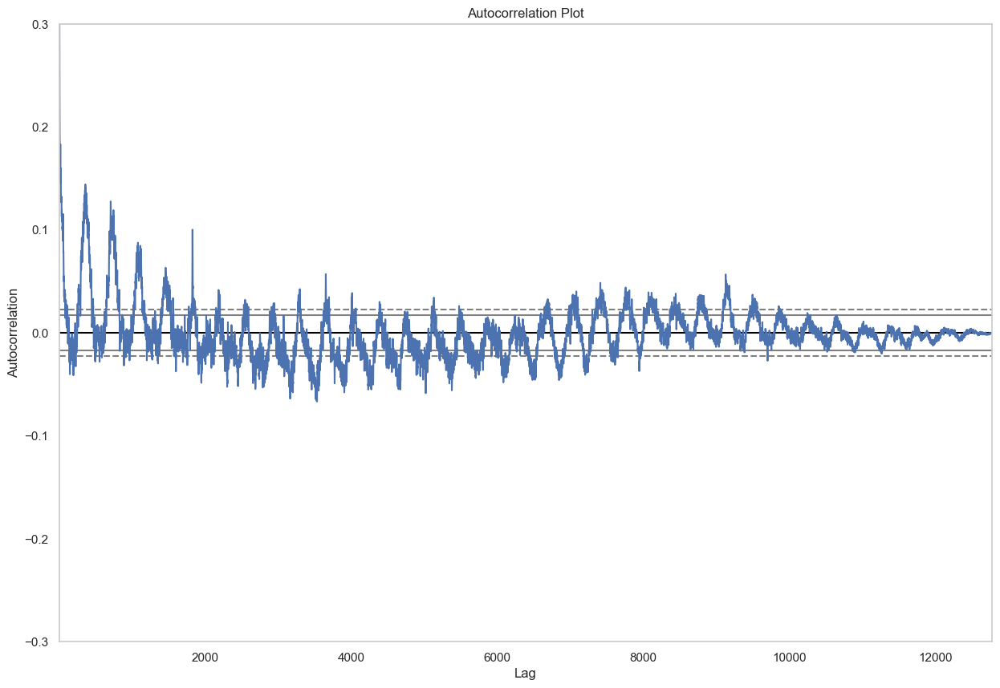

In [289]:
from pandas.plotting import autocorrelation_plot

plt.figure(figsize=(15, 10))
autocorrelation_plot(combined_df['HCHO Reading'])
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.ylim(-0.3, 0.3)  # Set y-axis limits
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

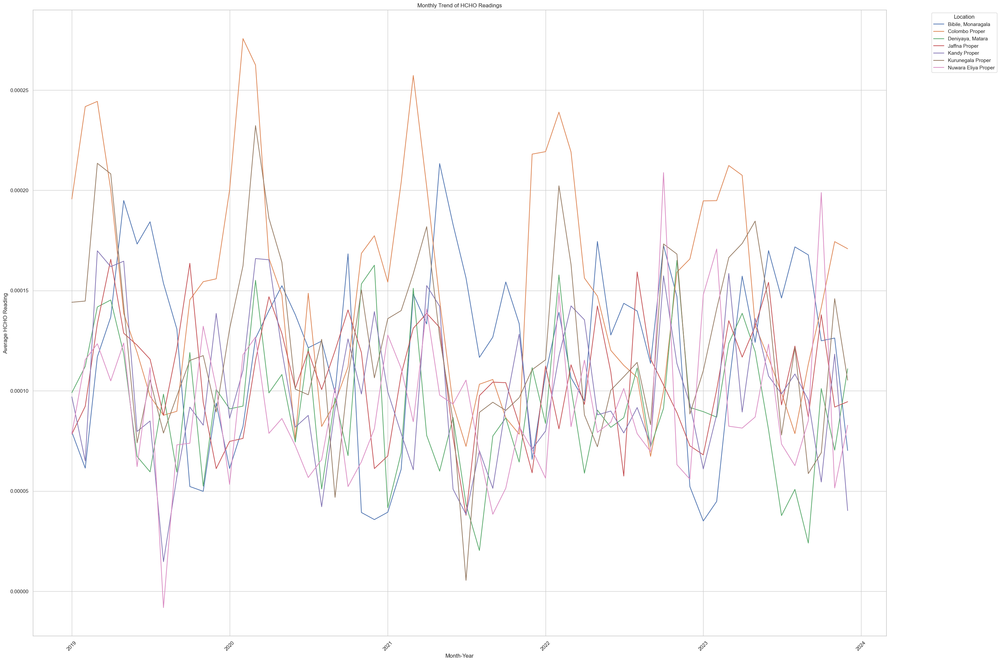

In [270]:
combined_df['Current Date'] = pd.to_datetime(combined_df['Current Date'])

combined_df['Month-Year'] = combined_df['Current Date'].dt.to_period('M')
monthly_data = combined_df.groupby(['Month-Year', 'Location'])['HCHO Reading'].mean().reset_index()
monthly_data['Month-Year'] = monthly_data['Month-Year'].dt.to_timestamp()

plt.figure(figsize=(30, 20))
sns.lineplot(x='Month-Year', y='HCHO Reading', hue='Location', data=monthly_data)
plt.title('Monthly Trend of HCHO Readings')
plt.xlabel('Month-Year')
plt.ylabel('Average HCHO Reading')
plt.xticks(rotation=45)
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

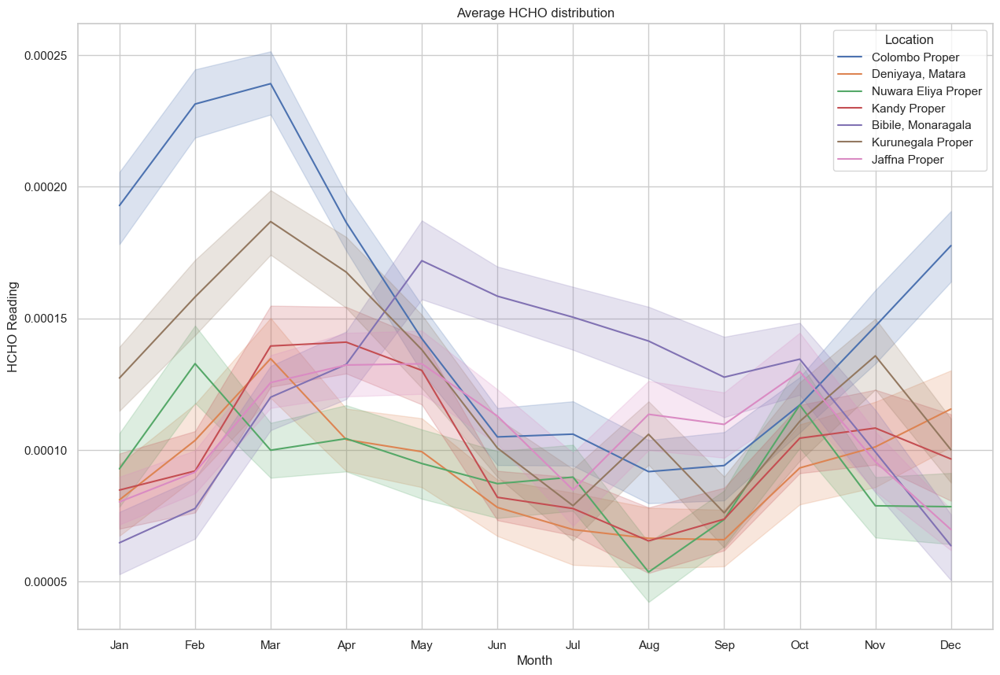

In [288]:
plt.figure(figsize=(15, 10))
sns.lineplot(x='Month', y='HCHO Reading', hue='Location', data=combined_df)
plt.title('Average HCHO distribution')
plt.xlabel('Month')
plt.ylabel('HCHO Reading')
plt.xticks(range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


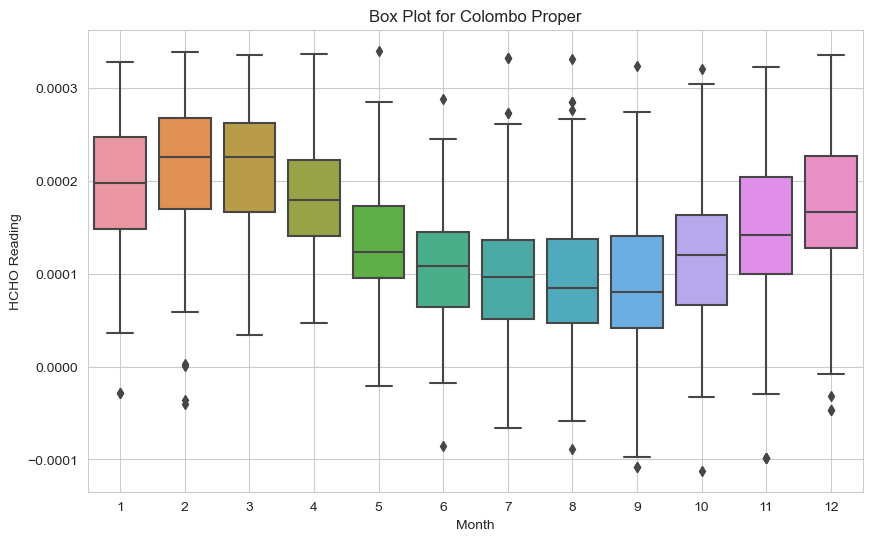

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


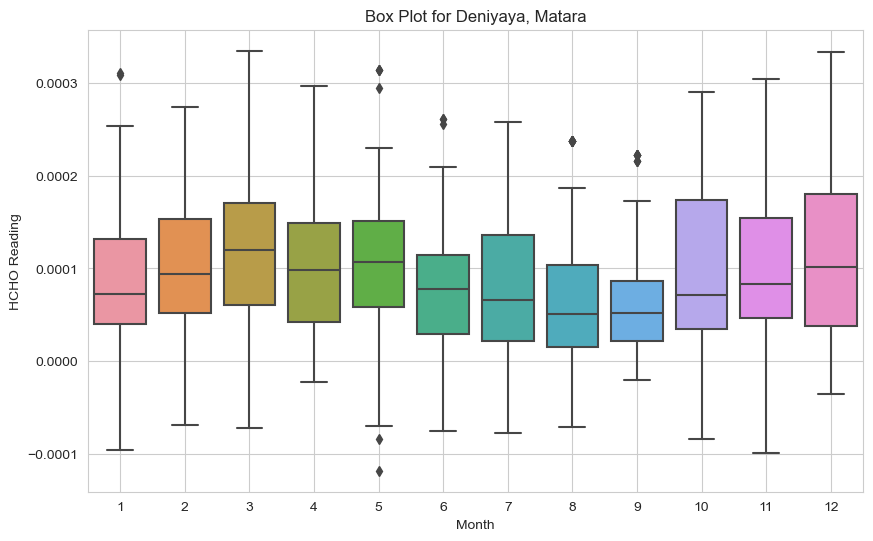

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


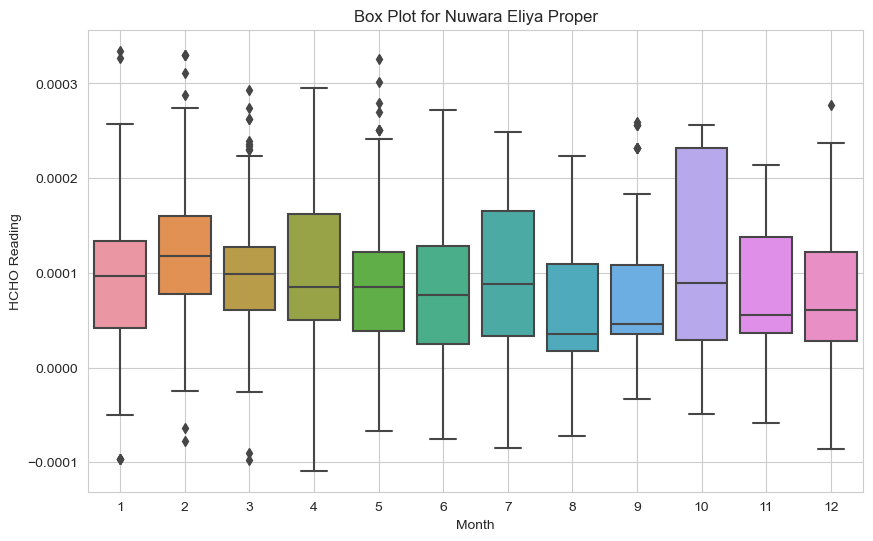

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


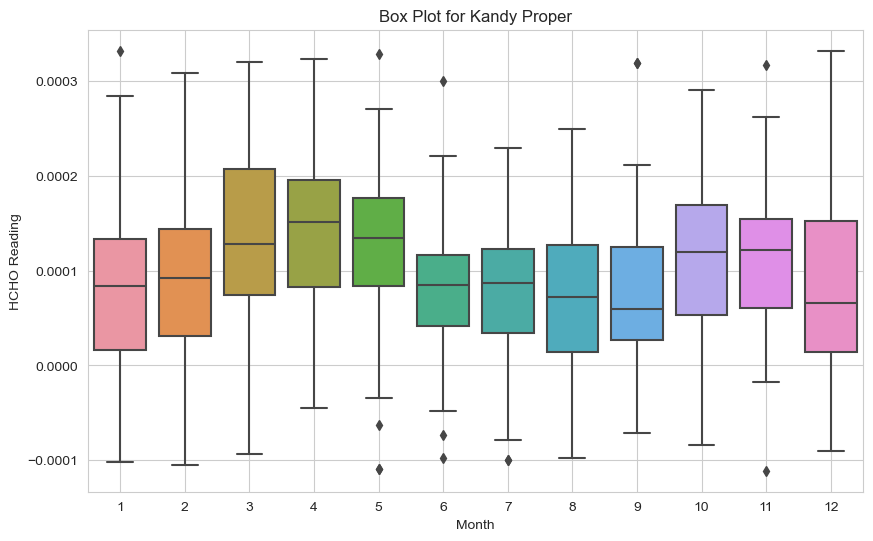

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


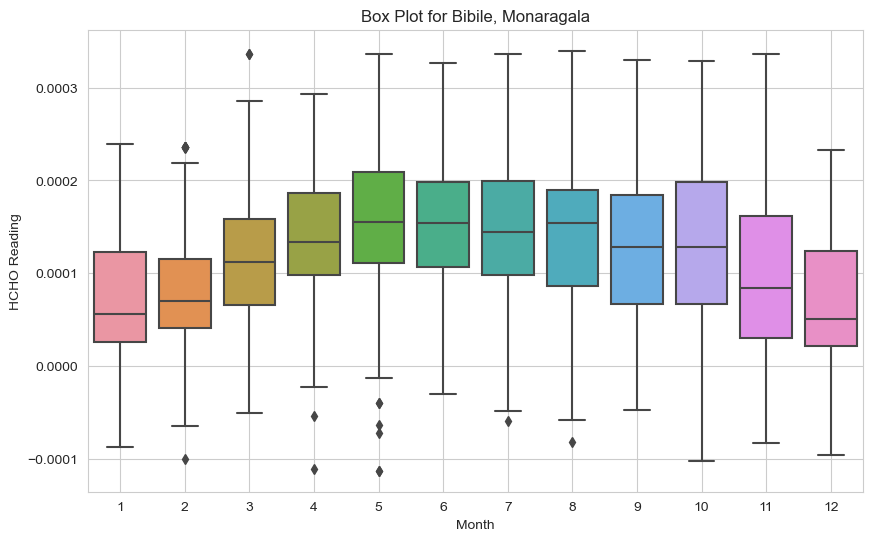

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


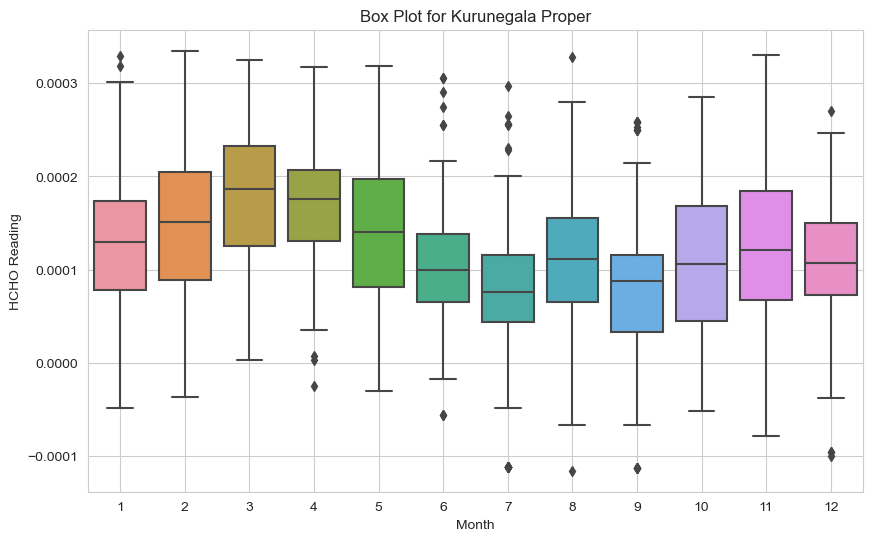

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


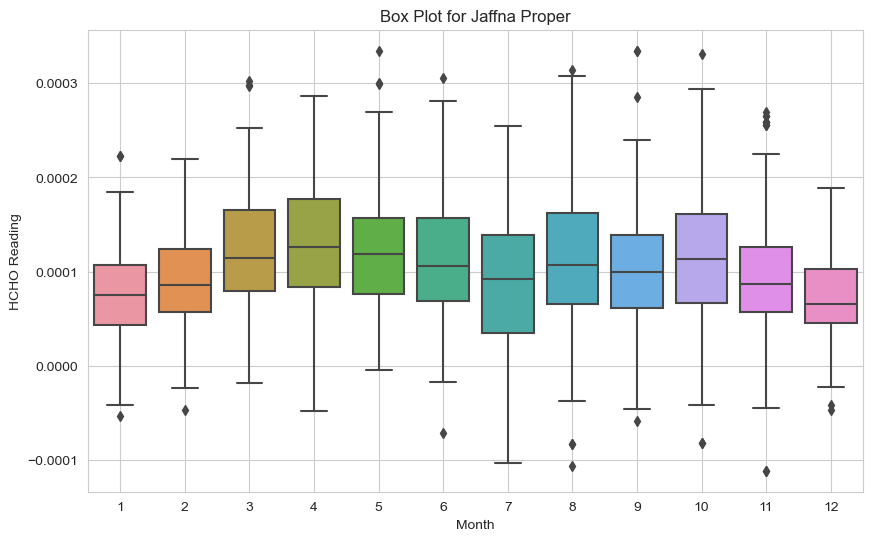

In [33]:
Locations = combined_df['Location'].unique()

for Location in Locations:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Month', y='HCHO Reading', data=combined_df[combined_df['Location'] == Location])
    plt.title(f'Box Plot for {Location}')
    plt.xlabel('Month')
    plt.ylabel('HCHO Reading')
    plt.grid(True)
    plt.show()

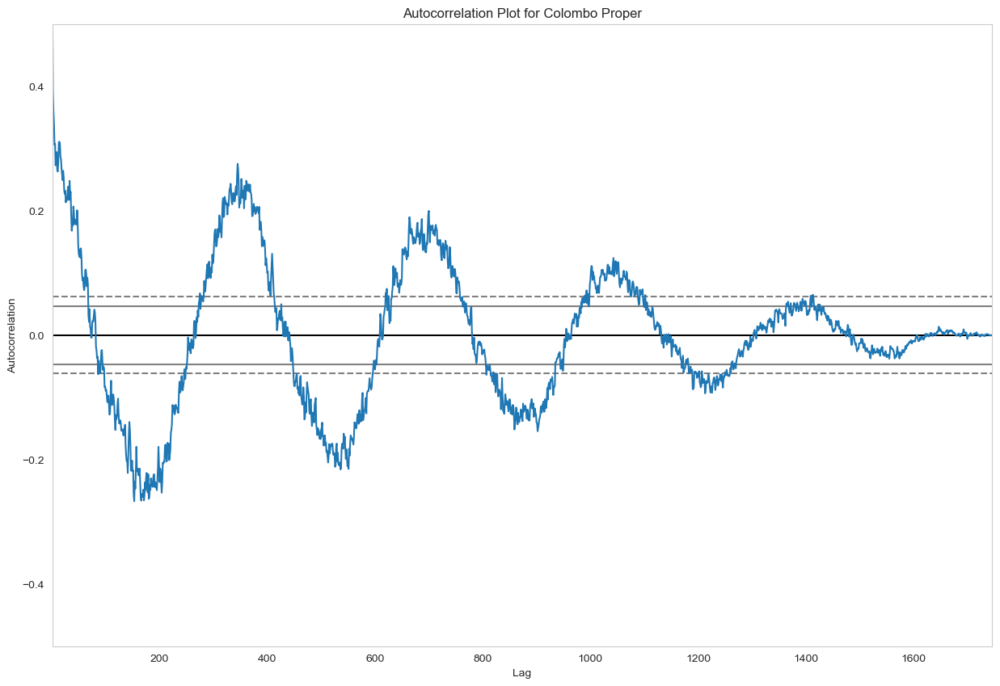

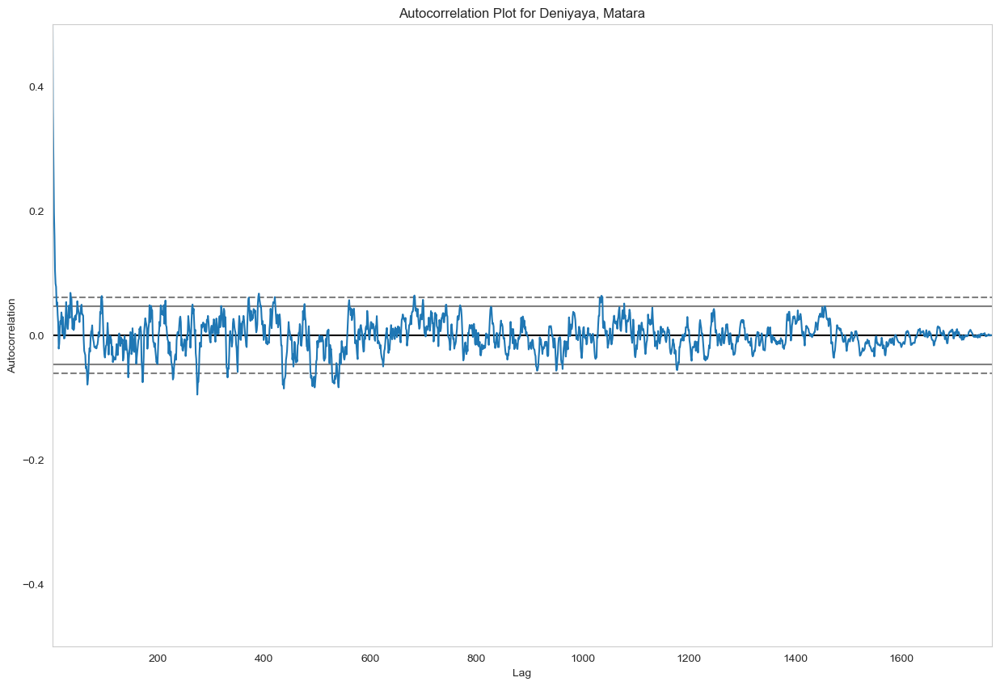

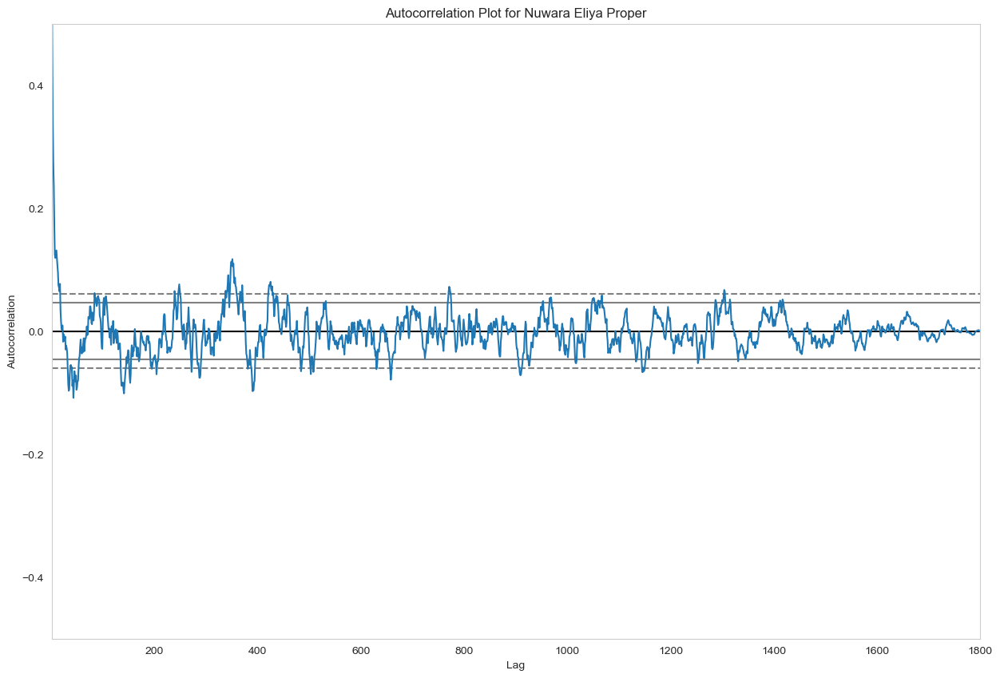

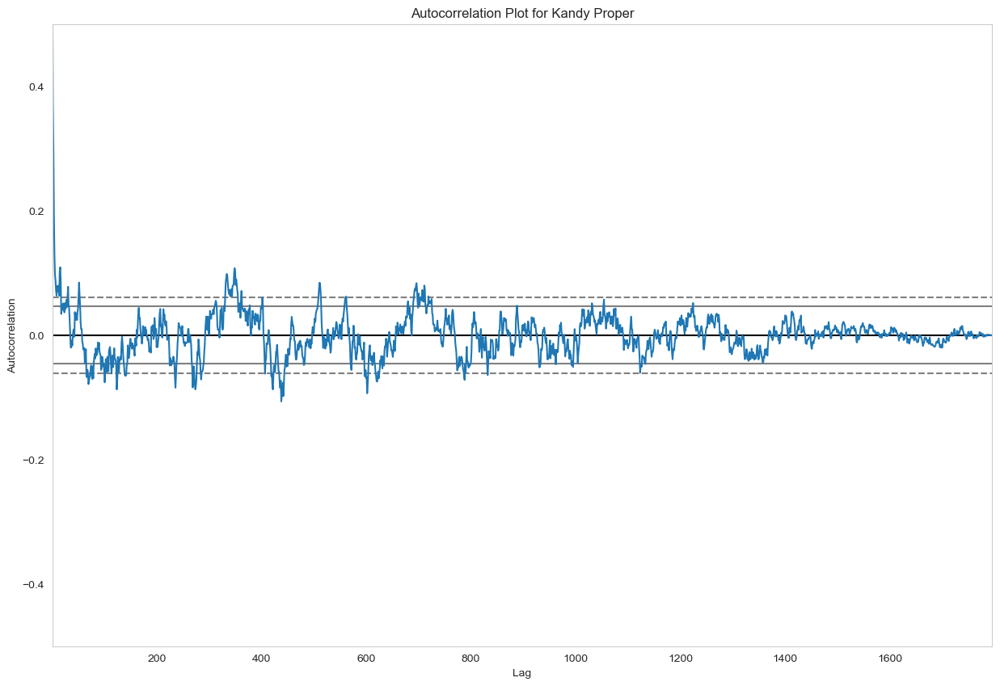

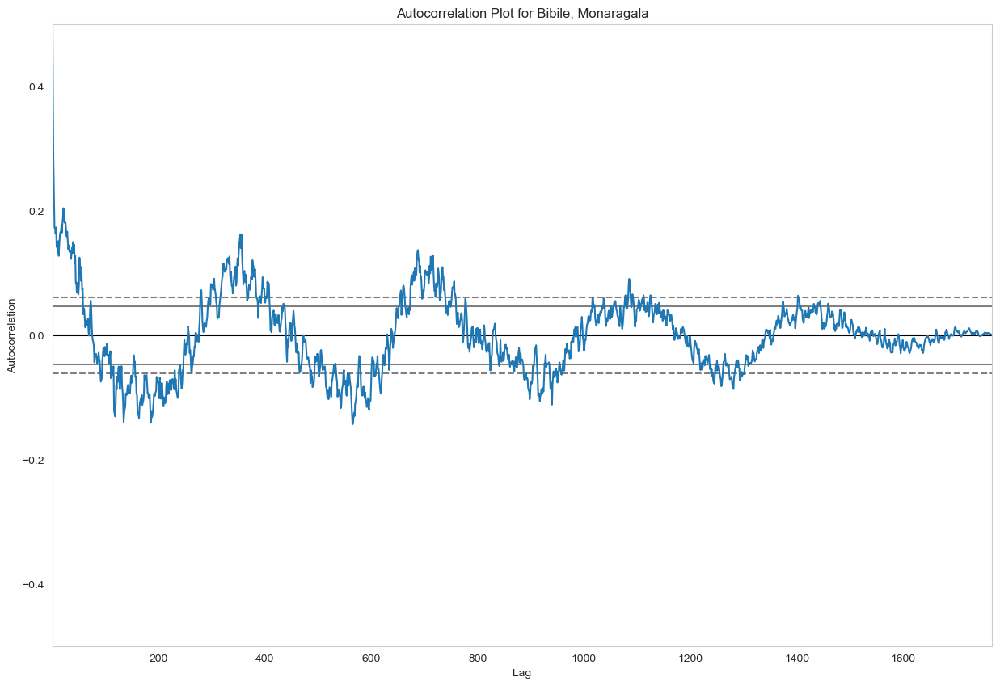

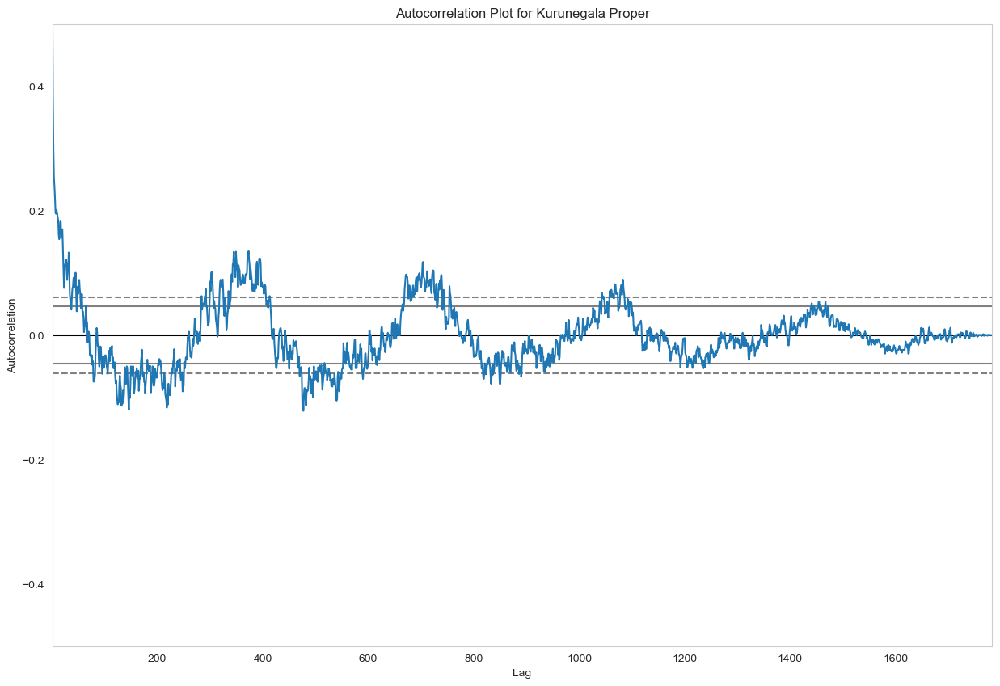

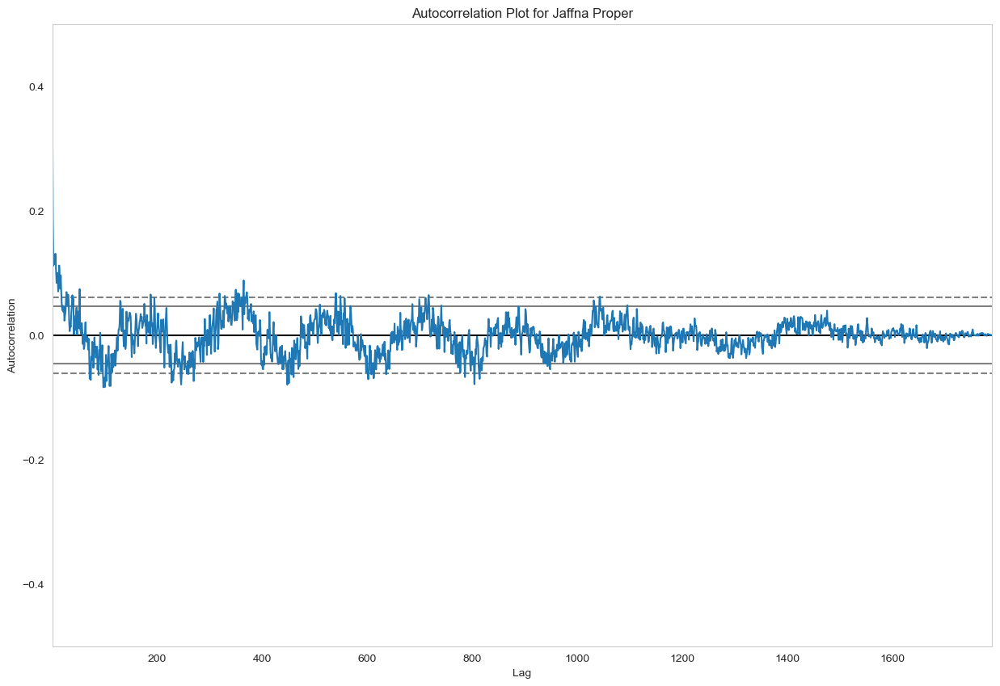

In [34]:
for location in combined_df['Location'].unique():
    plt.figure(figsize=(15, 10))
    autocorrelation_plot(combined_df[combined_df['Location'] == location]['HCHO Reading'])
    plt.title(f'Autocorrelation Plot for {location}')
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.ylim(-0.5, 0.5)  # Set y-axis limits to focus on values between -0.5 and 0.5
    plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

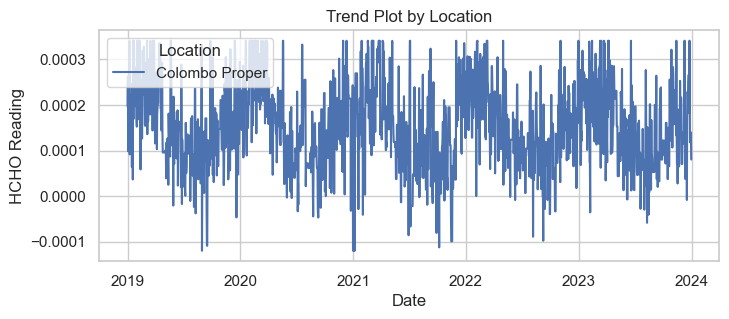

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

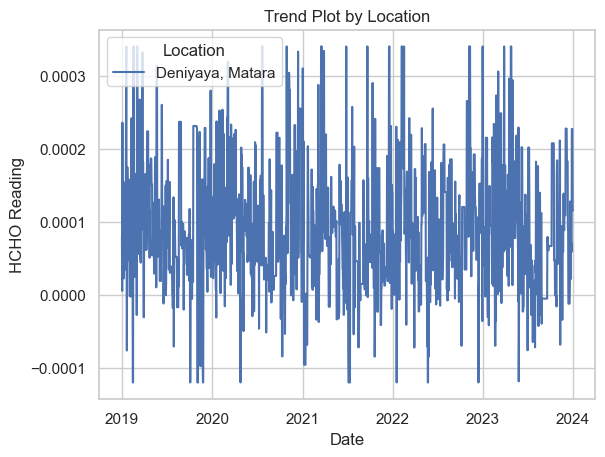

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

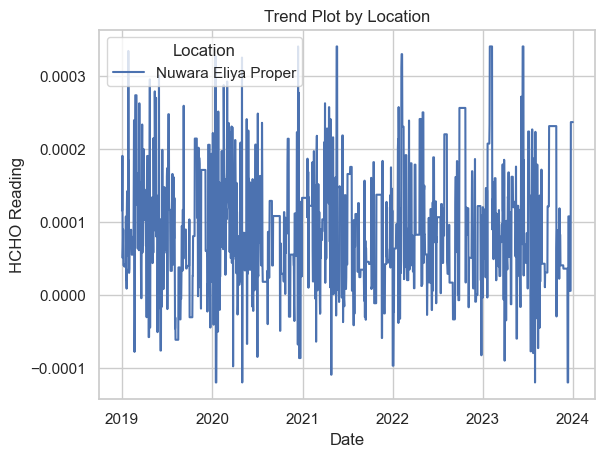

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

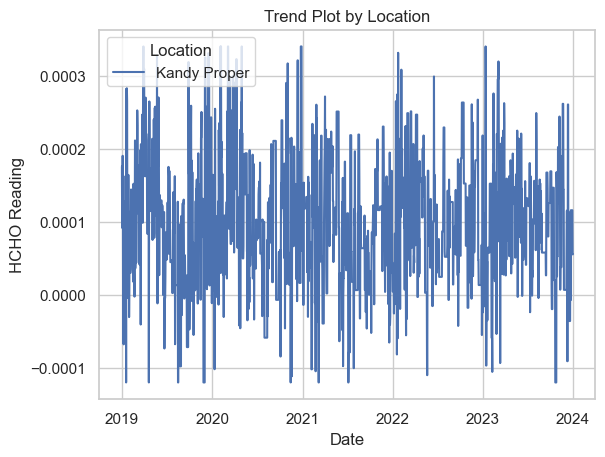

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

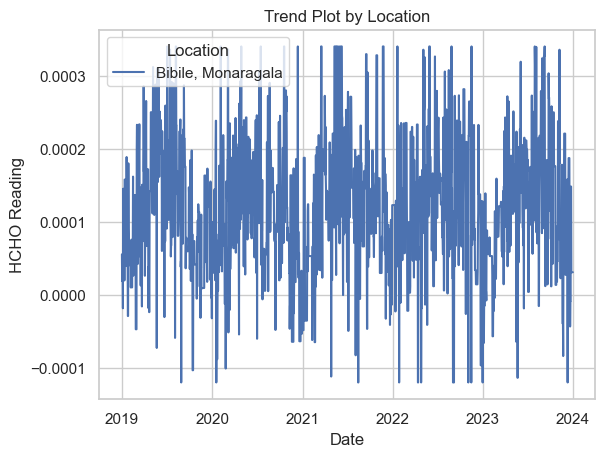

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

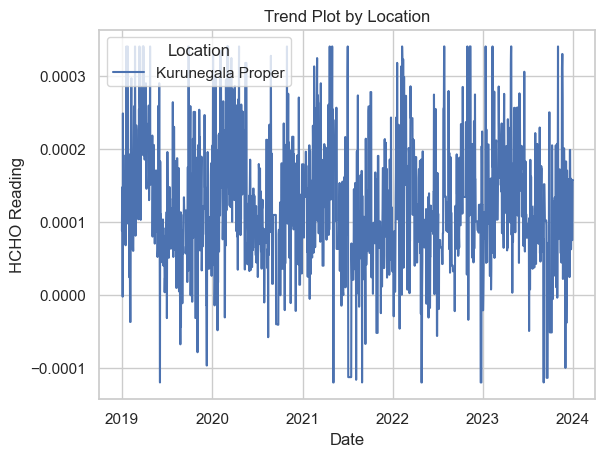

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

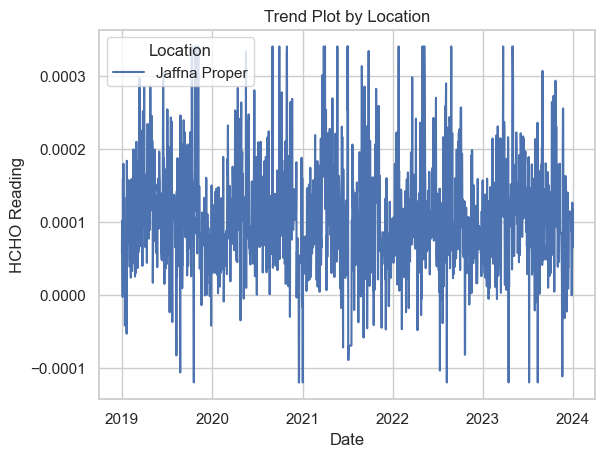

In [162]:
plt.figure(figsize=(8, 3))
for location in combined_df['Location'].unique():
    sns.lineplot(x=combined_df[combined_df['Location'] == location].index, y='HCHO Reading', data=combined_df[combined_df['Location'] == location], label=location)
    plt.title('Trend Plot by Location')
    plt.xlabel('Date')
    plt.ylabel('HCHO Reading')
    plt.legend(title='Location', loc='upper left')
    plt.grid(True)
    plt.show()


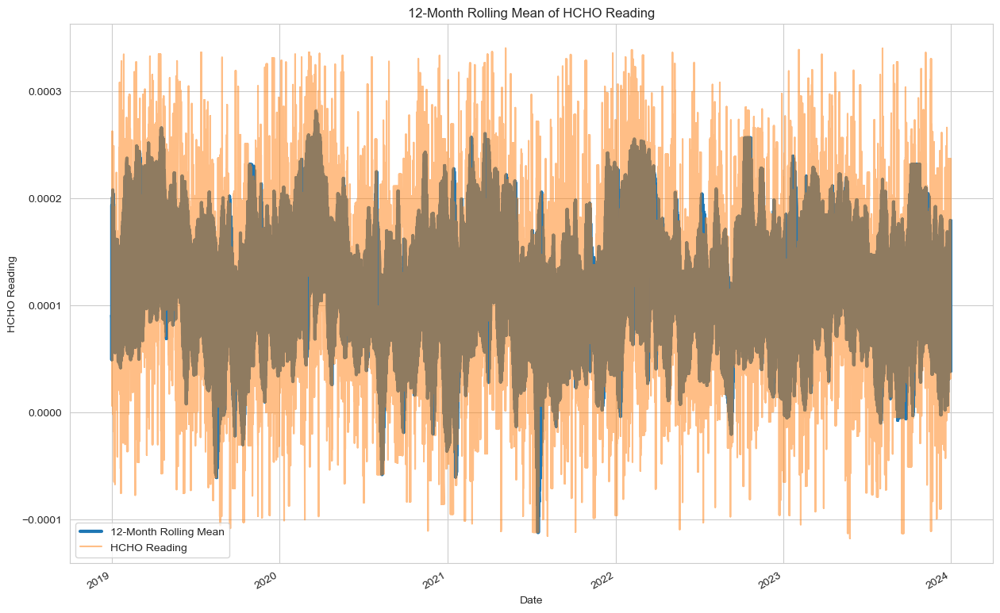

In [36]:
plt.figure(figsize=(15, 10))
combined_df['HCHO Reading'].rolling(window=12).mean().plot(label='12-Month Rolling Mean', linewidth=3)
combined_df['HCHO Reading'].plot(label='HCHO Reading', alpha=0.5)
plt.title('12-Month Rolling Mean of HCHO Reading')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.legend()
plt.grid(True)
plt.show()


#  changes in gas emissions due to the COVID-19 lockdowns

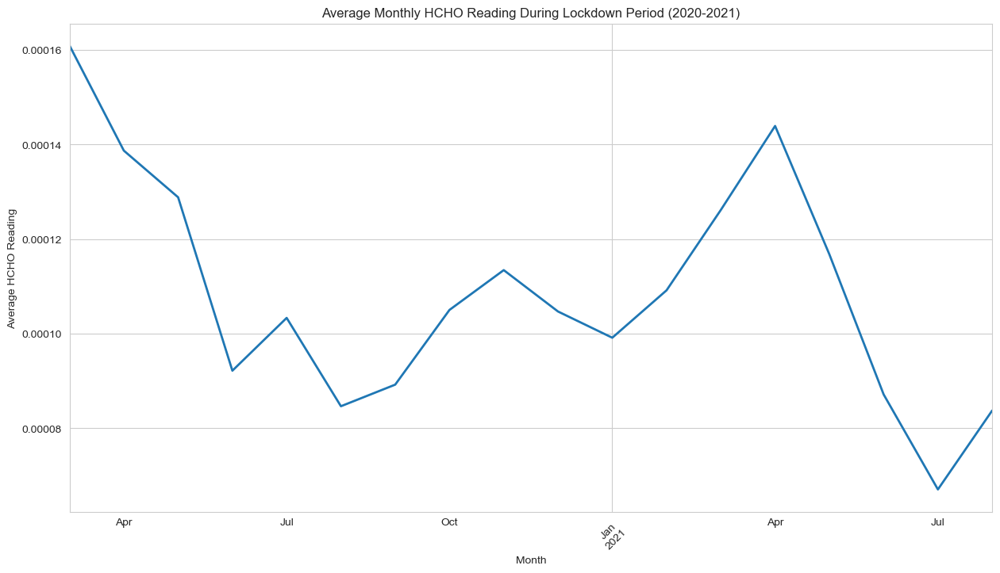

In [37]:
import pandas as pd
import matplotlib.pyplot as plt

combined_df = combined_df.sort_index()
lockdown_data = combined_df.loc['2020-03':'2021-08']
monthly_avg = lockdown_data.resample('M')['HCHO Reading'].mean()

# Plot the HCHO readings for the lockdown period
plt.figure(figsize=(15, 8))
monthly_avg.plot(linewidth=2)
plt.title('Average Monthly HCHO Reading During Lockdown Period (2020-2021)')
plt.xlabel('Month')
plt.ylabel('Average HCHO Reading')
plt.grid(True)
plt.xticks(rotation=45) 
plt.show()


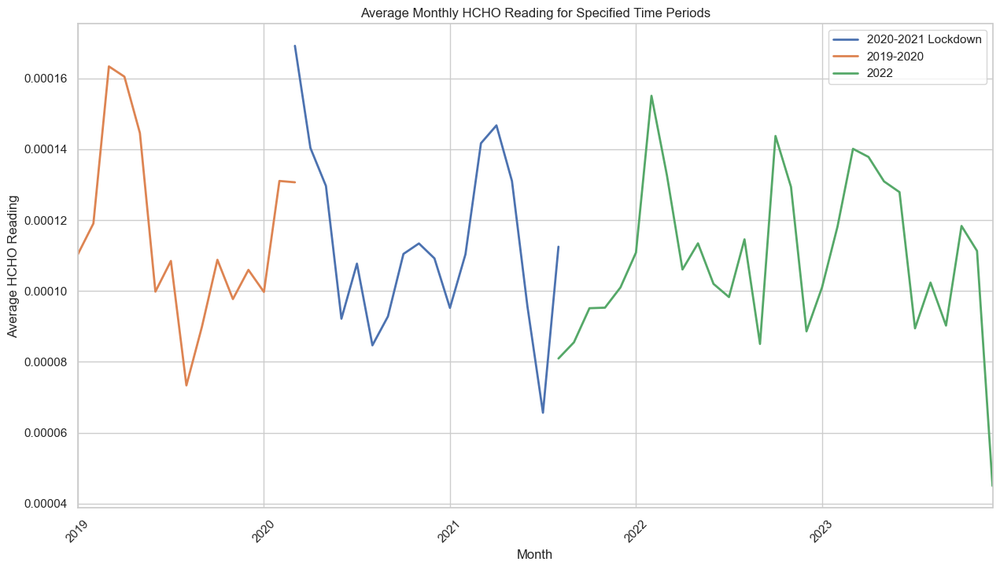

In [292]:
import pandas as pd
import matplotlib.pyplot as plt

combined_df = combined_df.sort_index()
lockdown_period = (combined_df.index >= '2020-03') & (combined_df.index <= '2021-08')
prev_year_period = (combined_df.index >= '2019-01') & (combined_df.index <= '2020-03')
next_year_period = (combined_df.index >= '2021-08') & (combined_df.index <= '2023-12')

lockdown_data = combined_df.loc[lockdown_period]
lockdown_monthly_avg = lockdown_data.resample('M')['HCHO Reading'].mean()

prev_year_data = combined_df.loc[prev_year_period]
prev_year_monthly_avg = prev_year_data.resample('M')['HCHO Reading'].mean()

next_year_data = combined_df.loc[next_year_period]
next_year_monthly_avg = next_year_data.resample('M')['HCHO Reading'].mean()

plt.figure(figsize=(15, 8))

lockdown_monthly_avg.plot(label='2020-2021 Lockdown', linewidth=2)
prev_year_monthly_avg.plot(label='2019-2020', linewidth=2)
next_year_monthly_avg.plot(label='2022', linewidth=2)

plt.title('Average Monthly HCHO Reading for Specified Time Periods')
plt.xlabel('Month')
plt.ylabel('Average HCHO Reading')
plt.grid(True)
plt.xticks(rotation=45)  
plt.legend()
plt.show()


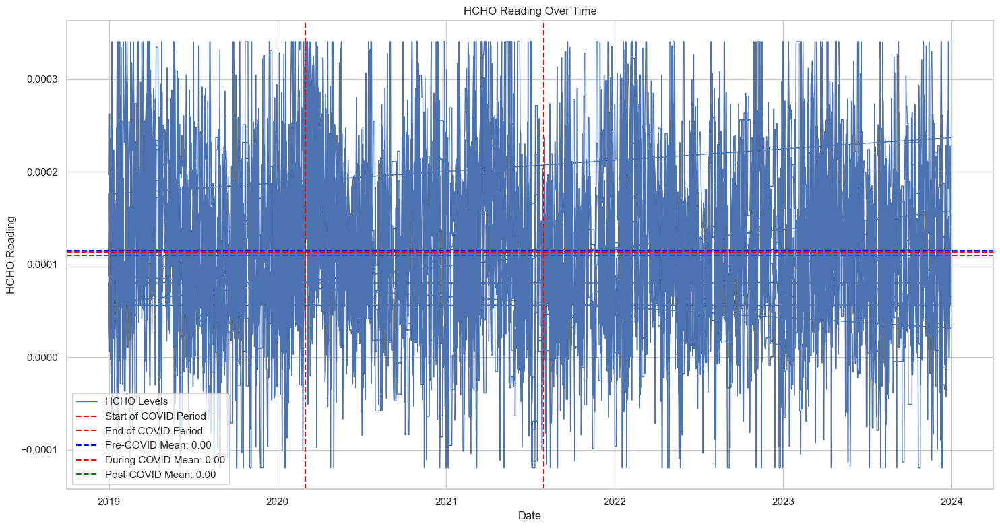

In [298]:
import pandas as pd
import matplotlib.pyplot as plt

# Define COVID period 
covid_start_date = pd.to_datetime('2020-03-01')
covid_end_date = pd.to_datetime('2021-07-31')
df1['Current Date'] = pd.to_datetime(df1['Current Date'])

# Aggregate data by calculating mean HCHO levels for each period
pre_covid_mean = df1[df1['Current Date'] < covid_start_date]['HCHO Reading'].mean()
covid_mean = df1[(df1['Current Date'] >= covid_start_date) & (df1['Current Date'] <= covid_end_date)]['HCHO Reading'].mean()
post_covid_mean = df1[df1['Current Date'] > covid_end_date]['HCHO Reading'].mean()

plt.figure(figsize=(15, 8))
plt.plot(df1['Current Date'], df1['HCHO Reading'], label='HCHO Levels', linewidth=1)
plt.axvline(x=covid_start_date, color='red', linestyle='--', label='Start of COVID Period')
plt.axvline(x=covid_end_date, color='red', linestyle='--', label='End of COVID Period')
plt.axhline(y=pre_covid_mean, color='blue', linestyle='--', label=f'Pre-COVID Mean: {pre_covid_mean:.2f}')
plt.axhline(y=covid_mean, color='red', linestyle='--', label=f'During COVID Mean: {covid_mean:.2f}')
plt.axhline(y=post_covid_mean, color='green', linestyle='--', label=f'Post-COVID Mean: {post_covid_mean:.2f}')
plt.title('HCHO Reading Over Time')
plt.xlabel('Date')
plt.ylabel('HCHO Reading')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


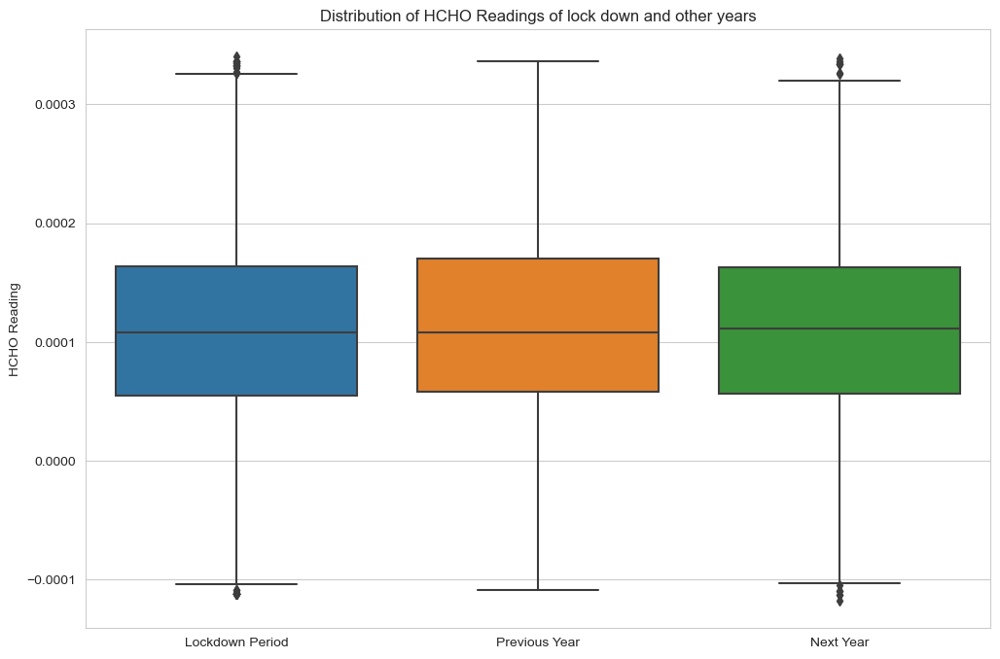

In [39]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

combined_df = combined_df.sort_index()

lockdown_period = (combined_df.index >= '2020-03') & (combined_df.index <= '2021-08')
prev_year_period = (combined_df.index >= '2019-03') & (combined_df.index <= '2020-03')
next_year_period = (combined_df.index >= '2022-03') & (combined_df.index <= '2023-08')

# Filter the data for the lockdown period
lockdown_data = combined_df.loc[lockdown_period, 'HCHO Reading'].values.tolist()
# Filter the data for the previous year period
prev_year_data = combined_df.loc[prev_year_period, 'HCHO Reading'].values.tolist()
# Filter the data for the next year period
next_year_data = combined_df.loc[next_year_period, 'HCHO Reading'].values.tolist()

# Create a list of lists for box plot
box_data = [lockdown_data, prev_year_data, next_year_data]

plt.figure(figsize=(12, 8))
sns.boxplot(data=box_data)
plt.title('Distribution of HCHO Readings of lock down and other years')
plt.ylabel('HCHO Reading')
plt.xticks([0, 1, 2], ['Lockdown Period', 'Previous Year', 'Next Year'])
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

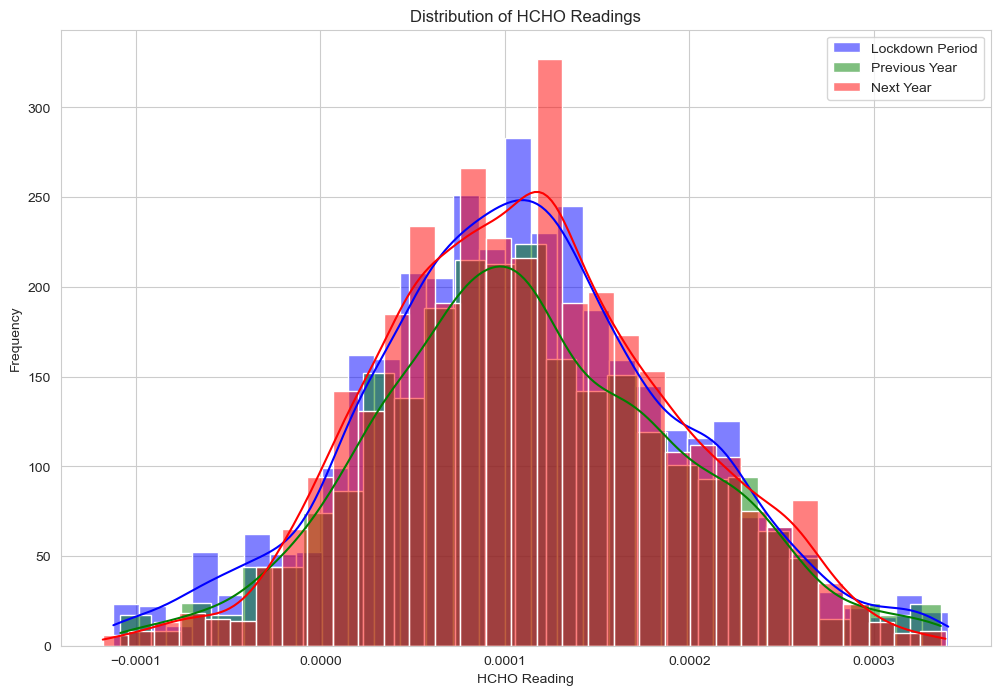

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

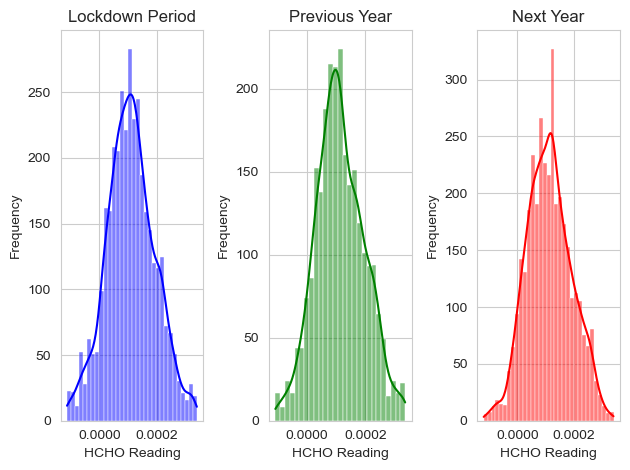

In [40]:
plt.figure(figsize=(12, 8))
sns.histplot(lockdown_data, kde=True, label='Lockdown Period', color='blue')
sns.histplot(prev_year_data, kde=True, label='Previous Year', color='green')
sns.histplot(next_year_data, kde=True, label='Next Year', color='red')
plt.title('Distribution of HCHO Readings')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()

plt.subplot(1, 3, 1)
sns.histplot(lockdown_data, kde=True, color='blue')
plt.title('Lockdown Period')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Previous Year Histogram
plt.subplot(1, 3, 2)
sns.histplot(prev_year_data, kde=True, color='green')
plt.title('Previous Year')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

# Next Year Histogram
plt.subplot(1, 3, 3)
sns.histplot(next_year_data, kde=True, color='red')
plt.title('Next Year')
plt.xlabel('HCHO Reading')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

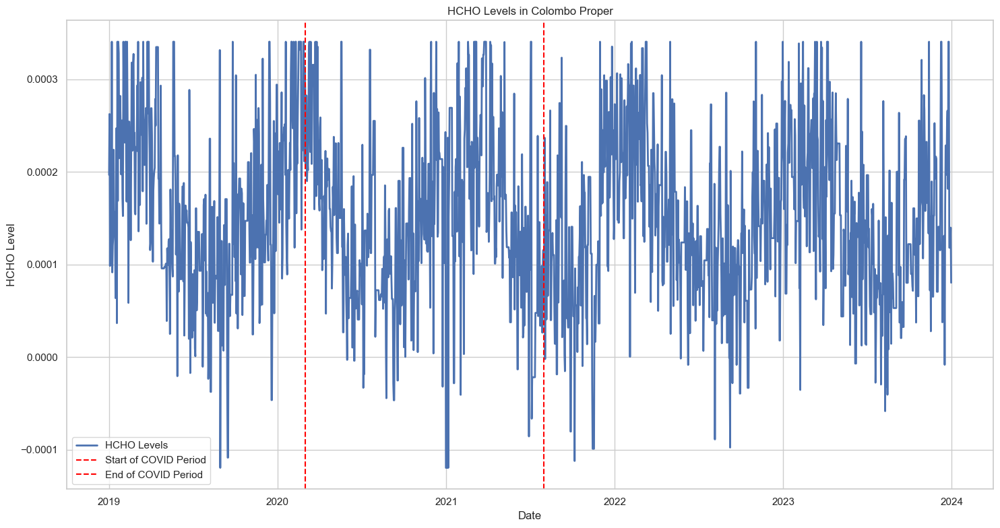

Mean HCHO levels in Colombo Proper:
Pre-COVID: 0.00016683822376281252
During COVID: 0.00015068667104075497
Post-COVID: 0.00014595330631280316


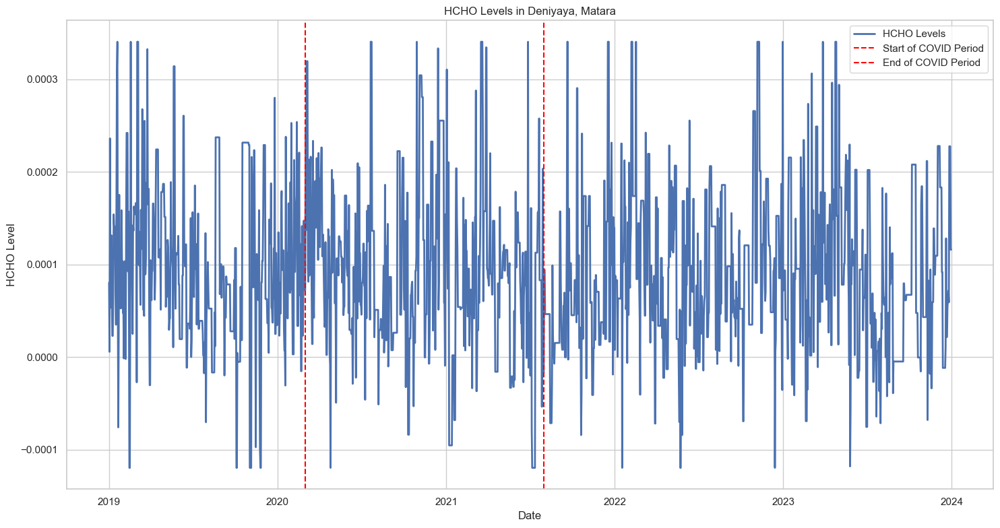

Mean HCHO levels in Deniyaya, Matara:
Pre-COVID: 9.7041839170594e-05
During COVID: 9.538400009394354e-05
Post-COVID: 8.907043669128468e-05


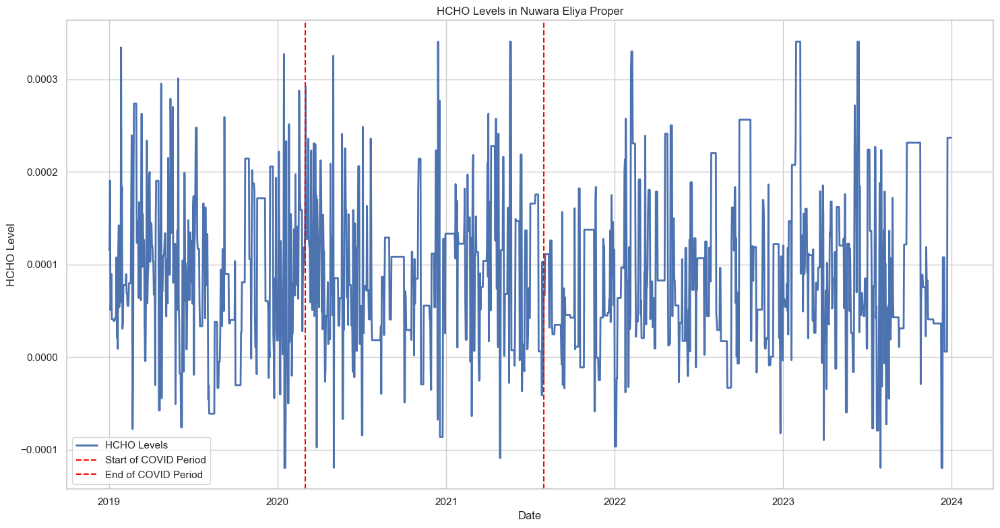

Mean HCHO levels in Nuwara Eliya Proper:
Pre-COVID: 8.9995180841473e-05
During COVID: 9.094349264873493e-05
Post-COVID: 9.293512460948089e-05


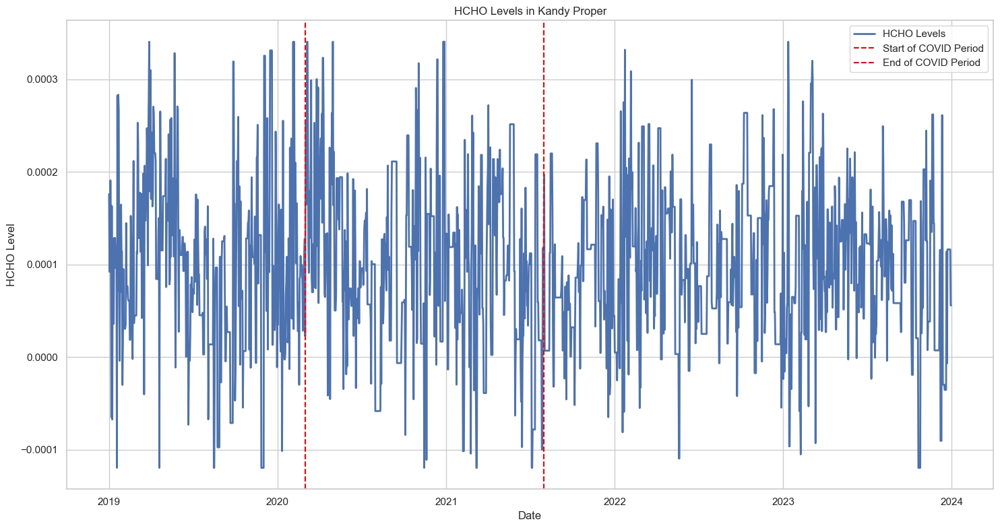

Mean HCHO levels in Kandy Proper:
Pre-COVID: 0.00010063017495819301
During COVID: 0.00010253322231822464
Post-COVID: 9.757302594621811e-05


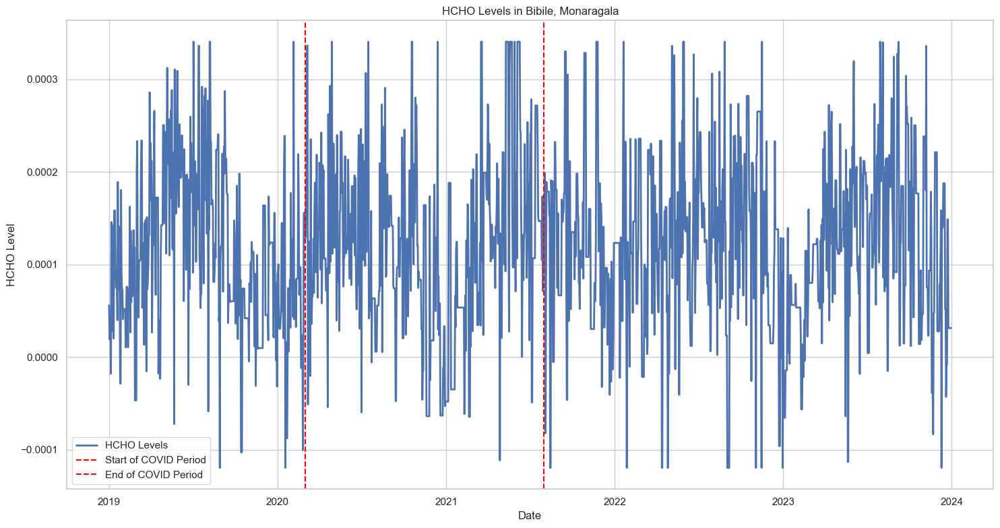

Mean HCHO levels in Bibile, Monaragala:
Pre-COVID: 0.000112647134570076
During COVID: 0.00012273657628956918
Post-COVID: 0.00012277460912766741


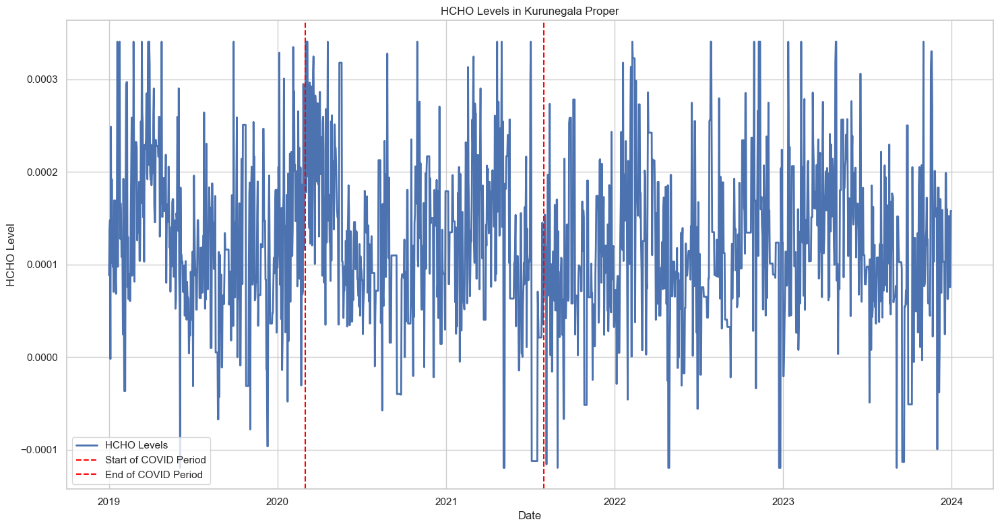

Mean HCHO levels in Kurunegala Proper:
Pre-COVID: 0.00013014677035401225
During COVID: 0.00012648318820228187
Post-COVID: 0.00011880954953999136


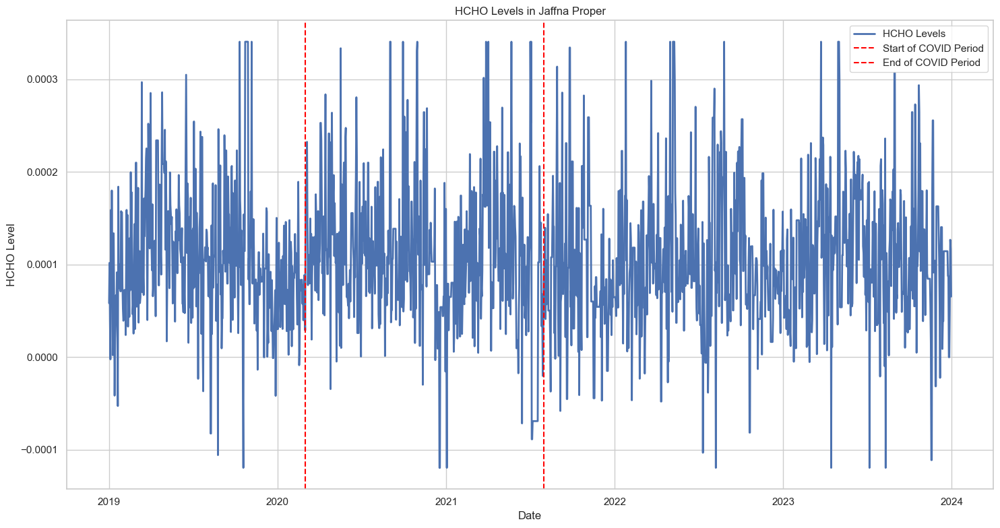

Mean HCHO levels in Jaffna Proper:
Pre-COVID: 0.00010842621239320773
During COVID: 0.00010845345218468579
Post-COVID: 0.00010462282271580804


In [296]:
covid_start_date = pd.to_datetime('2020-03-01')
covid_end_date = pd.to_datetime('2021-07-31')
df1['Current Date'] = pd.to_datetime(df1['Current Date'])

unique_locations = df1['Location'].unique()

for location in unique_locations:
    location_data = df1[df1['Location'] == location]
    
    # Dividing data into pre-COVID, COVID, and post-COVID periods
    pre_covid_data = location_data[location_data['Current Date'] < covid_start_date]
    covid_data = location_data[(location_data['Current Date'] >= covid_start_date) & (location_data['Current Date'] <= covid_end_date)]
    post_covid_data = location_data[location_data['Current Date'] > covid_end_date]

    # Aggregate data by calculating mean HCHO levels for each period
    pre_covid_mean = pre_covid_data['HCHO Reading'].mean()
    covid_mean = covid_data['HCHO Reading'].mean()
    post_covid_mean = post_covid_data['HCHO Reading'].mean()

    # Visualize data
    plt.figure(figsize=(15, 8))
    plt.plot(location_data['Current Date'], location_data['HCHO Reading'], label='HCHO Levels', linewidth=2)
    plt.axvline(x=covid_start_date, color='red', linestyle='--', label='Start of COVID Period')
    plt.axvline(x=covid_end_date, color='red', linestyle='--', label='End of COVID Period')
    plt.title(f'HCHO Levels in {location}')
    plt.xlabel('Date')
    plt.ylabel('HCHO Level')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    print(f"Mean HCHO levels in {location}:")
    print("Pre-COVID:", pre_covid_mean)
    print("During COVID:", covid_mean)
    print("Post-COVID:", post_covid_mean)


# Correlate HCHO levels with external factors

In [41]:
weather_df = pd.read_csv('SriLanka_Weather_Dataset.csv')  
weather_df

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,2010-01-01,2,30.0,22.7,26.1,34.4,25.2,29.2,2010-01-01T00:52,2010-01-01T12:35,...,0.0,11.7,27.4,20,4.58,7.000000,79.899994,16.0,Sri Lanka,Colombo
1,2010-01-02,51,29.9,23.5,26.2,33.8,26.2,29.8,2010-01-02T00:52,2010-01-02T12:36,...,1.0,13.0,27.0,24,3.84,7.000000,79.899994,16.0,Sri Lanka,Colombo
2,2010-01-03,51,29.5,23.2,26.0,34.3,26.3,29.9,2010-01-03T00:53,2010-01-03T12:36,...,3.0,12.3,27.4,16,3.65,7.000000,79.899994,16.0,Sri Lanka,Colombo
3,2010-01-04,2,28.9,21.9,25.3,31.6,23.4,27.8,2010-01-04T00:53,2010-01-04T12:37,...,0.0,17.0,34.6,356,3.79,7.000000,79.899994,16.0,Sri Lanka,Colombo
4,2010-01-05,1,28.1,21.3,24.5,30.1,23.1,26.1,2010-01-05T00:53,2010-01-05T12:37,...,0.0,18.7,37.1,355,4.97,7.000000,79.899994,16.0,Sri Lanka,Colombo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147475,2023-06-13,63,29.2,24.7,26.6,35.4,29.2,31.6,2023-06-13T00:24,2023-06-13T12:55,...,23.0,15.6,43.6,229,3.41,6.900002,80.000000,20.0,Sri Lanka,Oruwala
147476,2023-06-14,61,29.1,25.4,26.9,34.3,30.4,32.0,2023-06-14T00:24,2023-06-14T12:55,...,19.0,16.4,40.0,224,3.00,6.900002,80.000000,20.0,Sri Lanka,Oruwala
147477,2023-06-15,51,29.8,25.5,27.3,36.6,30.7,32.7,2023-06-15T00:24,2023-06-15T12:56,...,17.0,12.6,32.4,218,3.21,6.900002,80.000000,20.0,Sri Lanka,Oruwala
147478,2023-06-16,53,30.5,25.5,27.7,36.2,30.1,32.4,2023-06-16T00:25,2023-06-16T12:56,...,24.0,20.5,41.8,236,3.97,6.900002,80.000000,20.0,Sri Lanka,Oruwala


In [42]:
weather_df.isnull().sum()

time                          0
weathercode                   0
temperature_2m_max            0
temperature_2m_min            0
temperature_2m_mean           0
apparent_temperature_max      0
apparent_temperature_min      0
apparent_temperature_mean     0
sunrise                       0
sunset                        0
shortwave_radiation_sum       0
precipitation_sum             0
rain_sum                      0
snowfall_sum                  0
precipitation_hours           0
windspeed_10m_max             0
windgusts_10m_max             0
winddirection_10m_dominant    0
et0_fao_evapotranspiration    0
latitude                      0
longitude                     0
elevation                     0
country                       0
city                          0
dtype: int64

In [43]:
data = weather_df.drop_duplicates()
data.shape

(147480, 24)

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


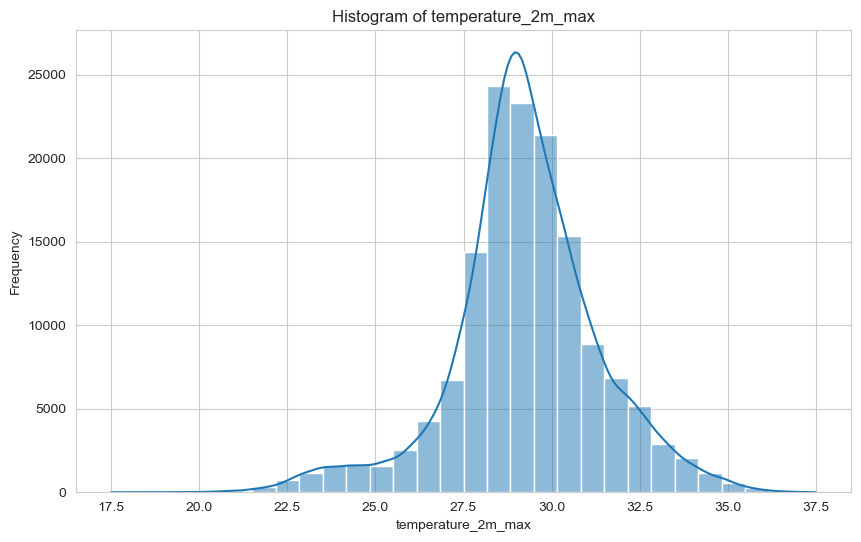

In [44]:
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='temperature_2m_max', bins=30, kde=True)
plt.title('Histogram of temperature_2m_max')
plt.xlabel('temperature_2m_max')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


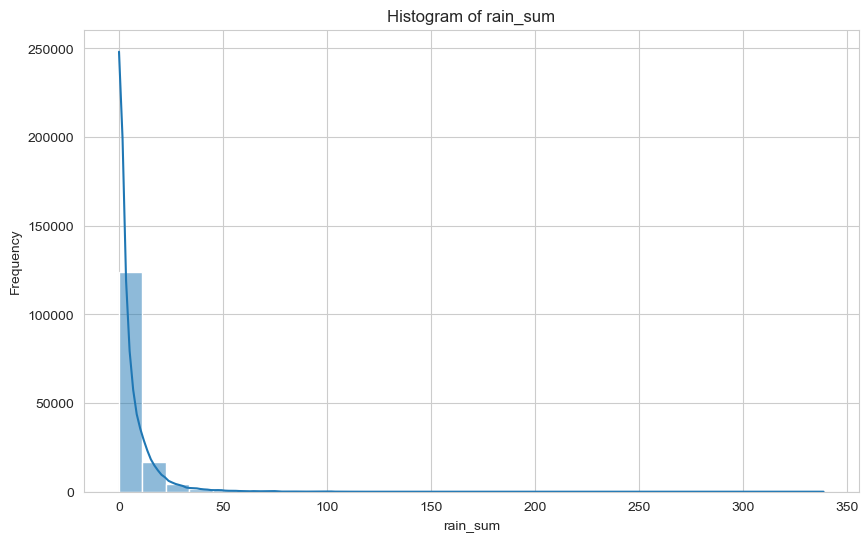

In [45]:
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='rain_sum', bins=30, kde=True)
plt.title('Histogram of rain_sum')
plt.xlabel('rain_sum')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


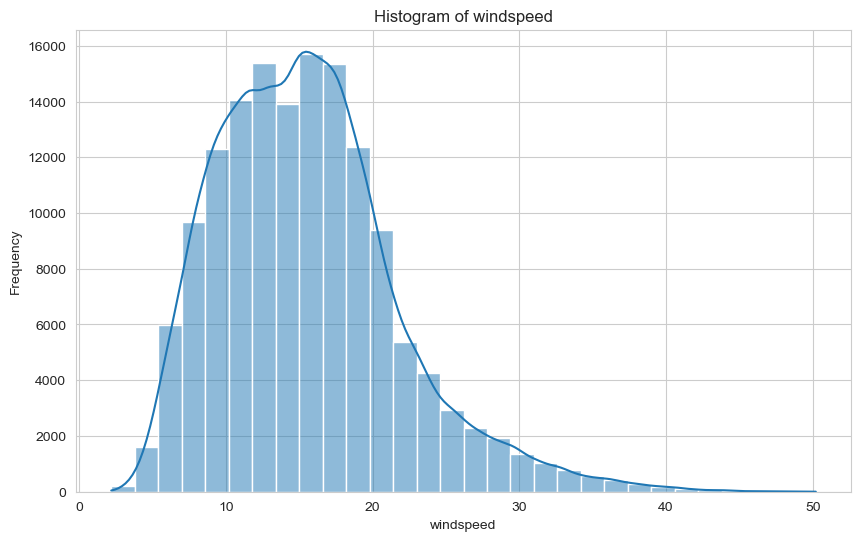

In [46]:
plt.figure(figsize=(10, 6))
sns.histplot(data=weather_df, x='windspeed_10m_max', bins=30, kde=True)
plt.title('Histogram of windspeed')
plt.xlabel('windspeed')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [47]:
weather_df['city'].unique()

array(['Colombo', 'Mount Lavinia', 'Kesbewa', 'Moratuwa', 'Maharagama',
       'Ratnapura', 'Kandy', 'Negombo', 'Sri Jayewardenepura Kotte',
       'Kalmunai', 'Trincomalee', 'Galle', 'Jaffna', 'Athurugiriya',
       'Weligama', 'Matara', 'Kolonnawa', 'Gampaha', 'Puttalam',
       'Badulla', 'Kalutara', 'Bentota', 'Matale', 'Mannar', 'Pothuhera',
       'Kurunegala', 'Mabole', 'Hatton', 'Hambantota', 'Oruwala'],
      dtype=object)

In [48]:
cities_to_keep = ['Colombo', 'Kandy', 'Kurunegala', 'Jaffna', 'Matara']
weather_df = weather_df[weather_df['city'].isin(cities_to_keep)]

weather_df.shape

(24580, 24)

In [49]:
weather_df

,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,sunset,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,2010-01-01,2,30.0,22.7,26.1,34.4,25.2,29.2,2010-01-01T00:52,2010-01-01T12:35,...,0.0,11.7,27.4,20,4.58,7.0,79.899994,16.0,Sri Lanka,Colombo
1,2010-01-02,51,29.9,23.5,26.2,33.8,26.2,29.8,2010-01-02T00:52,2010-01-02T12:36,...,1.0,13.0,27.0,24,3.84,7.0,79.899994,16.0,Sri Lanka,Colombo
2,2010-01-03,51,29.5,23.2,26.0,34.3,26.3,29.9,2010-01-03T00:53,2010-01-03T12:36,...,3.0,12.3,27.4,16,3.65,7.0,79.899994,16.0,Sri Lanka,Colombo
3,2010-01-04,2,28.9,21.9,25.3,31.6,23.4,27.8,2010-01-04T00:53,2010-01-04T12:37,...,0.0,17.0,34.6,356,3.79,7.0,79.899994,16.0,Sri Lanka,Colombo
4,2010-01-05,1,28.1,21.3,24.5,30.1,23.1,26.1,2010-01-05T00:53,2010-01-05T12:37,...,0.0,18.7,37.1,355,4.97,7.0,79.899994,16.0,Sri Lanka,Colombo
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127811,2023-06-13,61,29.3,24.5,26.1,34.2,28.0,29.7,2023-06-13T00:21,2023-06-13T12:55,...,14.0,18.9,49.3,212,3.81,7.5,80.399994,124.0,Sri Lanka,Kurunegala
127812,2023-06-14,53,29.1,24.7,26.7,33.8,28.0,30.2,2023-06-14T00:22,2023-06-14T12:55,...,8.0,19.9,43.6,208,4.09,7.5,80.399994,124.0,Sri Lanka,Kurunegala
127813,2023-06-15,51,30.0,25.1,27.1,34.8,28.3,30.7,2023-06-15T00:22,2023-06-15T12:55,...,9.0,17.2,40.7,207,4.15,7.5,80.399994,124.0,Sri Lanka,Kurunegala
127814,2023-06-16,51,29.8,24.8,27.1,34.3,28.3,30.7,2023-06-16T00:22,2023-06-16T12:55,...,15.0,21.3,46.1,214,4.35,7.5,80.399994,124.0,Sri Lanka,Kurunegala


In [50]:
city_mapping = {
    'Colombo': 'Colombo Proper',
    'Kandy': 'Kandy Proper',
    'Kurunegala': 'Kurunegala Proper',
    'Jaffna': 'Jaffna Proper',
    'Matara': 'Deniyaya, Matara'
}

weather_df['city'] = weather_df['city'].map(city_mapping)

weather_df['city'].unique()

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4022258061.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_df['city'] = weather_df['city'].map(city_mapping)


array(['Colombo Proper', 'Kandy Proper', 'Jaffna Proper',
       'Deniyaya, Matara', 'Kurunegala Proper'], dtype=object)

In [51]:
df1['Location'].unique()

array(['Colombo Proper', 'Deniyaya, Matara', 'Nuwara Eliya Proper',
       'Kandy Proper', 'Bibile, Monaragala', 'Kurunegala Proper',
       'Jaffna Proper'], dtype=object)

In [52]:
import pandas as pd

df1['Current Date'] = pd.to_datetime(df1['Current Date'])
weather_df['time'] = pd.to_datetime(weather_df['time'])

# Merge the HCHO and weather datasets
combined_weather_df = pd.merge(df1, weather_df, left_on=['Current Date', 'Location'], right_on=['time', 'city'], how='inner')
combined_weather_df


C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1619465198.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weather_df['time'] = pd.to_datetime(weather_df['time'])


,HCHO Reading,Location,Current Date,Next Date,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,0.000197,Colombo Proper,2019-01-01,2019-01-02,2019-01-01,2,30.0,23.1,26.1,33.2,...,0.0,14.4,29.9,14,4.58,7.000000,79.899994,16.0,Sri Lanka,Colombo Proper
1,0.000263,Colombo Proper,2019-01-02,2019-01-03,2019-01-02,1,29.4,22.7,25.7,32.6,...,0.0,16.6,31.0,11,5.19,7.000000,79.899994,16.0,Sri Lanka,Colombo Proper
2,0.000099,Colombo Proper,2019-01-03,2019-01-04,2019-01-03,0,30.2,22.6,26.1,33.4,...,0.0,16.0,31.0,10,5.21,7.000000,79.899994,16.0,Sri Lanka,Colombo Proper
3,0.000210,Colombo Proper,2019-01-04,2019-01-05,2019-01-04,3,30.6,22.3,26.0,33.1,...,0.0,16.9,35.6,13,5.22,7.000000,79.899994,16.0,Sri Lanka,Colombo Proper
4,0.000179,Colombo Proper,2019-01-05,2019-01-06,2019-01-05,3,31.1,22.6,26.4,34.6,...,0.0,16.8,32.4,8,5.01,7.000000,79.899994,16.0,Sri Lanka,Colombo Proper
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7909,0.000217,Jaffna Proper,2023-06-13,2023-06-14,2023-06-13,61,31.5,28.7,30.0,36.2,...,5.0,32.7,46.4,215,5.71,9.700005,80.000000,5.0,Sri Lanka,Jaffna Proper
7910,0.000105,Jaffna Proper,2023-06-14,2023-06-15,2023-06-14,51,32.2,28.8,30.3,37.1,...,1.0,28.9,40.7,210,6.10,9.700005,80.000000,5.0,Sri Lanka,Jaffna Proper
7911,0.000214,Jaffna Proper,2023-06-15,2023-06-16,2023-06-15,1,32.3,29.1,30.4,36.9,...,0.0,29.3,39.6,202,6.28,9.700005,80.000000,5.0,Sri Lanka,Jaffna Proper
7912,0.000170,Jaffna Proper,2023-06-16,2023-06-17,2023-06-16,1,32.4,29.4,30.7,38.5,...,0.0,30.8,41.4,205,6.12,9.700005,80.000000,5.0,Sri Lanka,Jaffna Proper


In [53]:
combined_weather_df.shape

(7914, 28)

# Temperature 

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


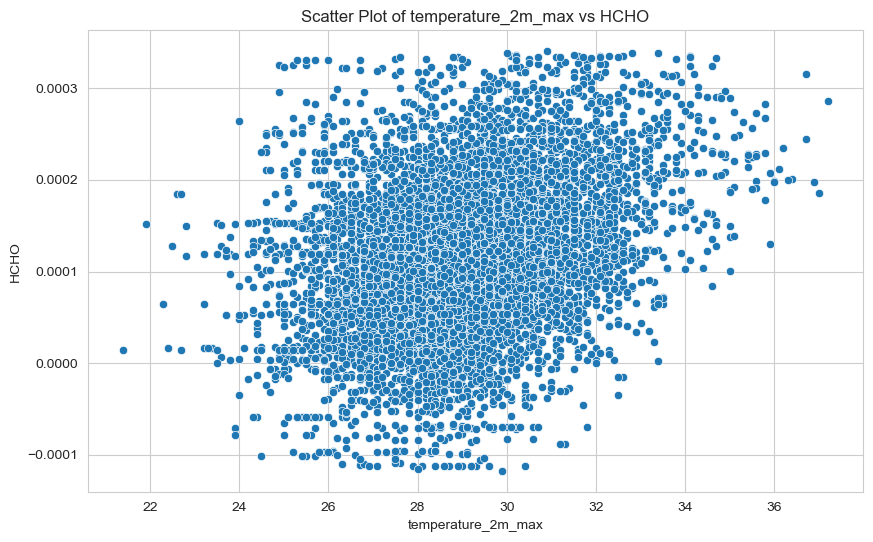

In [54]:
# Scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='temperature_2m_max', y='HCHO Reading', data=combined_weather_df)
plt.title('Scatter Plot of temperature_2m_max vs HCHO')
plt.xlabel('temperature_2m_max')
plt.ylabel('HCHO')
plt.grid(True)
plt.show()

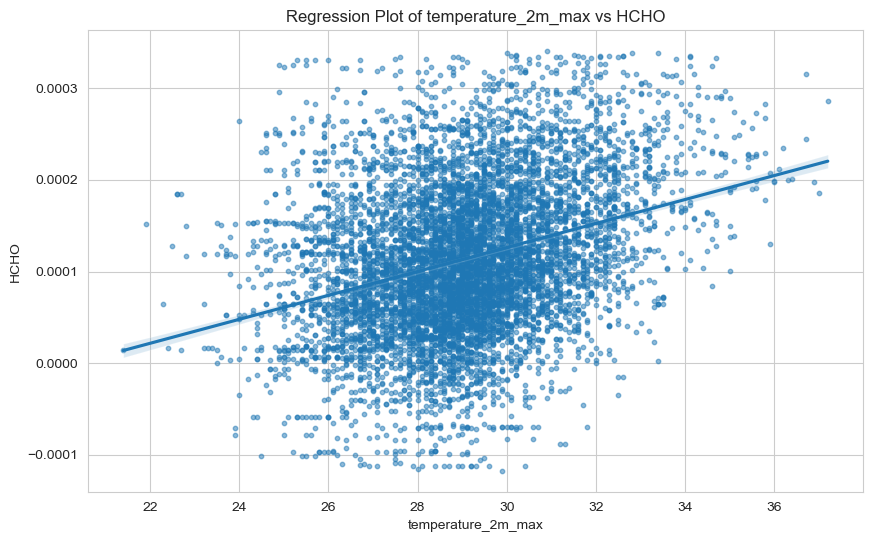

In [55]:
# Regression plot
plt.figure(figsize=(10, 6))
sns.regplot(x='temperature_2m_max', y='HCHO Reading', data=combined_weather_df, scatter_kws={'s': 10, 'alpha': 0.5})
plt.title('Regression Plot of temperature_2m_max vs HCHO')
plt.xlabel('temperature_2m_max')
plt.ylabel('HCHO')
plt.grid(True)
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

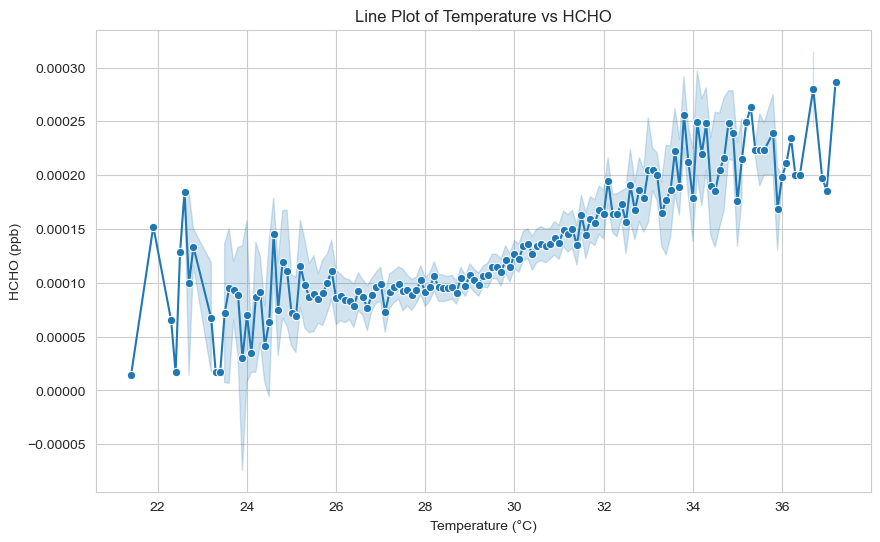

In [56]:
# Line plot
plt.figure(figsize=(10, 6))
sns.lineplot(x='temperature_2m_max', y='HCHO Reading', data=combined_weather_df, marker='o')
plt.title('Line Plot of Temperature vs HCHO')
plt.xlabel('Temperature (°C)')
plt.ylabel('HCHO (ppb)')
plt.grid(True)
plt.show()

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1410253569.py:2: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df.pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


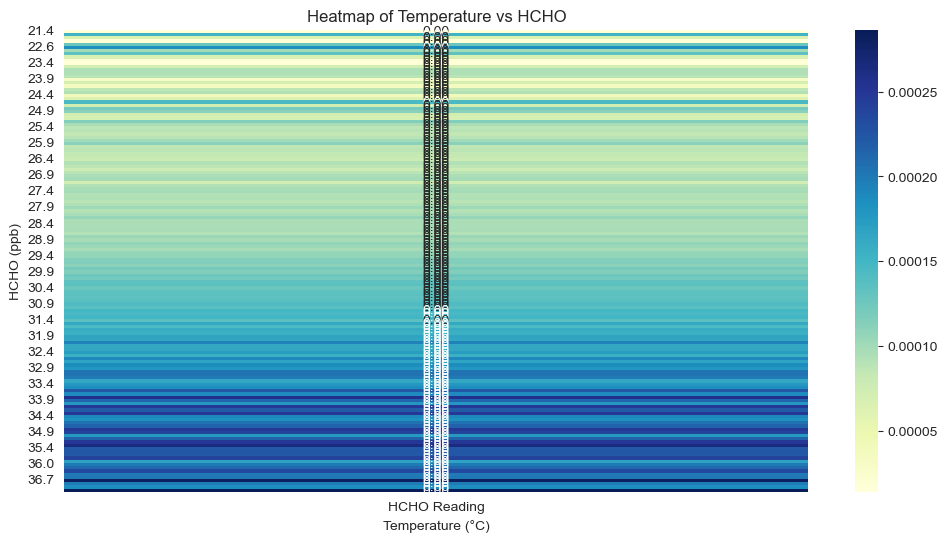

In [57]:
import numpy as np
pivot_table = combined_weather_df.pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt=".2f")
plt.title('Heatmap of Temperature vs HCHO')
plt.xlabel('Temperature (°C)')
plt.ylabel('HCHO (ppb)')
plt.show()

In [58]:
# Calculate the correlation coefficient
correlation = combined_weather_df['temperature_2m_max'].corr(combined_weather_df['HCHO Reading'])
print(f'Correlation between temperature and HCHO: {correlation:.2f}')


Correlation between temperature and HCHO: 0.31


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


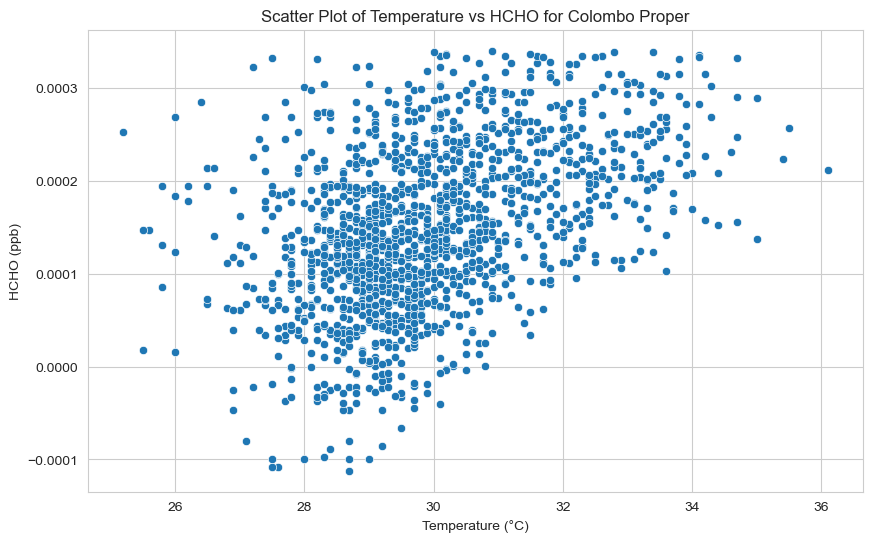

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


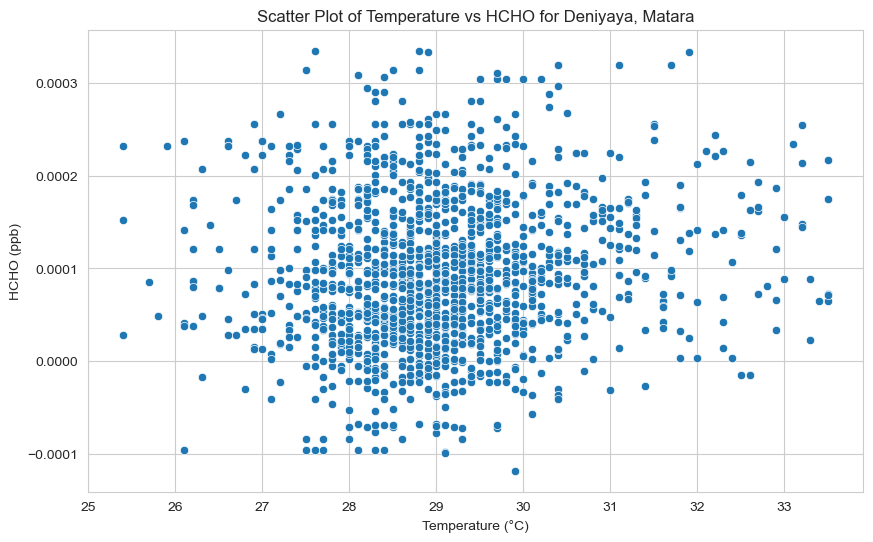

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


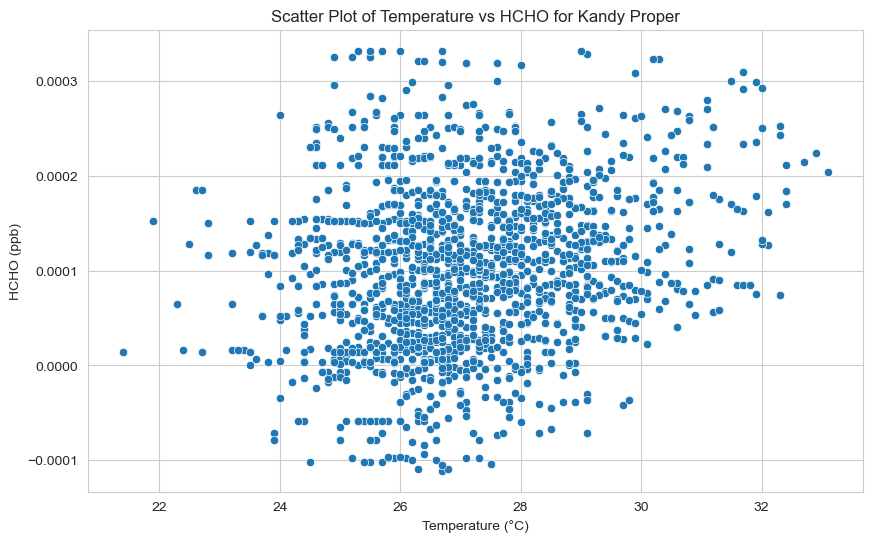

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


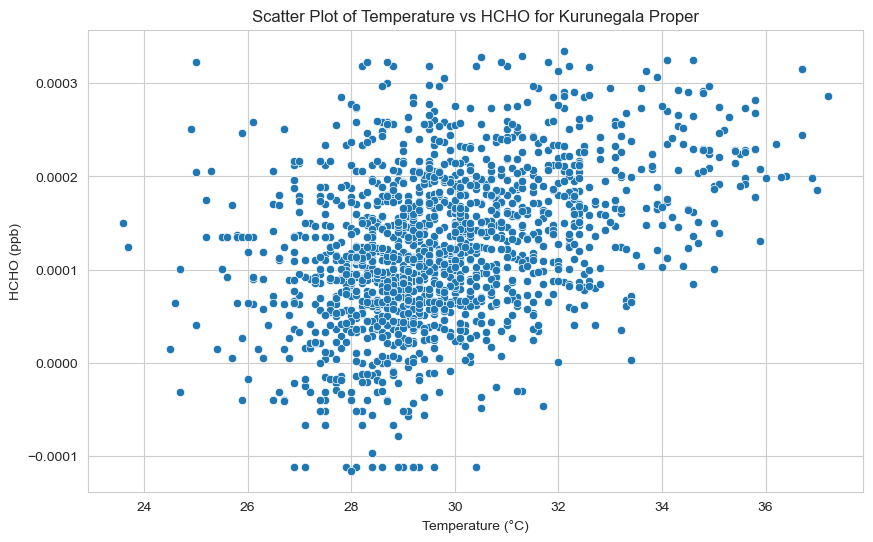

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


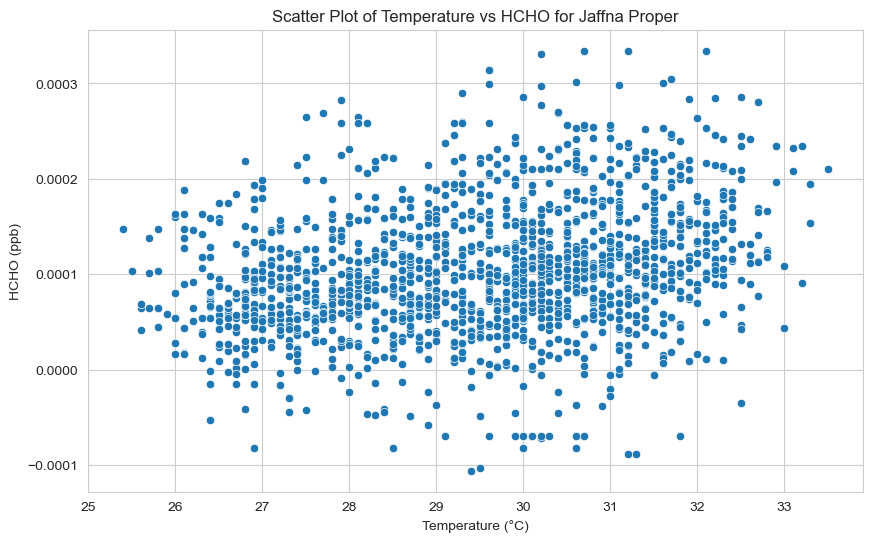

In [59]:
locations = combined_weather_df['Location'].unique()

# Scatter plot for each location
for location in locations:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='temperature_2m_max', y='HCHO Reading', data=combined_weather_df[combined_weather_df['Location'] == location])
    plt.title(f'Scatter Plot of Temperature vs HCHO for {location}')
    plt.xlabel('Temperature (°C)')
    plt.ylabel('HCHO (ppb)')
    plt.grid(True)
    plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

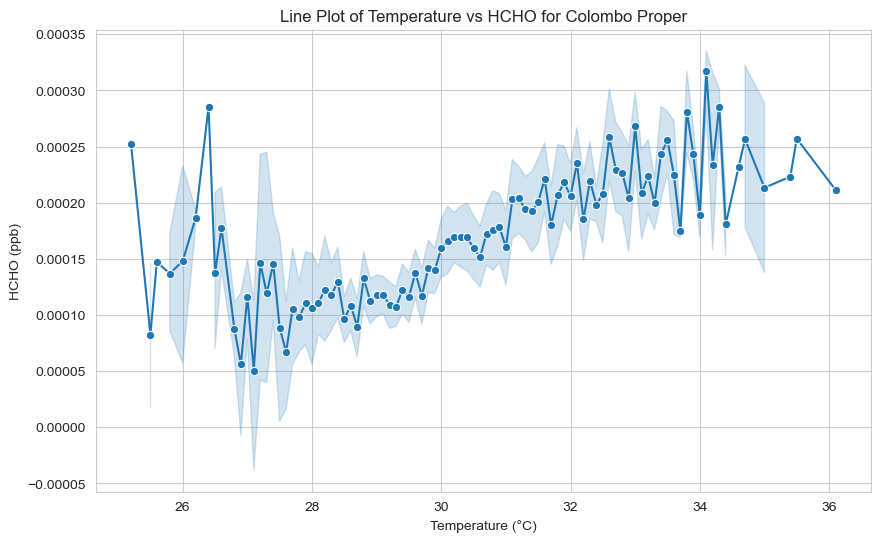

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

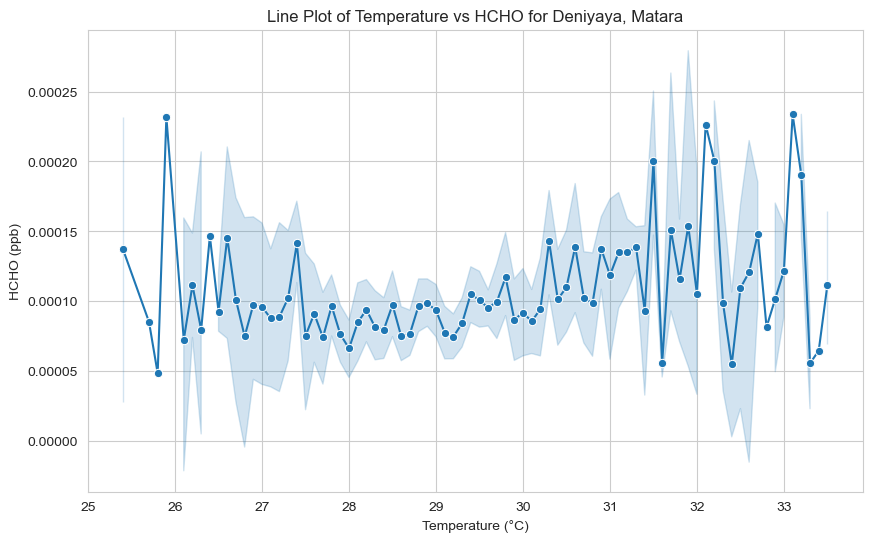

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

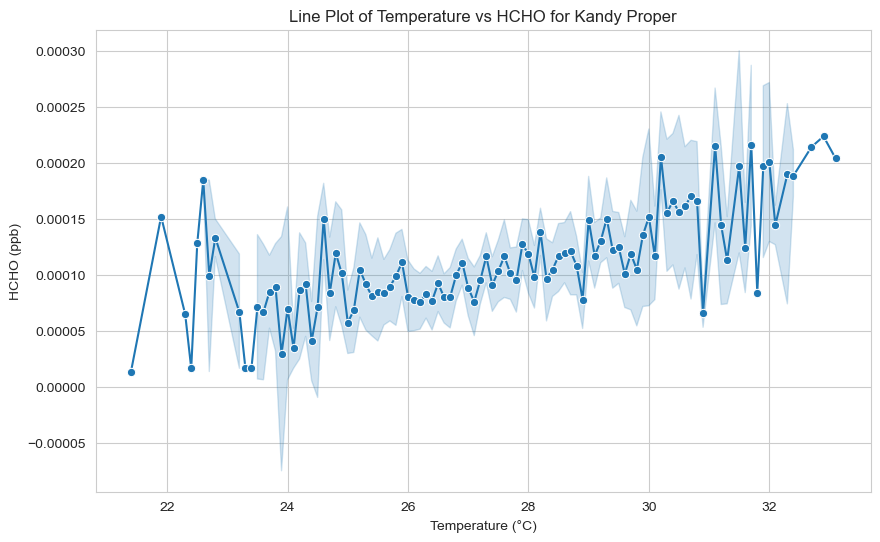

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

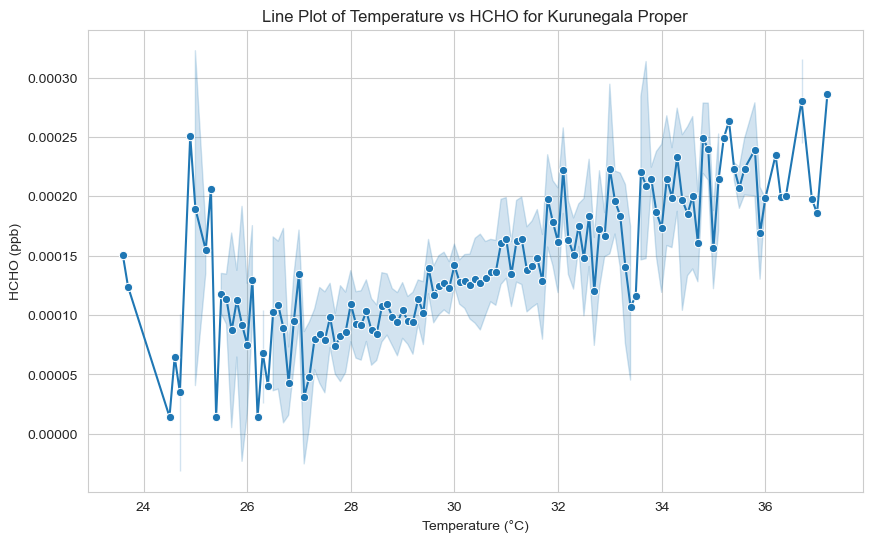

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

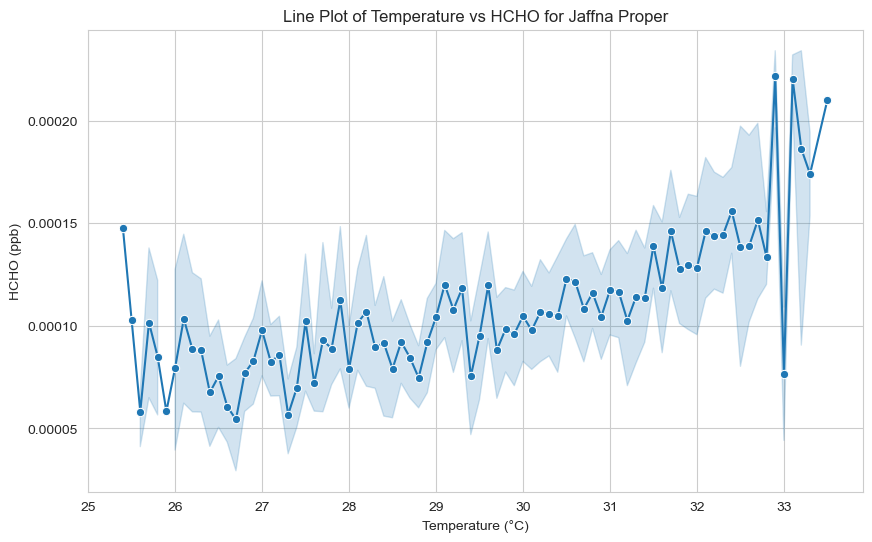

In [60]:
for location in locations:
    plt.figure(figsize=(10, 6))
    sns.lineplot(x='temperature_2m_max', y='HCHO Reading', data=combined_weather_df[combined_weather_df['Location'] == location], marker='o')
    plt.title(f'Line Plot of Temperature vs HCHO for {location}')
    plt.xlabel('Temperature (°C)')
    plt.ylabel('HCHO (ppb)')
    plt.grid(True)
    plt.show()

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3529623716.py:3: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


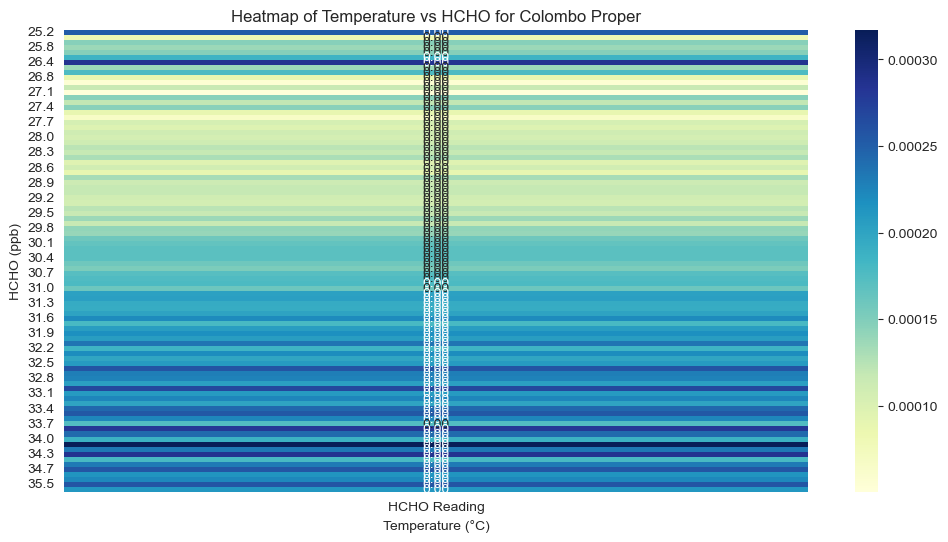

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3529623716.py:3: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


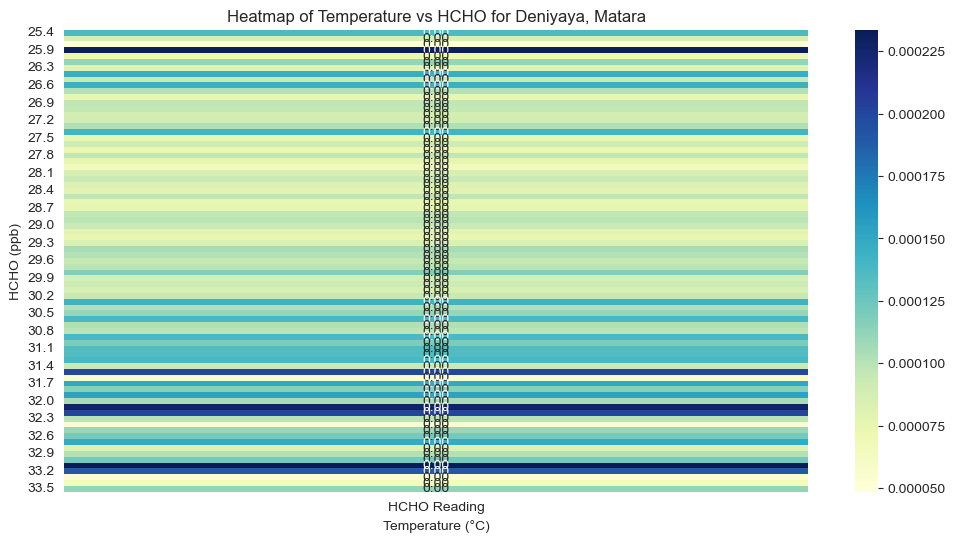

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3529623716.py:3: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


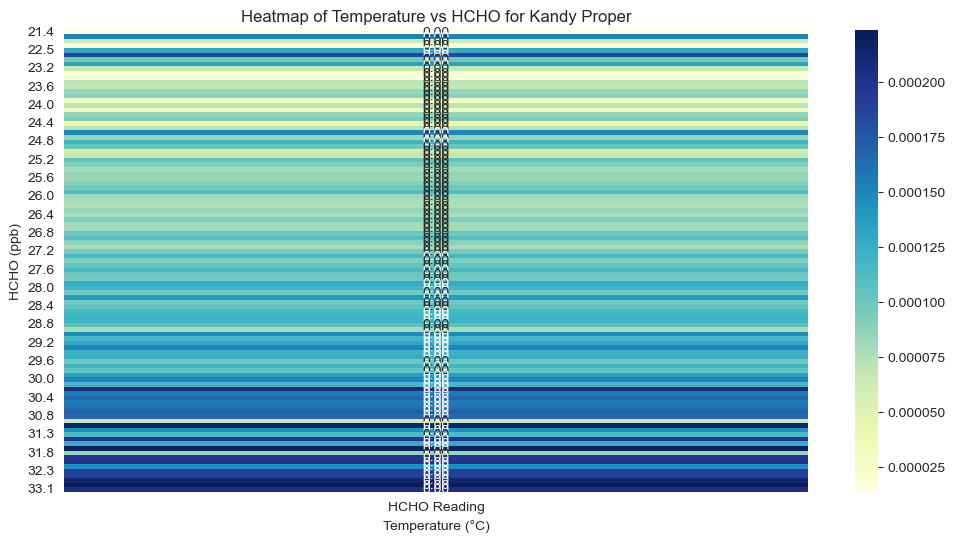

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3529623716.py:3: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


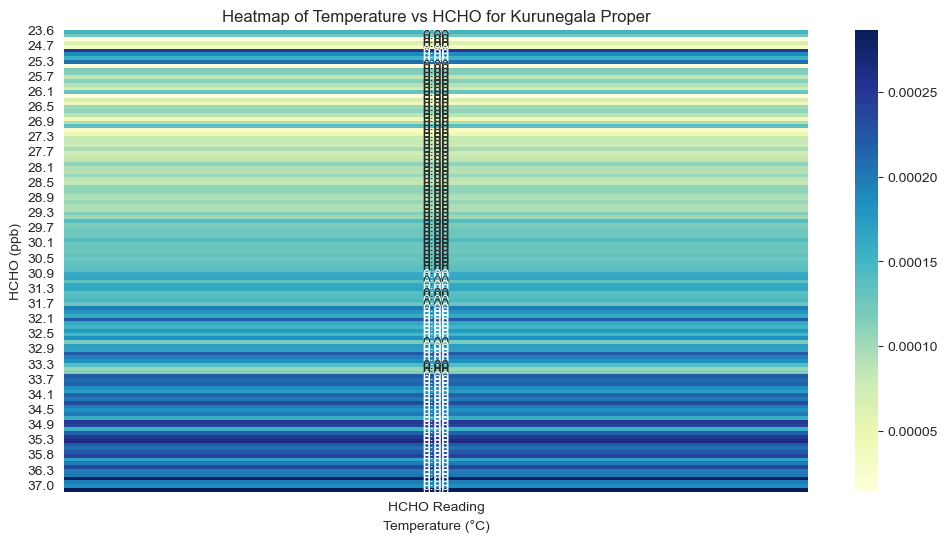

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3529623716.py:3: FutureWarning: The provided callable <function mean at 0x000001ECD6A58540> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)


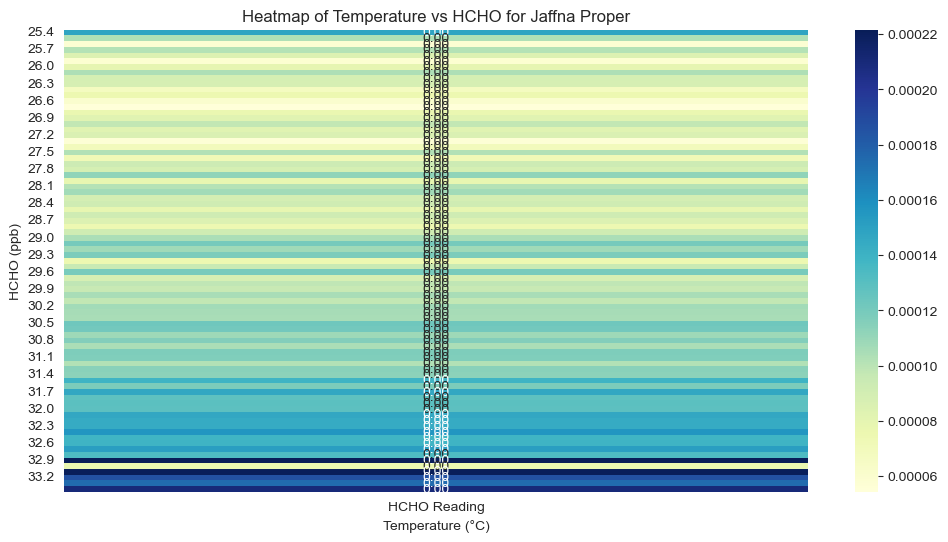

In [61]:
import numpy as np
for location in locations:
    pivot_table = combined_weather_df[combined_weather_df['Location'] == location].pivot_table(values='HCHO Reading', index='temperature_2m_max', aggfunc=np.mean)
    plt.figure(figsize=(12, 6))
    sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt=".2f")
    plt.title(f'Heatmap of Temperature vs HCHO for {location}')
    plt.xlabel('Temperature (°C)')
    plt.ylabel('HCHO (ppb)')
    plt.show()

In [62]:
for location in locations:
    subset = combined_weather_df[combined_weather_df['Location'] == location]
    correlation = subset['temperature_2m_max'].corr(subset['HCHO Reading'])
    print(f'Correlation between temperature and HCHO Reading for {location}: {correlation:.2f}')

Correlation between temperature and HCHO Reading for Colombo Proper: 0.44
Correlation between temperature and HCHO Reading for Deniyaya, Matara: 0.11
Correlation between temperature and HCHO Reading for Kandy Proper: 0.22
Correlation between temperature and HCHO Reading for Kurunegala Proper: 0.39
Correlation between temperature and HCHO Reading for Jaffna Proper: 0.26


# Wind Speed

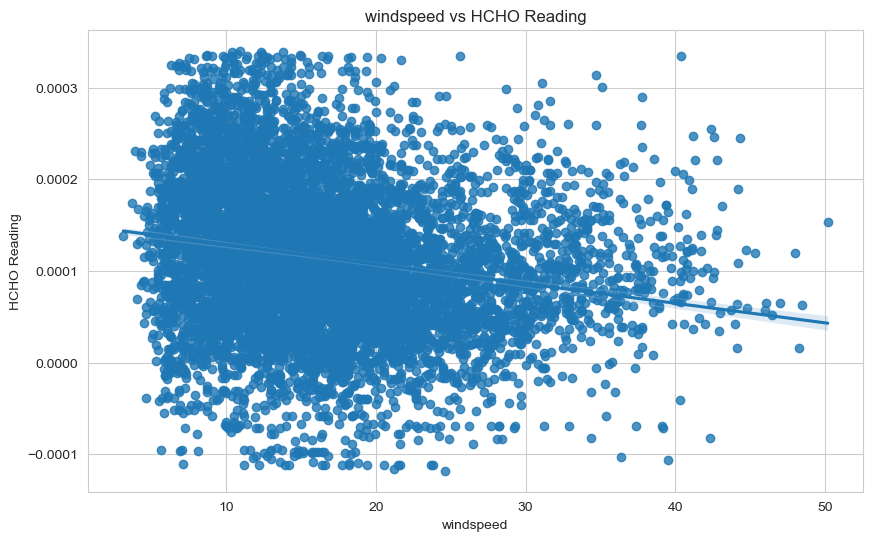

In [63]:
# Create scatter plot with regression line
plt.figure(figsize=(10, 6))
sns.regplot(x='windspeed_10m_max', y='HCHO Reading', data=combined_weather_df)
plt.title('windspeed vs HCHO Reading')
plt.xlabel('windspeed')
plt.ylabel('HCHO Reading')
plt.grid(True)
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

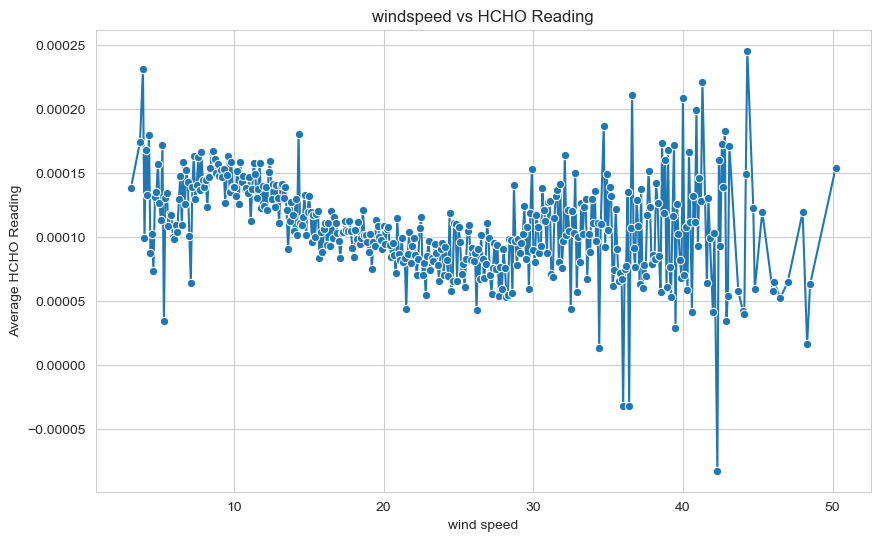

In [64]:
# Calculate average HCHO readings at different wind speed levels
avg_hcho = combined_weather_df.groupby('windspeed_10m_max')['HCHO Reading'].mean().reset_index()

# Create line plot
plt.figure(figsize=(10, 6))
sns.lineplot(x='windspeed_10m_max', y='HCHO Reading', data=avg_hcho, marker='o')
plt.title('windspeed vs HCHO Reading')
plt.xlabel('wind speed')
plt.ylabel('Average HCHO Reading')
plt.grid(True)
plt.show()


In [65]:
# Compute correlation for all locations combined
correlation_all = combined_weather_df['windspeed_10m_max'].corr(combined_weather_df['HCHO Reading'])
print(f'Correlation between windspeed and HCHO Reading for all locations: {correlation_all:.2f}')

Correlation between windspeed and HCHO Reading for all locations: -0.19


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4123368814.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location],


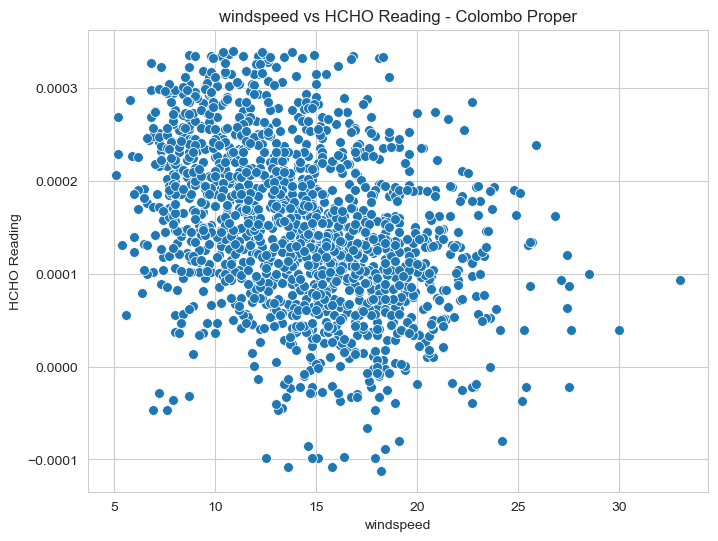

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4123368814.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location],


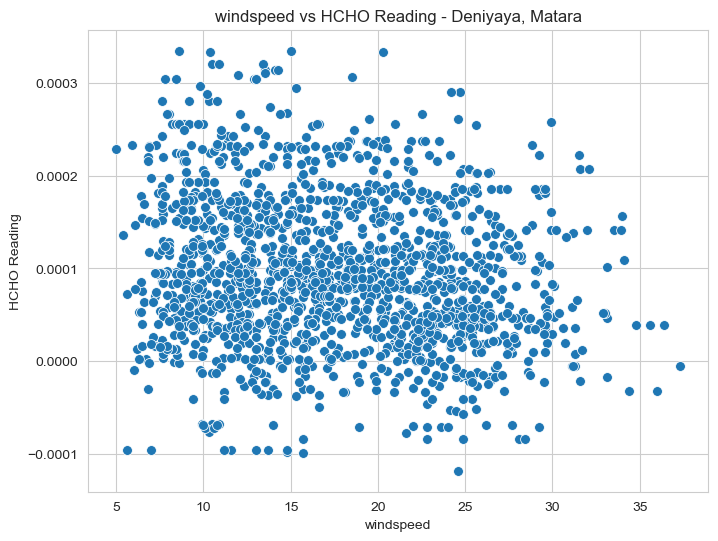

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4123368814.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location],


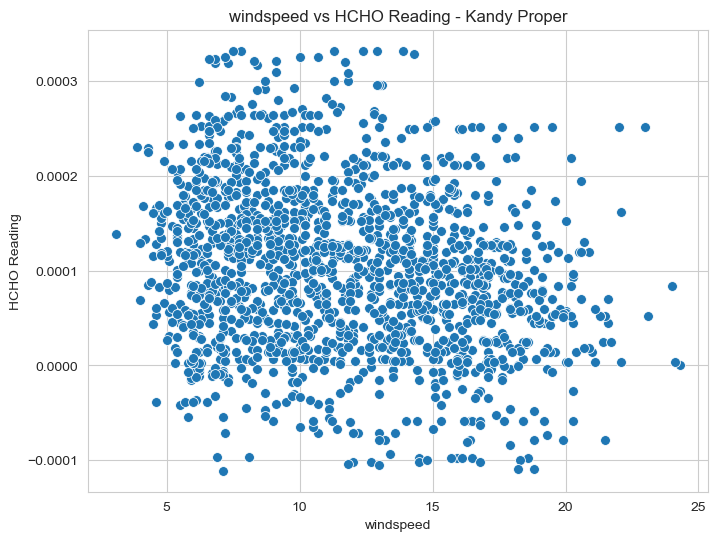

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4123368814.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location],


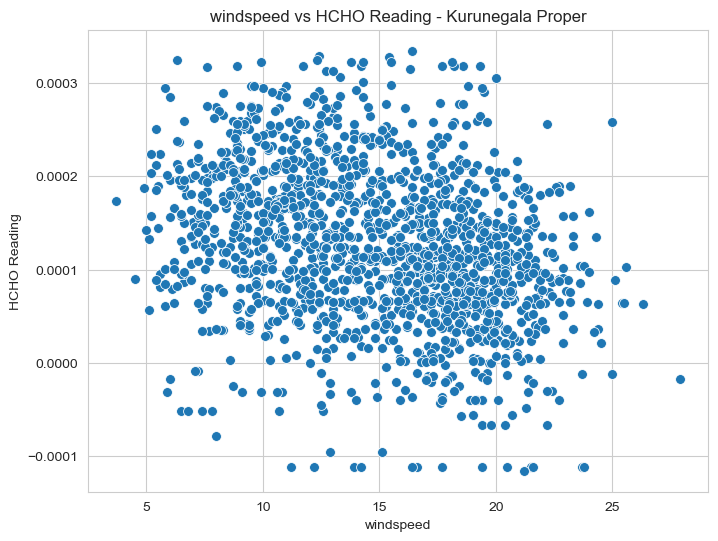

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\4123368814.py:5: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location],


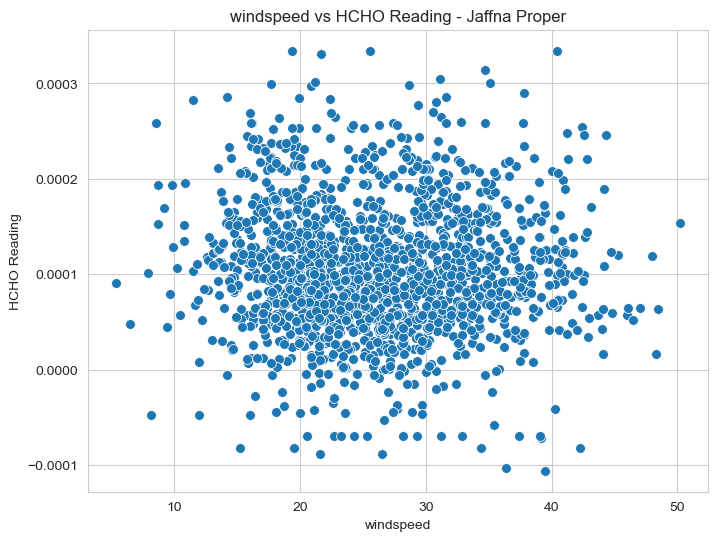

In [66]:
locations = combined_weather_df['Location'].unique()

for location in locations:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=combined_weather_df[combined_weather_df['Location'] == location], 
                    x='windspeed_10m_max', 
                    y='HCHO Reading', 
                    s=50, 
                    palette='coolwarm')
    plt.title(f'windspeed vs HCHO Reading - {location}')
    plt.xlabel('windspeed')
    plt.ylabel('HCHO Reading')
    plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1780922183.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location],
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', T

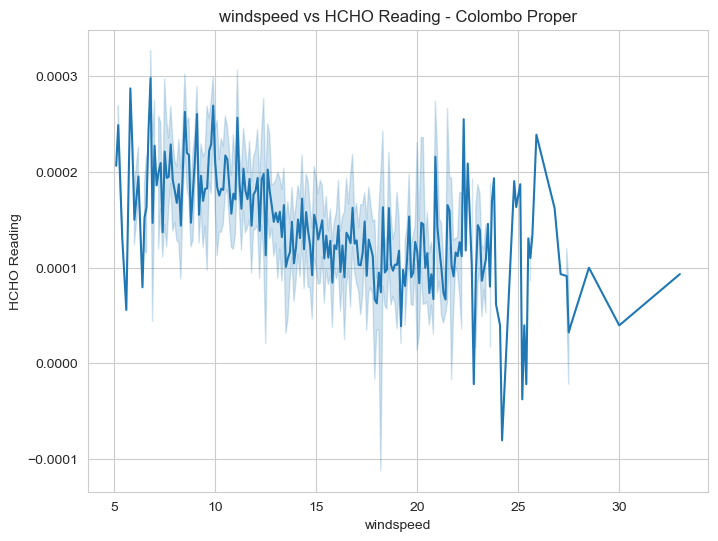

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1780922183.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location],
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', T

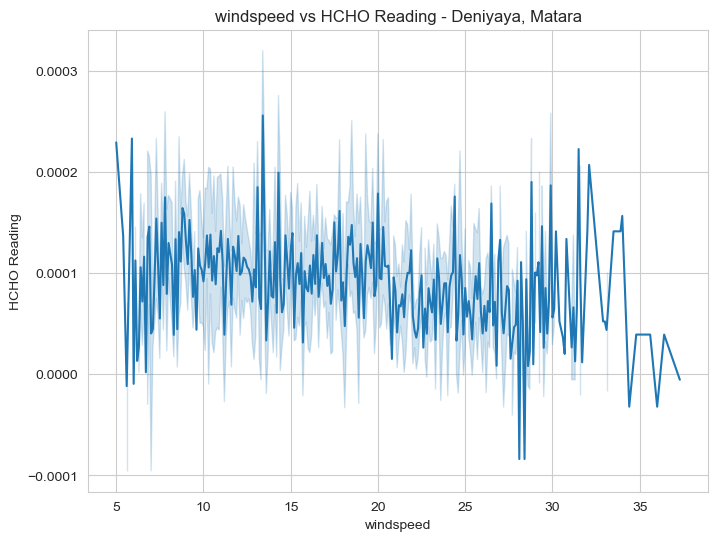

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1780922183.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location],
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', T

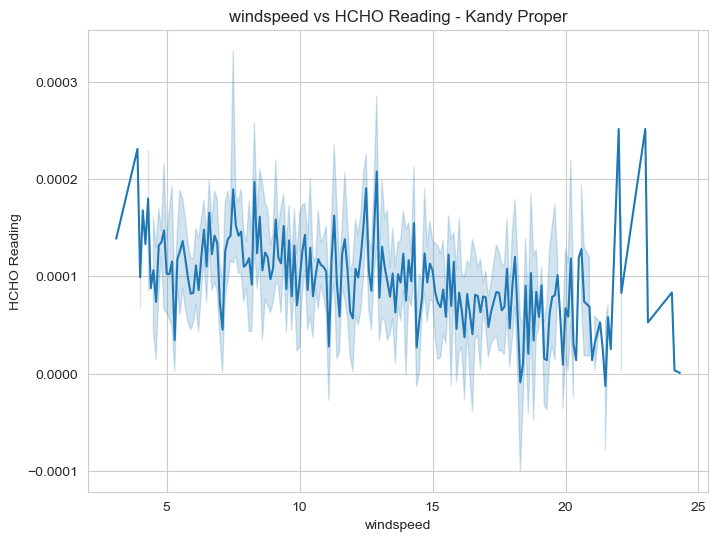

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1780922183.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location],
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', T

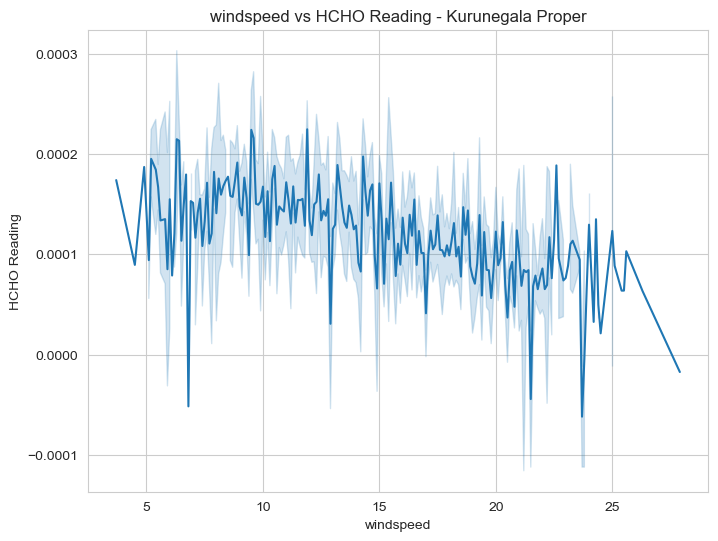

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1780922183.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location],
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', T

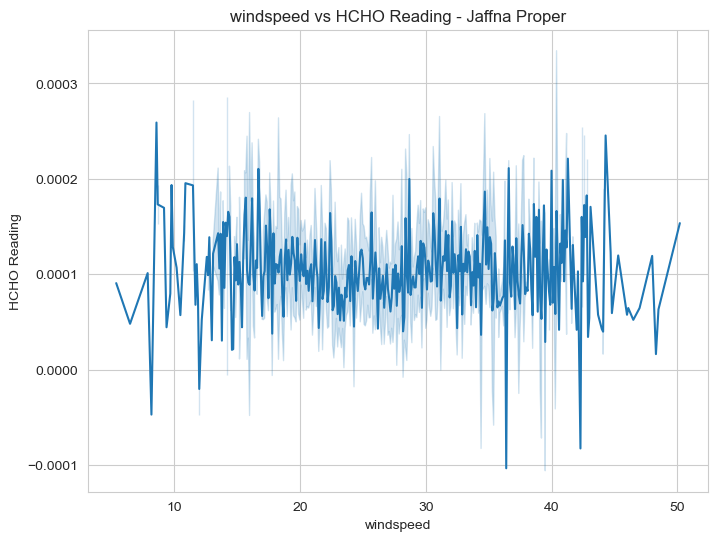

In [67]:
for location in locations:
    plt.figure(figsize=(8, 6))
    sns.lineplot(data=combined_weather_df[combined_weather_df['Location'] == location], 
                 x='windspeed_10m_max', 
                 y='HCHO Reading', 
                 palette='coolwarm')
    plt.title(f'windspeed vs HCHO Reading - {location}')
    plt.xlabel('windspeed')
    plt.ylabel('HCHO Reading')
    plt.show()

In [68]:
for location in locations:
    subset = combined_weather_df[combined_weather_df['Location'] == location]
    correlation = subset['windspeed_10m_max'].corr(subset['HCHO Reading'])
    print(f'Correlation between windspeed and HCHO Reading for {location}: {correlation:.2f}')


Correlation between windspeed and HCHO Reading for Colombo Proper: -0.38
Correlation between windspeed and HCHO Reading for Deniyaya, Matara: -0.18
Correlation between windspeed and HCHO Reading for Kandy Proper: -0.22
Correlation between windspeed and HCHO Reading for Kurunegala Proper: -0.31
Correlation between windspeed and HCHO Reading for Jaffna Proper: -0.02


# Rain Fall

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\652138818.py:2: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=combined_weather_df, x='rain_sum', y='HCHO Reading', palette='coolwarm', s=50)


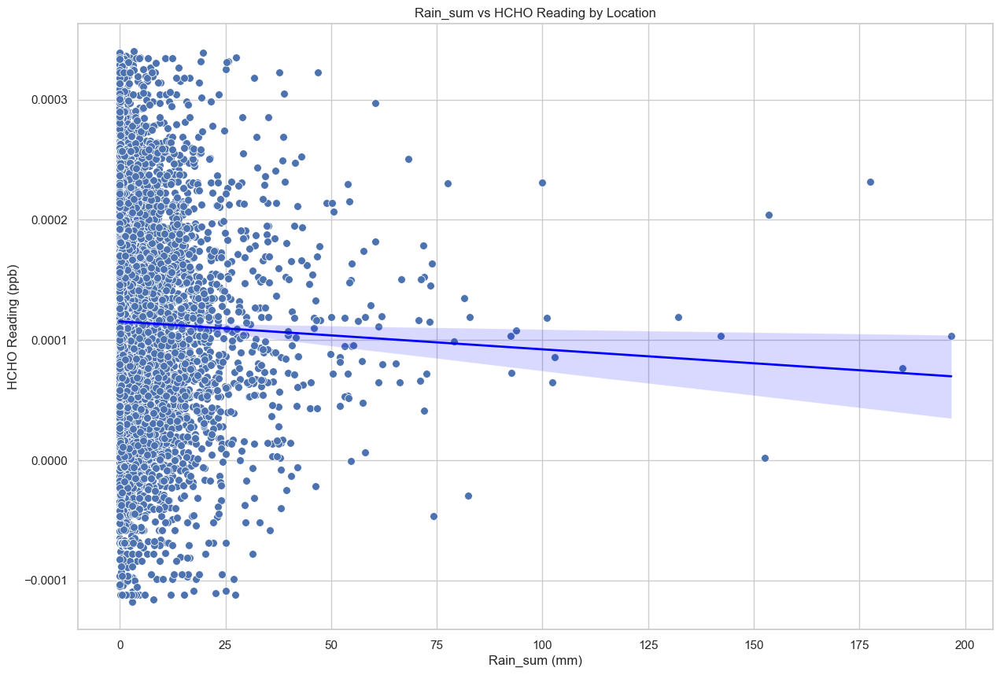

In [299]:
plt.figure(figsize=(15, 10))
sns.scatterplot(data=combined_weather_df, x='rain_sum', y='HCHO Reading', palette='coolwarm', s=50)
sns.regplot(data=combined_weather_df, x='rain_sum', y='HCHO Reading', scatter=False, color='blue', line_kws={'linewidth': 2})
plt.title('Rain_sum vs HCHO Reading by Location')
plt.xlabel('Rain_sum (mm)')
plt.ylabel('HCHO Reading (ppb)')
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\3925159973.py:3: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.lineplot(data=combined_weather_df, x='rain_sum', y='HCHO Reading', palette='coolwarm')
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as

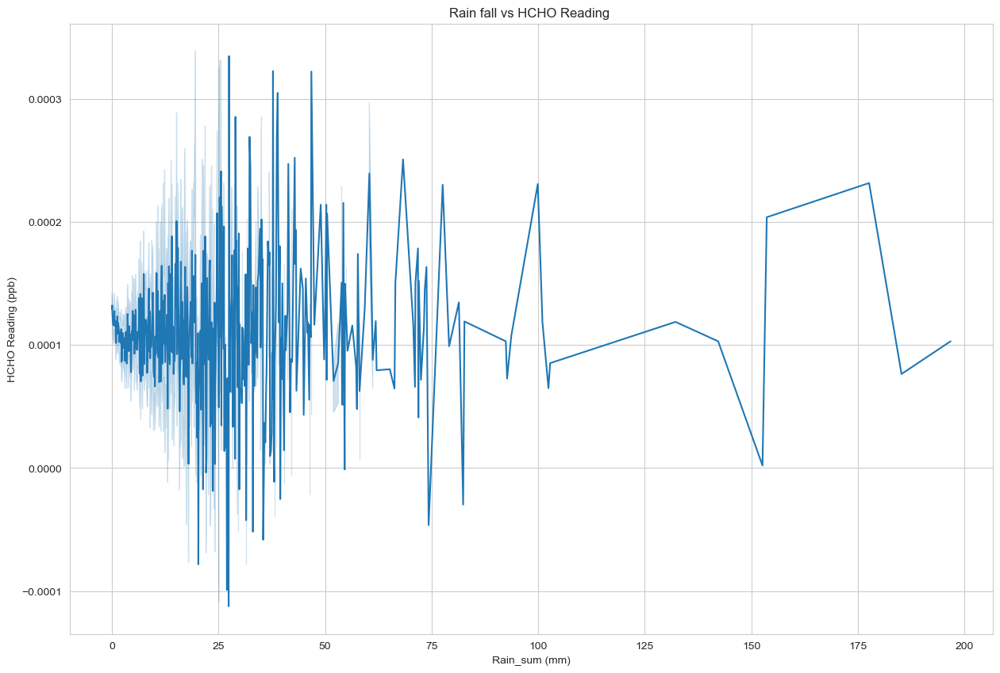

In [70]:
# Line plot
plt.figure(figsize=(15, 10))
sns.lineplot(data=combined_weather_df, x='rain_sum', y='HCHO Reading', palette='coolwarm')
plt.title('Rain fall vs HCHO Reading ')
plt.xlabel('Rain_sum (mm)')
plt.ylabel('HCHO Reading (ppb)')
plt.show()

In [71]:
# Calculate the correlation between Rain_sum and HCHO Reading for the entire dataset
corr_value = combined_weather_df['rain_sum'].corr(combined_weather_df['HCHO Reading'])

print(f"The correlation between Rain_sum and HCHO Reading is: {corr_value:.2f}")


The correlation between Rain_sum and HCHO Reading is: -0.03


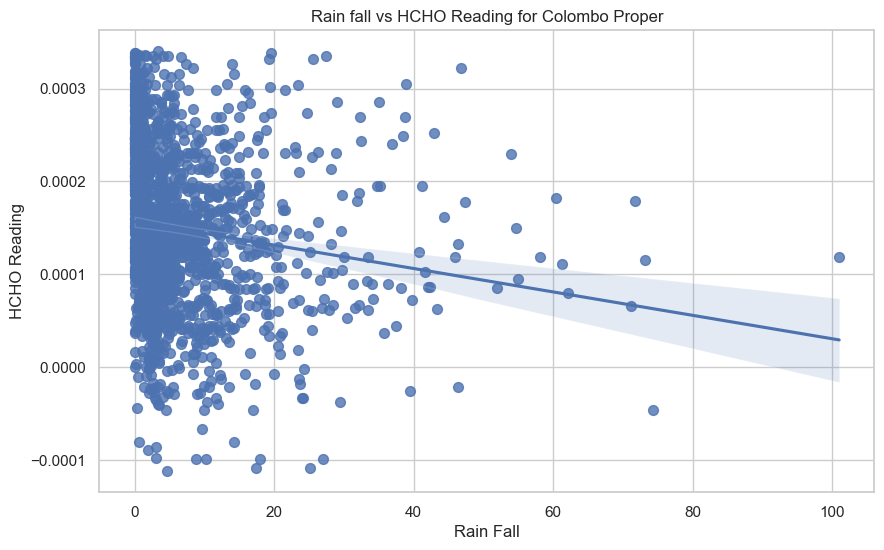

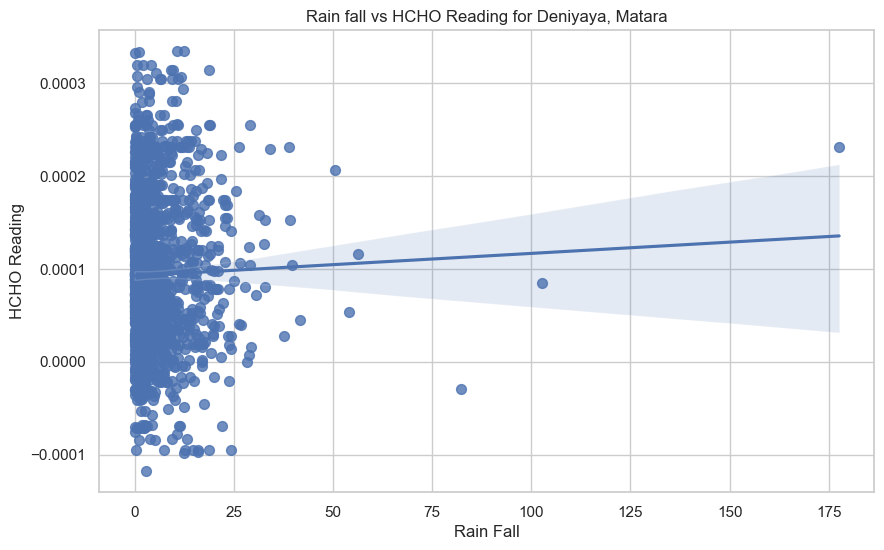

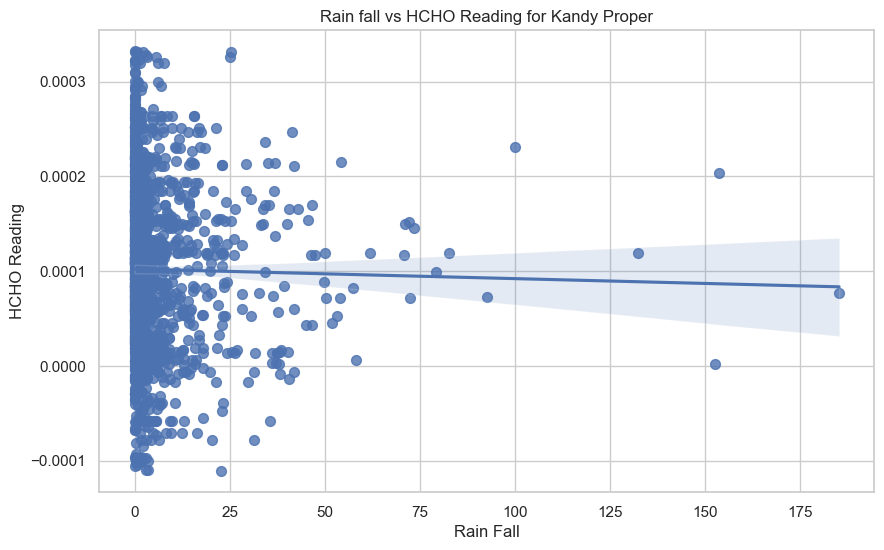

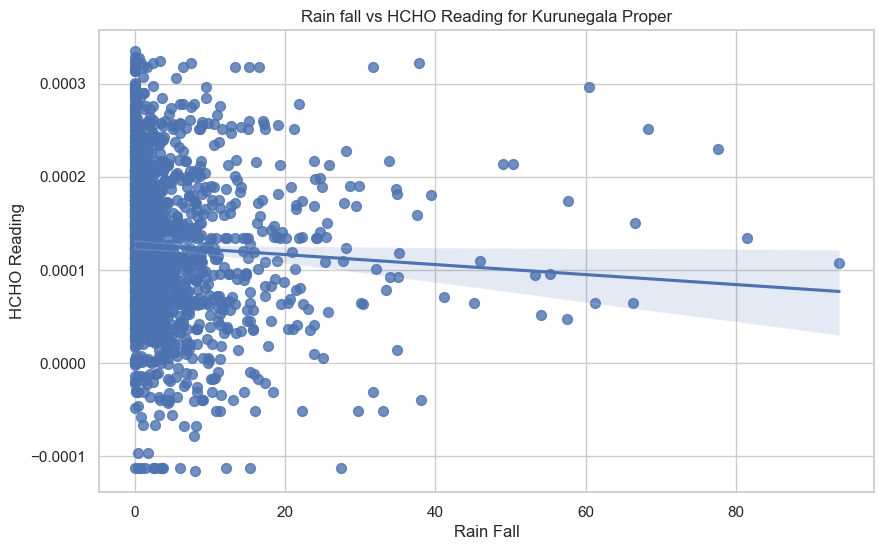

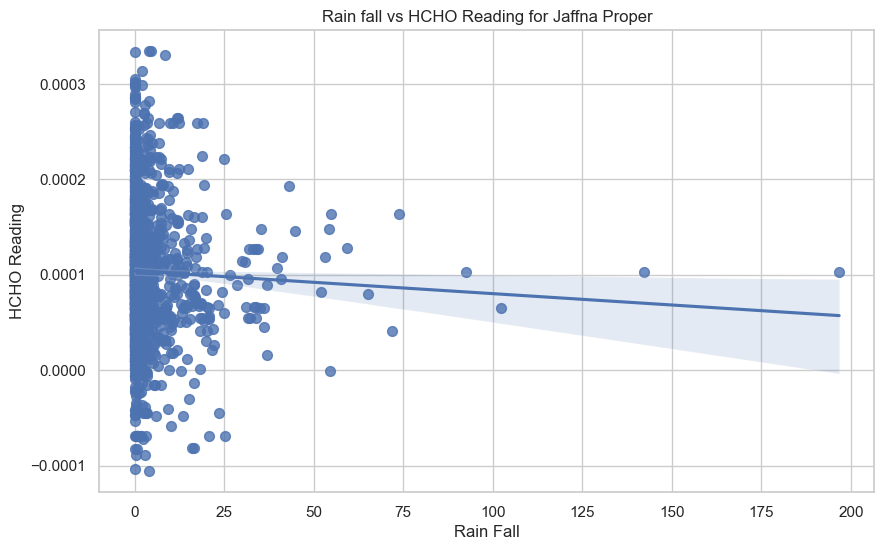

In [301]:
for location in combined_weather_df['Location'].unique():
    plt.figure(figsize=(10, 6))
    subset = combined_weather_df[combined_weather_df['Location'] == location]
    sns.regplot(data=subset, x='rain_sum', y='HCHO Reading', scatter=True, scatter_kws={'s': 50})
    plt.title(f'Rain fall vs HCHO Reading for {location}')
    plt.xlabel('Rain Fall')
    plt.ylabel('HCHO Reading')
    plt.show()


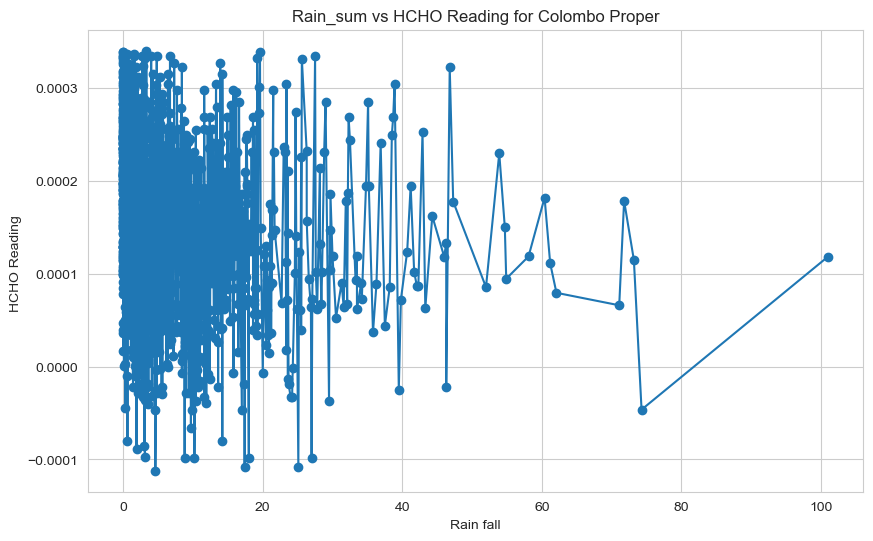

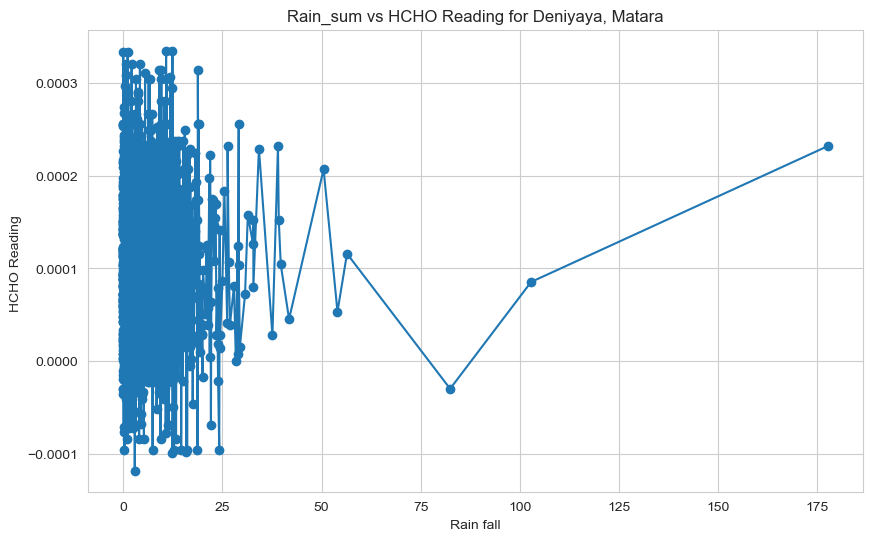

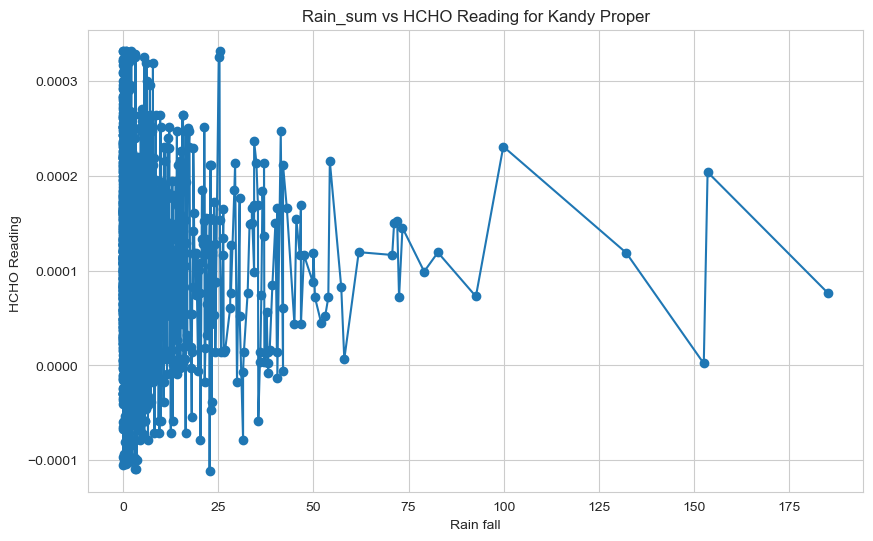

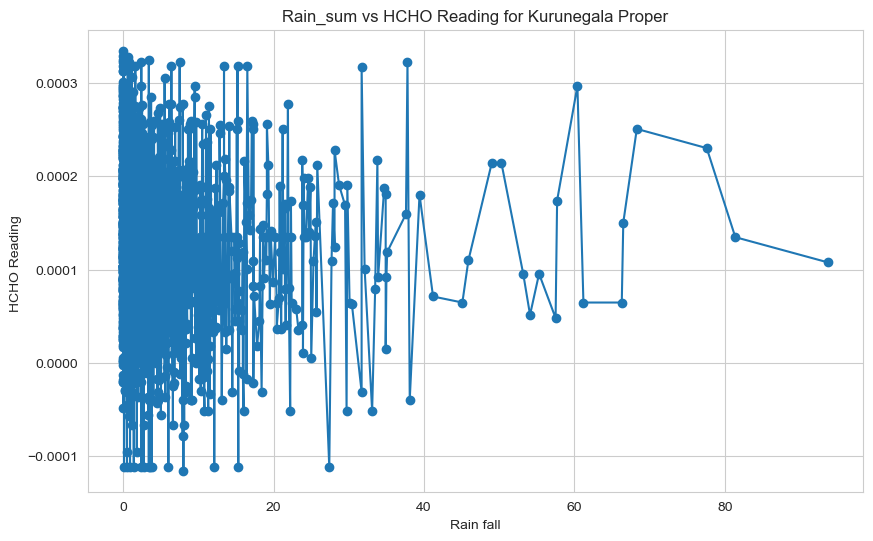

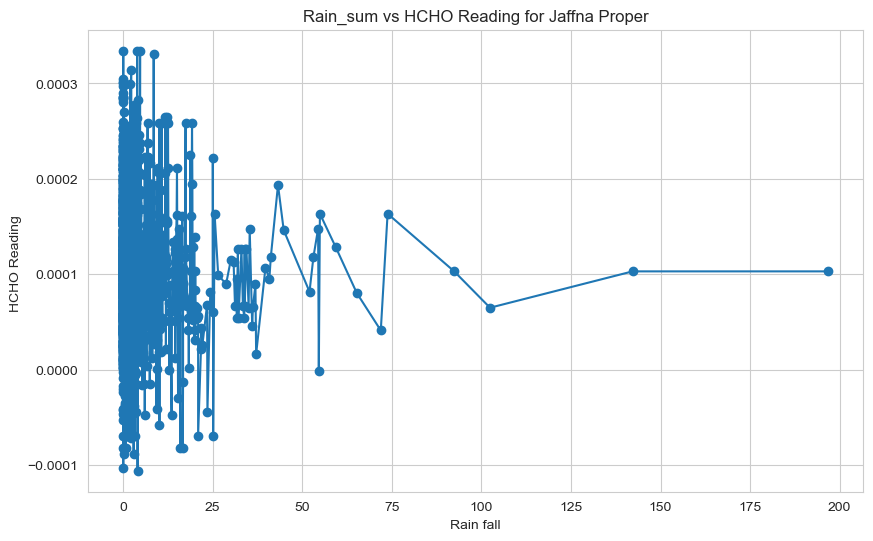

In [73]:
# Line plot
for location in combined_weather_df['Location'].unique():
    plt.figure(figsize=(10, 6))
    subset = combined_weather_df[combined_weather_df['Location'] == location].sort_values(by='rain_sum')
    plt.plot(subset['rain_sum'], subset['HCHO Reading'], marker='o')
    plt.title(f'Rain_sum vs HCHO Reading for {location}')
    plt.xlabel('Rain fall')
    plt.ylabel('HCHO Reading ')
    plt.grid(True)
    plt.show()

In [74]:
grouped_by_location = combined_weather_df.groupby('Location')

correlation_by_location_rain = {}
for location, data in grouped_by_location:
    correlation = data['rain_sum'].corr(data['HCHO Reading'])
    correlation_by_location_rain[location] = correlation
    
for location, correlation in correlation_by_location_rain.items():
    print(f'Correlation between Rain Fall and HCHO Reading for {location}: {correlation:.2f}')


Correlation between Rain Fall and HCHO Reading for Colombo Proper: -0.14
Correlation between Rain Fall and HCHO Reading for Deniyaya, Matara: 0.03
Correlation between Rain Fall and HCHO Reading for Jaffna Proper: -0.04
Correlation between Rain Fall and HCHO Reading for Kandy Proper: -0.02
Correlation between Rain Fall and HCHO Reading for Kurunegala Proper: -0.06


# Compare spatial patterns

# differences in HCHO distribution between cities

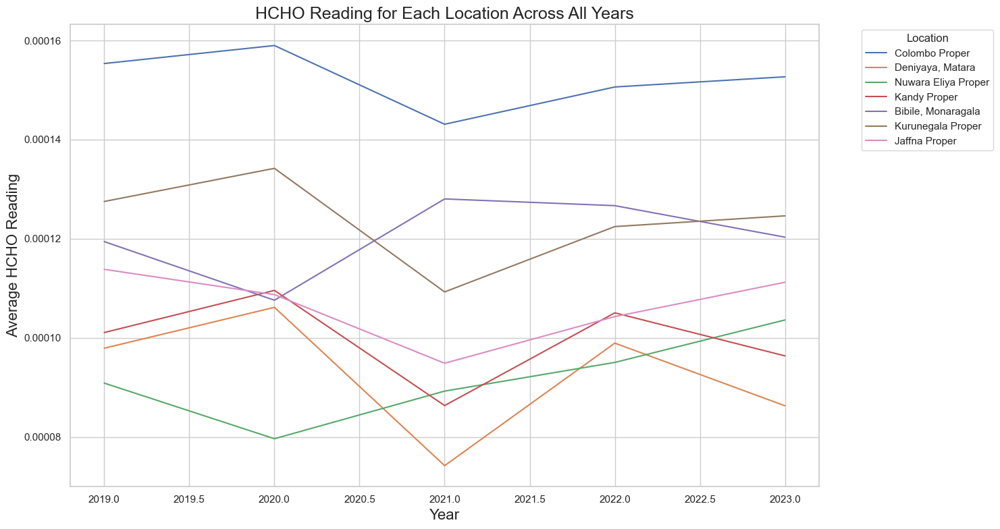

In [302]:
combined_df2['Current Date'] = pd.to_datetime(combined_df2['Current Date'])

plt.figure(figsize=(15, 8))

for location in combined_df2['Location'].unique():
    location_data = combined_df2[combined_df2['Location'] == location]
    plt.plot(location_data['Current Date'].dt.year.unique(), 
             location_data.groupby(location_data['Current Date'].dt.year)['HCHO Reading'].mean(), 
             label=location)

# Customizing the plot
plt.xlabel('Year', fontsize=16)
plt.ylabel('Average HCHO Reading', fontsize=16)
plt.title('HCHO Reading for Each Location Across All Years', fontsize=18)
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


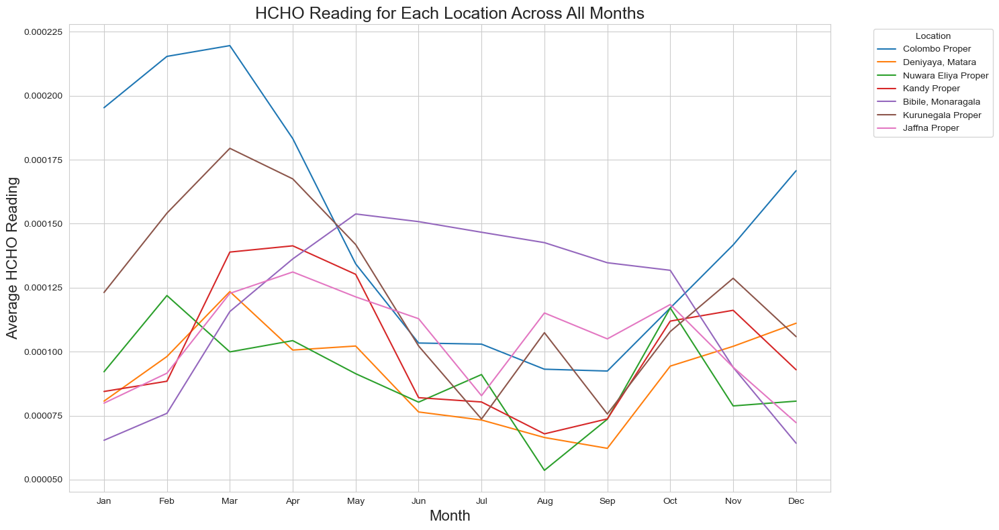

In [75]:
combined_df2['Current Date'] = pd.to_datetime(combined_df2['Current Date'])

plt.figure(figsize=(15, 8))

for location in combined_df2['Location'].unique():
    location_data = combined_df2[combined_df2['Location'] == location]
    plt.plot(location_data['Current Date'].dt.month.unique(), 
             location_data.groupby(location_data['Current Date'].dt.month)['HCHO Reading'].mean(), 
             label=location)

plt.xlabel('Month', fontsize=16)
plt.ylabel('Average HCHO Reading', fontsize=16)
plt.title('HCHO Reading for Each Location Across All Months', fontsize=18)
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


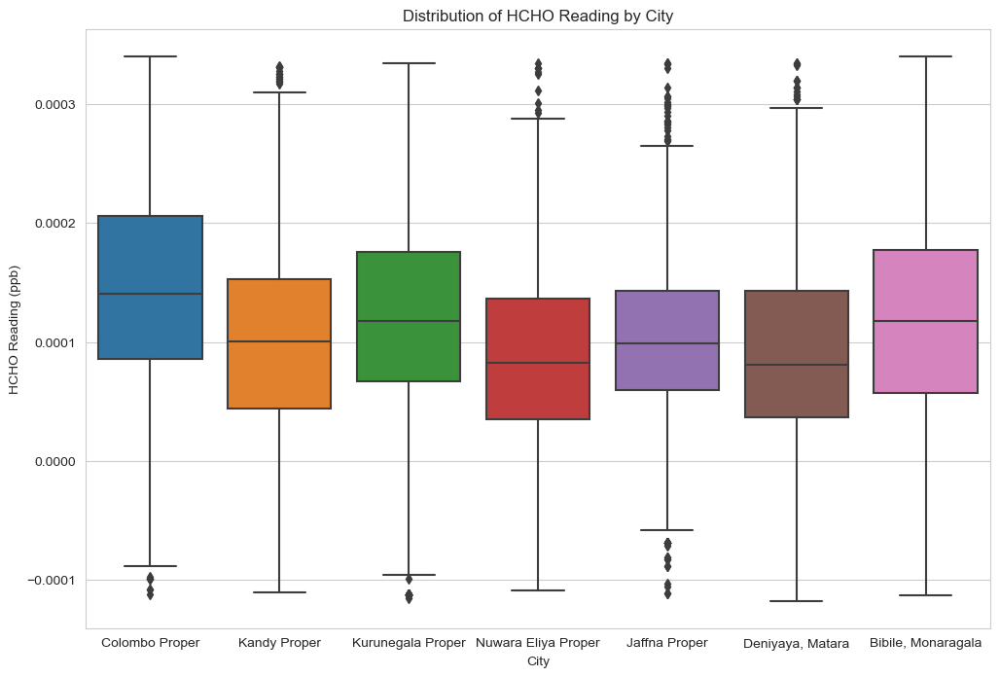

In [76]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
sns.boxplot(x='Location', y='HCHO Reading', data=combined_df)
plt.title('Distribution of HCHO Reading by City')
plt.xlabel('City')
plt.ylabel('HCHO Reading (ppb)')
plt.show()

C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1977460522.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data['HCHO Reading'], label=location, shade=True)
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\asus\AppData\Local\Temp\ipykernel_8036\1977460522.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0

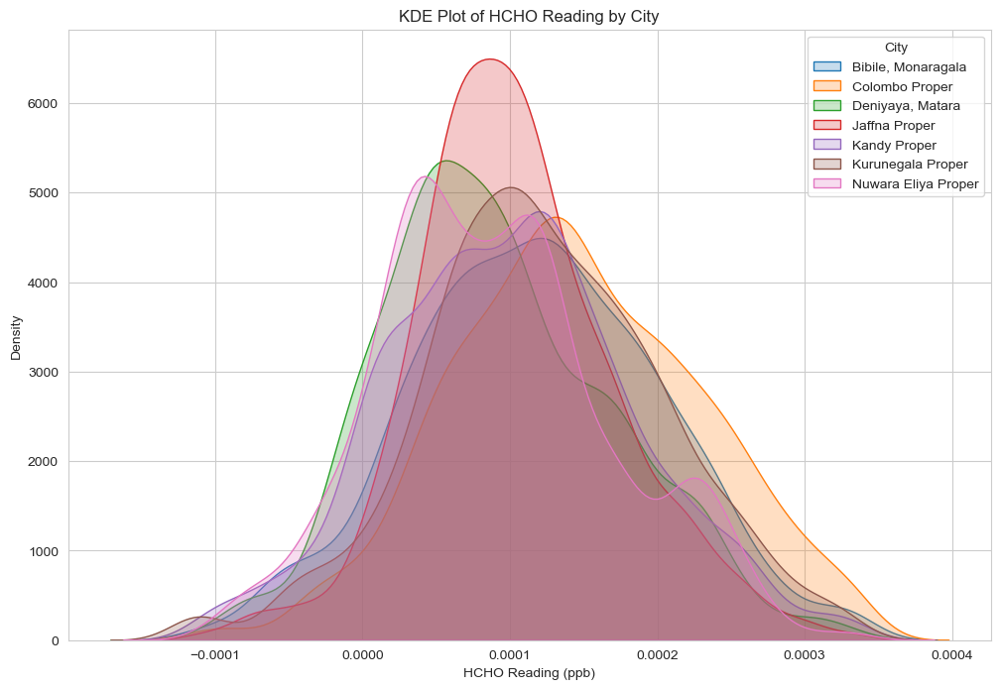

In [77]:
grouped_by_location = combined_df2.groupby('Location')

plt.figure(figsize=(12, 8))
for location, data in grouped_by_location:
    sns.kdeplot(data['HCHO Reading'], label=location, shade=True)
plt.title('KDE Plot of HCHO Reading by City')
plt.xlabel('HCHO Reading (ppb)')
plt.ylabel('Density')
plt.legend(title='City')
plt.show()


In [78]:
for location, data in grouped_by_location:
    print(f"Statistics for {location}:")
    print(data['HCHO Reading'].describe())
    print('-' * 40)


Statistics for Bibile, Monaragala:
count    1767.000000
mean        0.000117
std         0.000085
min        -0.000113
25%         0.000057
50%         0.000117
75%         0.000177
max         0.000340
Name: HCHO Reading, dtype: float64
----------------------------------------
Statistics for Colombo Proper:
count    1746.000000
mean        0.000145
std         0.000085
min        -0.000112
25%         0.000086
50%         0.000141
75%         0.000206
max         0.000340
Name: HCHO Reading, dtype: float64
----------------------------------------
Statistics for Deniyaya, Matara:
count    1771.000000
mean        0.000091
std         0.000079
min        -0.000118
25%         0.000037
50%         0.000081
75%         0.000143
max         0.000334
Name: HCHO Reading, dtype: float64
----------------------------------------
Statistics for Jaffna Proper:
count    1789.000000
mean        0.000104
std         0.000068
min        -0.000111
25%         0.000060
50%         0.000098
75%         0

# potential contributing factors

In [79]:
# Population density dictionary
population_density_dict = {
    'Colombo Proper': 13364,
    'Kandy Proper': 773,
    'Nuwara Eliya Proper': 448,
    'Bibile, Monaragala': 80,
    'Deniyaya, Matara': 366,
    'Kurunegala Proper': 361,
    'Jaffna Proper': 610.7
}

combined_df2['Population Density'] = combined_df2['Location'].map(population_density_dict)
combined_df2

,HCHO Reading,Location,Current Date,Next Date,Population Density
0,1.969834e-04,Colombo Proper,2019-01-01,2019-01-02,13364.0
1,2.625522e-04,Colombo Proper,2019-01-02,2019-01-03,13364.0
2,9.852119e-05,Colombo Proper,2019-01-03,2019-01-04,13364.0
3,2.099321e-04,Colombo Proper,2019-01-04,2019-01-05,13364.0
4,1.785337e-04,Colombo Proper,2019-01-05,2019-01-06,13364.0
...,...,...,...,...,...
5473,-7.696313e-08,Jaffna Proper,2023-12-27,2023-12-28,610.7
5474,5.139770e-05,Jaffna Proper,2023-12-28,2023-12-29,610.7
5475,1.267235e-04,Jaffna Proper,2023-12-29,2023-12-30,610.7
5476,1.166590e-04,Jaffna Proper,2023-12-30,2023-12-31,610.7


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

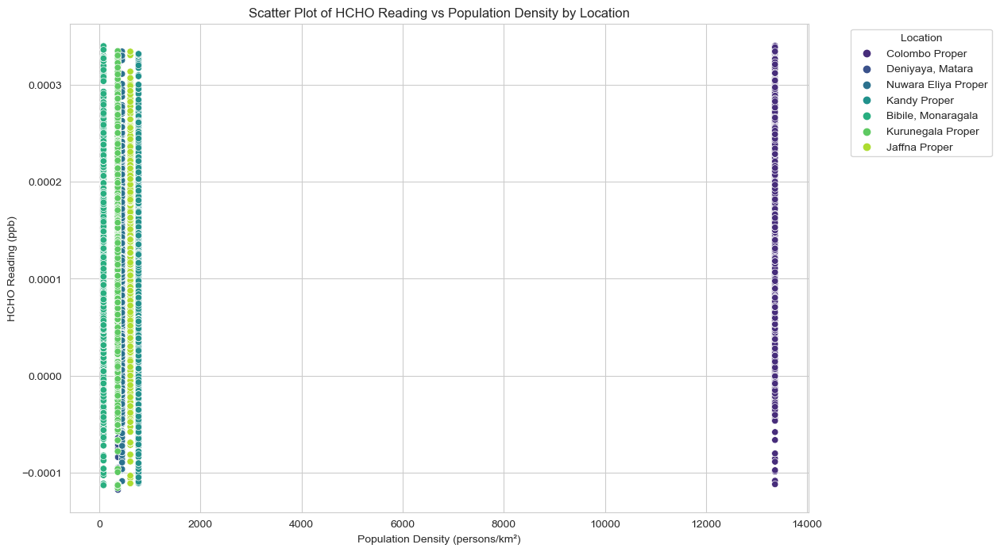

In [80]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Population Density', y='HCHO Reading', data=combined_df2, hue='Location', palette='viridis')
plt.title('Scatter Plot of HCHO Reading vs Population Density by Location')
plt.xlabel('Population Density (persons/km²)')
plt.ylabel('HCHO Reading (ppb)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

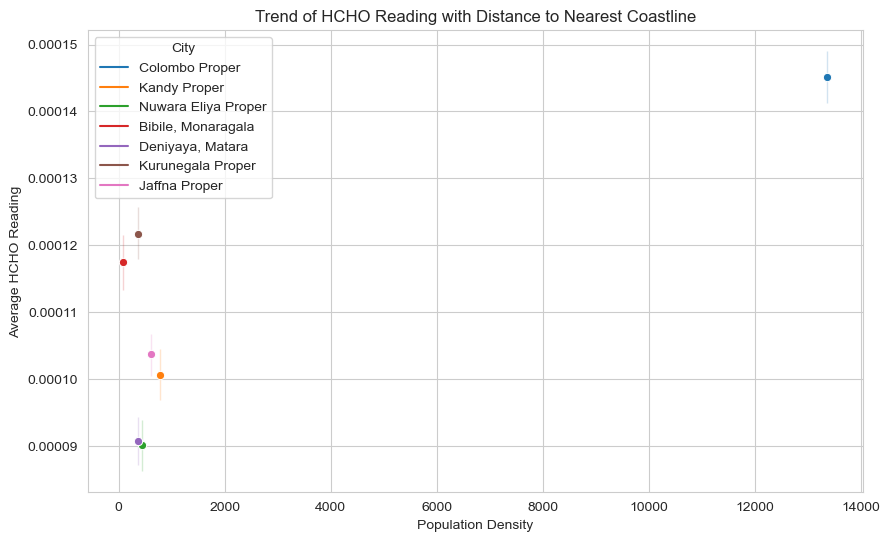

In [98]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=combined_distance_data, x='Population Density', y='HCHO Reading', hue='City', marker='o')
plt.title('Trend of HCHO Reading with Distance to Nearest Coastline')
plt.xlabel('Population Density')
plt.ylabel('Average HCHO Reading')
plt.show()

In [81]:
correlation = combined_df2['HCHO Reading'].corr(combined_df2['Population Density'])
print(f"Correlation between HCHO Reading and Population Density: {correlation:.2f}")

Correlation between HCHO Reading and Population Density: 0.17


# HCHO emissions due to proximity to the sea

In [82]:
!pip install geopy

Defaulting to user installation because normal site-packages is not writeable


DEPRECATION: Loading egg at c:\programdata\anaconda3\lib\site-packages\vboxapi-1.0-py3.11.egg is deprecated. pip 24.3 will enforce this behaviour change. A possible replacement is to use pip for package installation.. Discussion can be found at https://github.com/pypa/pip/issues/12330


In [83]:
from geopy.geocoders import Nominatim
import pandas as pd

# Initialize Nominatim API
geolocator = Nominatim(user_agent="geoapiExercises")

# List of coastal cities in Sri Lanka
coastal_cities = ['Colombo', 'Galle', 'Trincomalee', 'Batticaloa', 'Jaffna']

# Fetching the coordinates
coastal_coordinates = {}
for city in coastal_cities:
    location = geolocator.geocode(city + ', Sri Lanka')
    coastal_coordinates[city] = (location.latitude, location.longitude)

print(coastal_coordinates)


{'Colombo': (6.9388614, 79.8542005), 'Galle': (6.0328139, 80.214955), 'Trincomalee': (8.576425, 81.2344952), 'Batticaloa': (7.7356027, 81.6941956), 'Jaffna': (9.665093, 80.0093029)}


In [84]:
from geopy.distance import geodesic

cities_coordinates = {
    'Colombo Proper': (6.9271, 79.8612),
    'Kandy Proper': (7.2906, 80.6337),
    'Nuwara Eliya Proper': (6.9497, 80.7891),
    'Bibile, Monaragala': (6.4851, 81.0409),
    'Deniyaya, Matara': (6.3567, 80.5928),
    'Kurunegala Proper': (7.4842, 80.3592),
    'Jaffna Proper': (9.6615, 80.0255)
}

nearest_coastline = {}
for city, coord in cities_coordinates.items():
    distances = [geodesic(coord, coast).kilometers for coast in coastal_coordinates.values()]
    nearest_coastline[city] = min(distances)

# Create a DataFrame to display nearest coastline for each city
df_nearest_coastline = pd.DataFrame(list(nearest_coastline.items()), columns=['City', 'Distance_to_Nearest_Coastline (km)'])
print(df_nearest_coastline)


                  City  Distance_to_Nearest_Coastline (km)
0       Colombo Proper                            1.513325
1         Kandy Proper                           94.488179
2  Nuwara Eliya Proper                          103.321072
3   Bibile, Monaragala                          104.189806
4     Deniyaya, Matara                           55.060026
5    Kurunegala Proper                           82.146610
6        Jaffna Proper                            1.821518


In [85]:
combined_distance_data = pd.merge(df_nearest_coastline, combined_df2, left_on='City', right_on='Location')
combined_distance_data

,City,Distance_to_Nearest_Coastline (km),HCHO Reading,Location,Current Date,Next Date,Population Density
0,Colombo Proper,1.513325,1.969834e-04,Colombo Proper,2019-01-01,2019-01-02,13364.0
1,Colombo Proper,1.513325,2.625522e-04,Colombo Proper,2019-01-02,2019-01-03,13364.0
2,Colombo Proper,1.513325,9.852119e-05,Colombo Proper,2019-01-03,2019-01-04,13364.0
3,Colombo Proper,1.513325,2.099321e-04,Colombo Proper,2019-01-04,2019-01-05,13364.0
4,Colombo Proper,1.513325,1.785337e-04,Colombo Proper,2019-01-05,2019-01-06,13364.0
...,...,...,...,...,...,...,...
12446,Jaffna Proper,1.821518,-7.696313e-08,Jaffna Proper,2023-12-27,2023-12-28,610.7
12447,Jaffna Proper,1.821518,5.139770e-05,Jaffna Proper,2023-12-28,2023-12-29,610.7
12448,Jaffna Proper,1.821518,1.267235e-04,Jaffna Proper,2023-12-29,2023-12-30,610.7
12449,Jaffna Proper,1.821518,1.166590e-04,Jaffna Proper,2023-12-30,2023-12-31,610.7


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

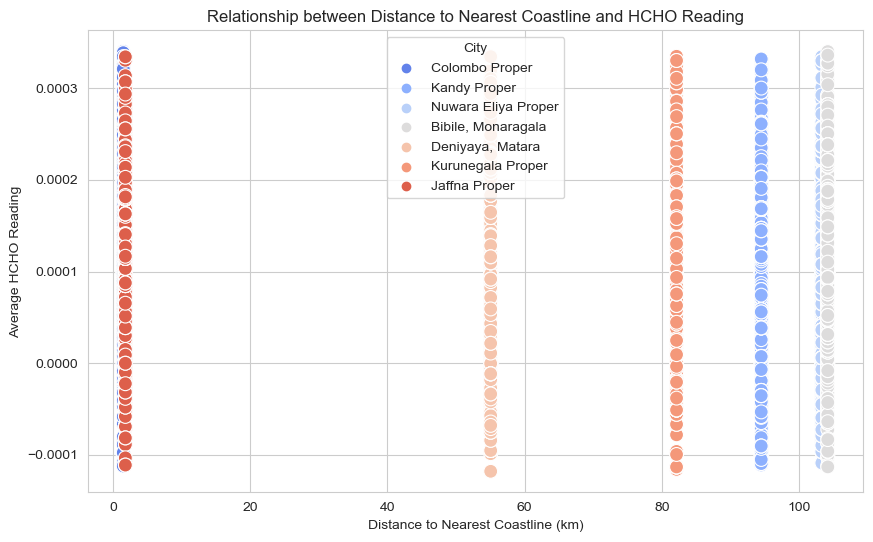

In [86]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=combined_distance_data, x='Distance_to_Nearest_Coastline (km)', y='HCHO Reading', hue='City', palette='coolwarm', s=100)
plt.title('Relationship between Distance to Nearest Coastline and HCHO Reading')
plt.xlabel('Distance to Nearest Coastline (km)')
plt.ylabel('Average HCHO Reading')
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

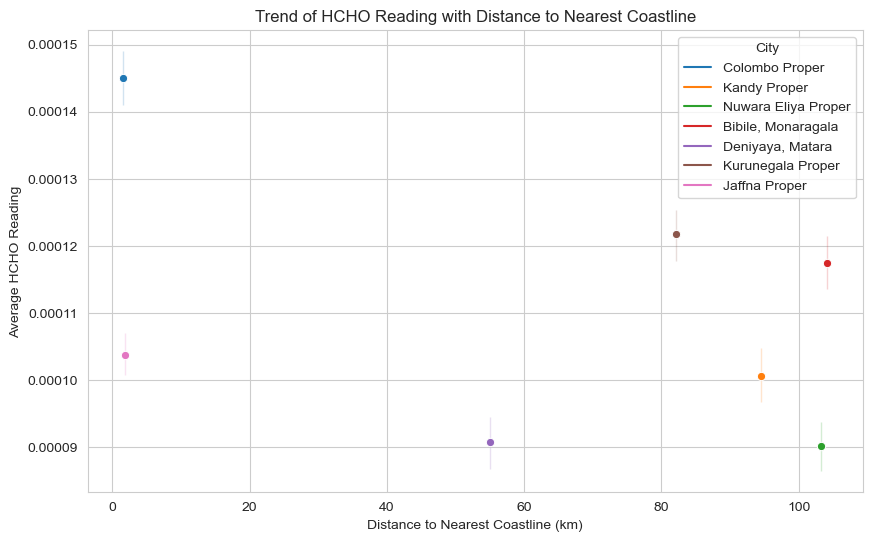

In [87]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=combined_distance_data, x='Distance_to_Nearest_Coastline (km)', y='HCHO Reading', hue='City', marker='o')
plt.title('Trend of HCHO Reading with Distance to Nearest Coastline')
plt.xlabel('Distance to Nearest Coastline (km)')
plt.ylabel('Average HCHO Reading')
plt.show()

In [88]:
correlation = combined_distance_data['Distance_to_Nearest_Coastline (km)'].corr(combined_distance_data['HCHO Reading'])
print(f'Correlation between Distance to Nearest Coastline and HCHO Reading: {correlation:.2f}')


Correlation between Distance to Nearest Coastline and HCHO Reading: -0.09


In [89]:
combined_df2 = combined_df2.drop('Population Density',axis=1)
combined_df2

,HCHO Reading,Location,Current Date,Next Date
0,1.969834e-04,Colombo Proper,2019-01-01,2019-01-02
1,2.625522e-04,Colombo Proper,2019-01-02,2019-01-03
2,9.852119e-05,Colombo Proper,2019-01-03,2019-01-04
3,2.099321e-04,Colombo Proper,2019-01-04,2019-01-05
4,1.785337e-04,Colombo Proper,2019-01-05,2019-01-06
...,...,...,...,...
5473,-7.696313e-08,Jaffna Proper,2023-12-27,2023-12-28
5474,5.139770e-05,Jaffna Proper,2023-12-28,2023-12-29
5475,1.267235e-04,Jaffna Proper,2023-12-29,2023-12-30
5476,1.166590e-04,Jaffna Proper,2023-12-30,2023-12-31


# Height above sea level

In [90]:
cities = {
    'Colombo Proper': 1,
    'Kandy Proper': 500,
    'Nuwara Eliya Proper': 1868,
    'Bibile, Monaragala': 151,
    'Deniyaya, Matara': 305,
    'Kurunegala Proper': 116,
    'Jaffna Proper': 5
}

# Create a DataFrame from the cities dictionary
cities_data = pd.DataFrame(list(cities.items()), columns=['Location', 'Elevation'])

print(cities_data)

              Location  Elevation
0       Colombo Proper          1
1         Kandy Proper        500
2  Nuwara Eliya Proper       1868
3   Bibile, Monaragala        151
4     Deniyaya, Matara        305
5    Kurunegala Proper        116
6        Jaffna Proper          5


In [91]:
combined_height_data = pd.merge(combined_df2, cities_data, on='Location', how='inner')

combined_height_data


,HCHO Reading,Location,Current Date,Next Date,Elevation
0,1.969834e-04,Colombo Proper,2019-01-01,2019-01-02,1
1,2.625522e-04,Colombo Proper,2019-01-02,2019-01-03,1
2,9.852119e-05,Colombo Proper,2019-01-03,2019-01-04,1
3,2.099321e-04,Colombo Proper,2019-01-04,2019-01-05,1
4,1.785337e-04,Colombo Proper,2019-01-05,2019-01-06,1
...,...,...,...,...,...
12446,-7.696313e-08,Jaffna Proper,2023-12-27,2023-12-28,5
12447,5.139770e-05,Jaffna Proper,2023-12-28,2023-12-29,5
12448,1.267235e-04,Jaffna Proper,2023-12-29,2023-12-30,5
12449,1.166590e-04,Jaffna Proper,2023-12-30,2023-12-31,5


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

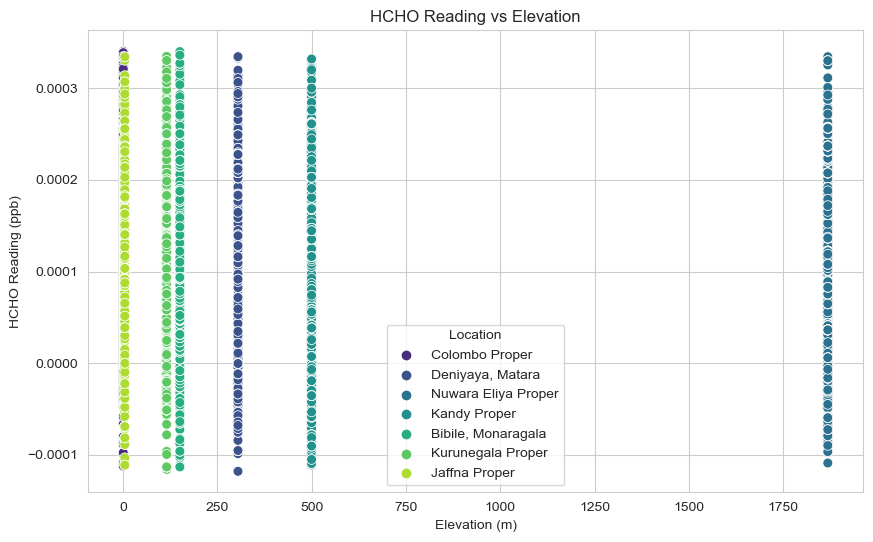

In [92]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=combined_height_data, x='Elevation', y='HCHO Reading', hue='Location', palette='viridis', s=50)
plt.title('HCHO Reading vs Elevation')
plt.xlabel('Elevation (m)')
plt.ylabel('HCHO Reading (ppb)')
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_cat

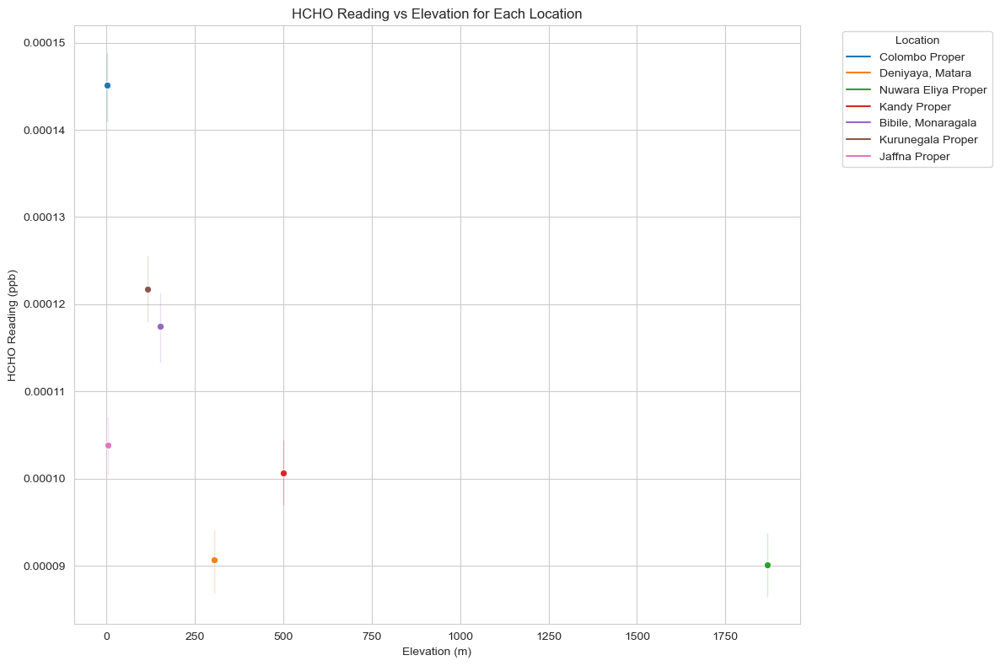

In [93]:
plt.figure(figsize=(12, 8))

sns.lineplot(data=combined_height_data, x='Elevation', y='HCHO Reading', hue='Location', marker='o')

plt.title('HCHO Reading vs Elevation for Each Location')
plt.xlabel('Elevation (m)')
plt.ylabel('HCHO Reading (ppb)')
plt.legend(title='Location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


In [94]:
correlation = combined_height_data['Elevation'].corr(combined_height_data['HCHO Reading'])

print(f'Correlation between Elevation and HCHO Reading : {correlation:.2f}')


Correlation between Elevation and HCHO Reading : -0.13


# To build machine learning model analyse data stationary or not

C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\ProgramData\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.

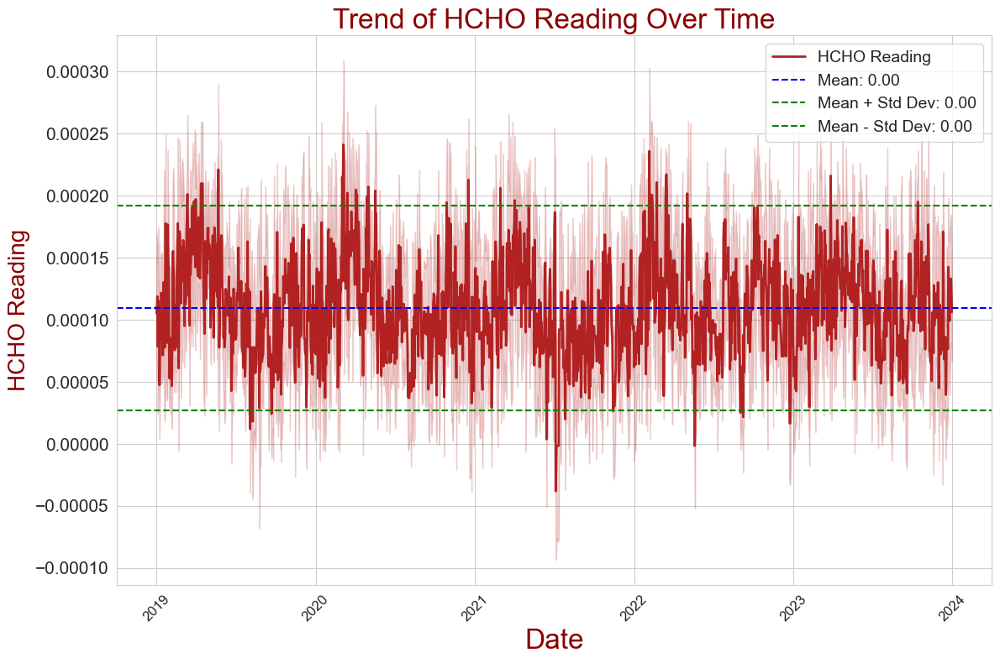

In [95]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set_style('whitegrid')

plt.figure(figsize=(12, 8))
sns.lineplot(data=combined_df, x=combined_df.index, y='HCHO Reading', linewidth=2, color='firebrick', label='HCHO Reading')

# Calculate mean and variance
mean_value = combined_df['HCHO Reading'].mean()
variance_value = combined_df['HCHO Reading'].var()

# Plotting mean line
plt.axhline(mean_value, color='blue', linestyle='--', label=f'Mean: {mean_value:.2f}')

# Plotting variance lines 
std_value = np.sqrt(variance_value)
plt.axhline(mean_value + std_value, color='green', linestyle='--', label=f'Mean + Std Dev: {mean_value + std_value:.2f}')
plt.axhline(mean_value - std_value, color='green', linestyle='--', label=f'Mean - Std Dev: {mean_value - std_value:.2f}')

plt.xlabel('Date', fontsize=24, color='darkred')
plt.ylabel('HCHO Reading', fontsize=20, color='darkred')
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=15)
plt.title('Trend of HCHO Reading Over Time', fontsize=24, color='darkred')
plt.legend(fontsize=14)

plt.tight_layout()
plt.show()


In [96]:
from statsmodels.tsa.stattools import adfuller

#Augmented Dickey-Fuller test
adfTest = adfuller(combined_df['HCHO Reading'],autolag='AIC')

print('ADF Statistic:', adfTest[0])
print('p-value:', adfTest[1])
print('Critical Values:')
for key, value in adfTest[4].items():
    print(f'\t{key}: {value}')


ADF Statistic: -12.965398113684424
p-value: 3.1612998218455494e-24
Critical Values:
	1%: -3.4308764529627545
	5%: -2.861772665892741
	10%: -2.566893843053337


# Implementation of LSTM Models

In [265]:
hcho_df = combined_df2.copy()
# hcho_df.set_index('Current Date', inplace=True)
hcho_df

,HCHO Reading,Location,Current Date,Next Date
0,1.969834e-04,Colombo Proper,2019-01-01,2019-01-02
1,2.625522e-04,Colombo Proper,2019-01-02,2019-01-03
2,9.852119e-05,Colombo Proper,2019-01-03,2019-01-04
3,2.099321e-04,Colombo Proper,2019-01-04,2019-01-05
4,1.785337e-04,Colombo Proper,2019-01-05,2019-01-06
...,...,...,...,...
5473,-7.696313e-08,Jaffna Proper,2023-12-27,2023-12-28
5474,5.139770e-05,Jaffna Proper,2023-12-28,2023-12-29
5475,1.267235e-04,Jaffna Proper,2023-12-29,2023-12-30
5476,1.166590e-04,Jaffna Proper,2023-12-30,2023-12-31


In [266]:
hcho_df = hcho_df.drop('Next Date',axis=True)
hcho_df

,HCHO Reading,Location,Current Date
0,1.969834e-04,Colombo Proper,2019-01-01
1,2.625522e-04,Colombo Proper,2019-01-02
2,9.852119e-05,Colombo Proper,2019-01-03
3,2.099321e-04,Colombo Proper,2019-01-04
4,1.785337e-04,Colombo Proper,2019-01-05
...,...,...,...
5473,-7.696313e-08,Jaffna Proper,2023-12-27
5474,5.139770e-05,Jaffna Proper,2023-12-28
5475,1.267235e-04,Jaffna Proper,2023-12-29
5476,1.166590e-04,Jaffna Proper,2023-12-30


# LSTM FOR COLOMBO

In [71]:
hcho_df = hcho_df[hcho_df['Location'] == 'Colombo Proper']

In [72]:
df2=hcho_df.reset_index()['HCHO Reading']

In [73]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler(feature_range=(0,1))
df2=scaler.fit_transform(np.array(df2).reshape(-1,1))

In [74]:
##splitting dataset into train and test split
training_size1=int(len(df2)*0.70)
test_size1=len(df2)-training_size1
train_data,test_data=df2[0:training_size1,:],df2[training_size1:len(df2),:1]

In [75]:
import numpy
# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY)

In [76]:
# reshape into X=t,t+1,t+2,t+3 and Y=t+4
time_step = 100
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)

In [77]:
# reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

In [78]:
model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')


In [79]:
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)

Epoch 1/100
71/71 [==============================] - 11s 87ms/step - loss: 0.0438 - val_loss: 0.0254
Epoch 2/100
71/71 [==============================] - 5s 70ms/step - loss: 0.0295 - val_loss: 0.0280
Epoch 3/100
71/71 [==============================] - 5s 67ms/step - loss: 0.0306 - val_loss: 0.0254
Epoch 4/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0284 - val_loss: 0.0302
Epoch 5/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0290 - val_loss: 0.0269
Epoch 6/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0280 - val_loss: 0.0259
Epoch 7/100
71/71 [==============================] - 5s 67ms/step - loss: 0.0276 - val_loss: 0.0290
Epoch 8/100
71/71 [==============================] - 5s 67ms/step - loss: 0.0287 - val_loss: 0.0255
Epoch 9/100
71/71 [==============================] - 5s 67ms/step - loss: 0.0267 - val_loss: 0.0281
Epoch 10/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0271 - val_loss: 0.028

71/71 [==============================] - 5s 77ms/step - loss: 0.0239 - val_loss: 0.0221
Epoch 83/100
71/71 [==============================] - 5s 73ms/step - loss: 0.0243 - val_loss: 0.0224
Epoch 84/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0238 - val_loss: 0.0222
Epoch 85/100
71/71 [==============================] - 5s 76ms/step - loss: 0.0240 - val_loss: 0.0234
Epoch 86/100
71/71 [==============================] - 5s 72ms/step - loss: 0.0241 - val_loss: 0.0223
Epoch 87/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0236 - val_loss: 0.0222
Epoch 88/100
71/71 [==============================] - 5s 75ms/step - loss: 0.0237 - val_loss: 0.0221
Epoch 89/100
71/71 [==============================] - 5s 74ms/step - loss: 0.0247 - val_loss: 0.0220
Epoch 90/100
71/71 [==============================] - 5s 70ms/step - loss: 0.0237 - val_loss: 0.0221
Epoch 91/100
71/71 [==============================] - 5s 72ms/step - loss: 0.0240 - val_loss: 0.0224
Epo

In [80]:
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

14/14 [==============================] - 0s 24ms/step


In [81]:
##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

In [86]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000073,0.000138
1,0.000073,0.000042
2,0.000073,0.000074
3,0.000073,0.000060
4,0.000073,0.000062
5,0.000087,0.000068
6,0.000173,0.000082
7,0.000200,0.000113
8,0.000179,0.000136
9,0.000276,0.000148


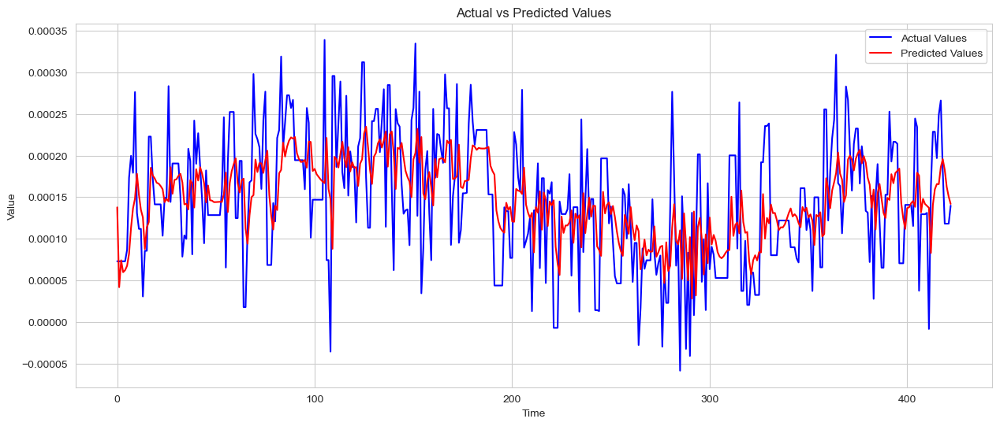

In [84]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [85]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 4.5213648939622814e-09
Mean Absolute Percentage Error (MAPE): 0.8330523083949466 %
R-squared (R2) Score: 0.2482574983996383


In [87]:
model.save("lstm_model_colombo.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM For Kandy

In [99]:
hcho_df = hcho_df[hcho_df['Location'] == 'Kandy Proper']
df3=hcho_df.reset_index()['HCHO Reading']

In [100]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df3=scaler.fit_transform(np.array(df3).reshape(-1,1))                                         
training_size=int(len(df3)*0.70)
test_size=len(df3)-training_size
train_data,test_data=df3[0:training_size,:],df3[training_size:len(df3),:1]                                                                      

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY)  

X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
73/73 [==============================] - 11s 81ms/step - loss: 0.0482 - val_loss: 0.0321
Epoch 2/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0376 - val_loss: 0.0312
Epoch 3/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0359 - val_loss: 0.0304
Epoch 4/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0361 - val_loss: 0.0319
Epoch 5/100
73/73 [==============================] - 5s 66ms/step - loss: 0.0349 - val_loss: 0.0292
Epoch 6/100
73/73 [==============================] - 5s 66ms/step - loss: 0.0349 - val_loss: 0.0284
Epoch 7/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0322 - val_loss: 0.0264
Epoch 8/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0293 - val_loss: 0.0247
Epoch 9/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0277 - val_loss: 0.0239
Epoch 10/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0265 - val_loss: 0.024

73/73 [==============================] - 5s 68ms/step - loss: 0.0251 - val_loss: 0.0232
Epoch 83/100
73/73 [==============================] - 5s 75ms/step - loss: 0.0248 - val_loss: 0.0233
Epoch 84/100
73/73 [==============================] - 5s 70ms/step - loss: 0.0253 - val_loss: 0.0240
Epoch 85/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0250 - val_loss: 0.0231
Epoch 86/100
73/73 [==============================] - 5s 74ms/step - loss: 0.0250 - val_loss: 0.0238
Epoch 87/100
73/73 [==============================] - 5s 73ms/step - loss: 0.0249 - val_loss: 0.0234
Epoch 88/100
73/73 [==============================] - 5s 69ms/step - loss: 0.0248 - val_loss: 0.0229
Epoch 89/100
73/73 [==============================] - 5s 71ms/step - loss: 0.0249 - val_loss: 0.0236
Epoch 90/100
73/73 [==============================] - 5s 73ms/step - loss: 0.0247 - val_loss: 0.0237
Epoch 91/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0248 - val_loss: 0.0236
Epo

In [101]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 23ms/step


In [102]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000264,0.000163
1,0.000264,0.000160
2,0.000264,0.000160
3,0.000153,0.000160
4,0.000153,0.000108
5,0.000153,0.000115
6,0.000153,0.000109
7,0.000153,0.000124
8,0.000153,0.000129
9,0.000153,0.000134


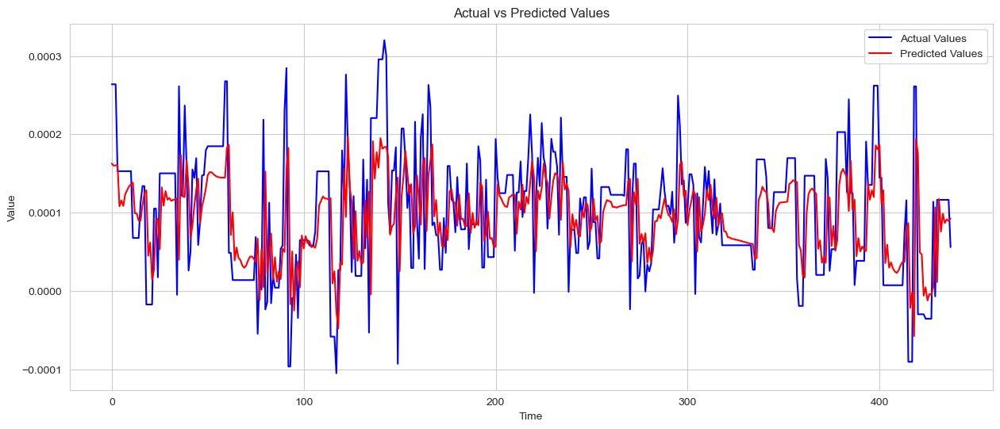

In [103]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [104]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 4.591862067521323e-09
Mean Absolute Percentage Error (MAPE): 1.8256675418121888 %
R-squared (R2) Score: 0.2673671388376745


In [105]:
model.save("lstm_model_kandy.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM for Jaffna

In [241]:
hcho_df = hcho_df[hcho_df['Location'] == 'Jaffna Proper']
df4 = hcho_df.reset_index()['HCHO Reading']
df4

0       5.830910e-05
1       1.017953e-04
2       3.931331e-05
3      -2.383985e-06
4       1.589137e-04
            ...     
1784   -7.696313e-08
1785    5.139770e-05
1786    1.267235e-04
1787    1.166590e-04
1788    6.540853e-05
Name: HCHO Reading, Length: 1789, dtype: float64

In [242]:
scaler=MinMaxScaler(feature_range=(0,1))
df4=scaler.fit_transform(np.array(df4).reshape(-1,1))                                         
training_size=int(len(df4)*0.70)
test_size=len(df4)-training_size
train_data,test_data=df4[0:training_size,:],df4[training_size:len(df4),:1]    
df4.shape

(1789, 1)

In [243]:
df4 = scaler.inverse_transform(df4)
df4.shape

(1789, 1)

In [196]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df4=scaler.fit_transform(np.array(df4).reshape(-1,1))                                         
training_size=int(len(df4)*0.70)
test_size=len(df4)-training_size
train_data,test_data=df4[0:training_size,:],df4[training_size:len(df4),:1]     

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY) 

X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
72/72 [==============================] - 22s 181ms/step - loss: 0.0335 - val_loss: 0.0217
Epoch 2/100
72/72 [==============================] - 8s 110ms/step - loss: 0.0227 - val_loss: 0.0209
Epoch 3/100
72/72 [==============================] - 9s 121ms/step - loss: 0.0227 - val_loss: 0.0216
Epoch 4/100
72/72 [==============================] - 8s 106ms/step - loss: 0.0227 - val_loss: 0.0203
Epoch 5/100
72/72 [==============================] - 8s 118ms/step - loss: 0.0224 - val_loss: 0.0203
Epoch 6/100
72/72 [==============================] - 7s 102ms/step - loss: 0.0222 - val_loss: 0.0224
Epoch 7/100
72/72 [==============================] - 8s 111ms/step - loss: 0.0223 - val_loss: 0.0203
Epoch 8/100
72/72 [==============================] - 7s 99ms/step - loss: 0.0223 - val_loss: 0.0202
Epoch 9/100
72/72 [==============================] - 8s 109ms/step - loss: 0.0218 - val_loss: 0.0203
Epoch 10/100
72/72 [==============================] - 7s 100ms/step - loss: 0.0219 - val_lo

Epoch 82/100
72/72 [==============================] - 5s 71ms/step - loss: 0.0195 - val_loss: 0.0190
Epoch 83/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0196 - val_loss: 0.0189
Epoch 84/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0198 - val_loss: 0.0188
Epoch 85/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0196 - val_loss: 0.0196
Epoch 86/100
72/72 [==============================] - 6s 77ms/step - loss: 0.0198 - val_loss: 0.0189
Epoch 87/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0198 - val_loss: 0.0192
Epoch 88/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0195 - val_loss: 0.0195
Epoch 89/100
72/72 [==============================] - 6s 85ms/step - loss: 0.0196 - val_loss: 0.0189
Epoch 90/100
72/72 [==============================] - 6s 77ms/step - loss: 0.0197 - val_loss: 0.0192
Epoch 91/100
72/72 [==============================] - 7s 93ms/step - loss: 0.0197 - val_los

In [246]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)
test_predict = scaler.inverse_transform(test_predict)
test_predict

36/36 [==============================] - 1s 23ms/step


array([[1.15474249e-04],
       [1.14372640e-04],
       [1.11796864e-04],
       [1.14833405e-04],
       [1.15226831e-04],
       [1.23351638e-04],
       [1.29021661e-04],
       [7.65652949e-05],
       [5.62874520e-05],
       [8.54351383e-05],
       [1.17196942e-04],
       [1.17746233e-04],
       [1.05862448e-04],
       [1.01658632e-04],
       [9.81211342e-05],
       [8.67577983e-05],
       [9.24741980e-05],
       [9.49029782e-05],
       [9.42506376e-05],
       [9.32937110e-05],
       [9.95167793e-05],
       [1.07133244e-04],
       [1.08114706e-04],
       [1.06832144e-04],
       [1.00429628e-04],
       [7.94979569e-05],
       [8.25795069e-05],
       [8.47625925e-05],
       [8.36264662e-05],
       [8.10374186e-05],
       [7.85980737e-05],
       [8.17705586e-05],
       [8.27698823e-05],
       [1.17034069e-04],
       [7.25913196e-05],
       [1.10165347e-04],
       [1.21080106e-04],
       [1.15185168e-04],
       [9.51127658e-05],
       [1.08543769e-04],


In [227]:
train_predict1=scaler.inverse_transform(train_predict)
test_predict1=scaler.inverse_transform(test_predict)


In [248]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)

,Actual Values,Predicted Values
0,0.000057,0.000115
1,0.000052,0.000114
2,0.000068,0.000112
3,0.000068,0.000115
4,0.000103,0.000115
5,0.000129,0.000123
6,-0.000082,0.000129
7,-0.000082,0.000077
8,0.000120,0.000056
9,0.000120,0.000085


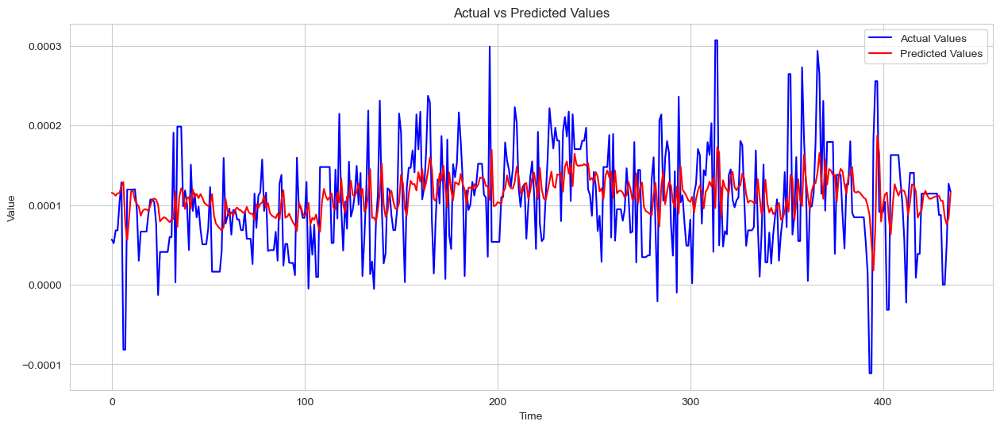

In [249]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [250]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 3.766031295798262e-09
Mean Absolute Percentage Error (MAPE): 6.974006476081971 %
R-squared (R2) Score: 0.09748296549836255


In [251]:
model.save("lstm_model_jaffna.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM for Kurunegala

In [185]:
hcho_df = hcho_df[hcho_df['Location'] == 'Kurunegala Proper']
df5=hcho_df.reset_index()['HCHO Reading']

In [186]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df5=scaler.fit_transform(np.array(df5).reshape(-1,1))                                         
training_size=int(len(df5)*0.70)
test_size=len(df5)-training_size
train_data,test_data=df5[0:training_size,:],df5[training_size:len(df5),:1]  

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY)       

X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
72/72 [==============================] - 13s 87ms/step - loss: 0.0484 - val_loss: 0.0275
Epoch 2/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0313 - val_loss: 0.0259
Epoch 3/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0308 - val_loss: 0.0295
Epoch 4/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0312 - val_loss: 0.0259
Epoch 5/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0300 - val_loss: 0.0276
Epoch 6/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0297 - val_loss: 0.0254
Epoch 7/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0288 - val_loss: 0.0249
Epoch 8/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0290 - val_loss: 0.0276
Epoch 9/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0278 - val_loss: 0.0253
Epoch 10/100
72/72 [==============================] - 5s 66ms/step - loss: 0.0267 - val_loss: 0.025

72/72 [==============================] - 5s 68ms/step - loss: 0.0231 - val_loss: 0.0217
Epoch 83/100
72/72 [==============================] - 6s 82ms/step - loss: 0.0230 - val_loss: 0.0219
Epoch 84/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0230 - val_loss: 0.0216
Epoch 85/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0234 - val_loss: 0.0220
Epoch 86/100
72/72 [==============================] - 6s 80ms/step - loss: 0.0230 - val_loss: 0.0215
Epoch 87/100
72/72 [==============================] - 5s 70ms/step - loss: 0.0230 - val_loss: 0.0220
Epoch 88/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0235 - val_loss: 0.0245
Epoch 89/100
72/72 [==============================] - 6s 79ms/step - loss: 0.0233 - val_loss: 0.0214
Epoch 90/100
72/72 [==============================] - 5s 71ms/step - loss: 0.0236 - val_loss: 0.0217
Epoch 91/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0229 - val_loss: 0.0231
Epo

In [187]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

36/36 [==============================] - 1s 23ms/step


In [188]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000162,0.000165
1,0.000158,0.000138
2,0.000112,0.000136
3,0.000285,0.000106
4,0.000285,0.000180
5,0.000134,0.000199
6,0.000134,0.000144
7,0.000134,0.000143
8,0.000134,0.000143
9,0.000134,0.000147


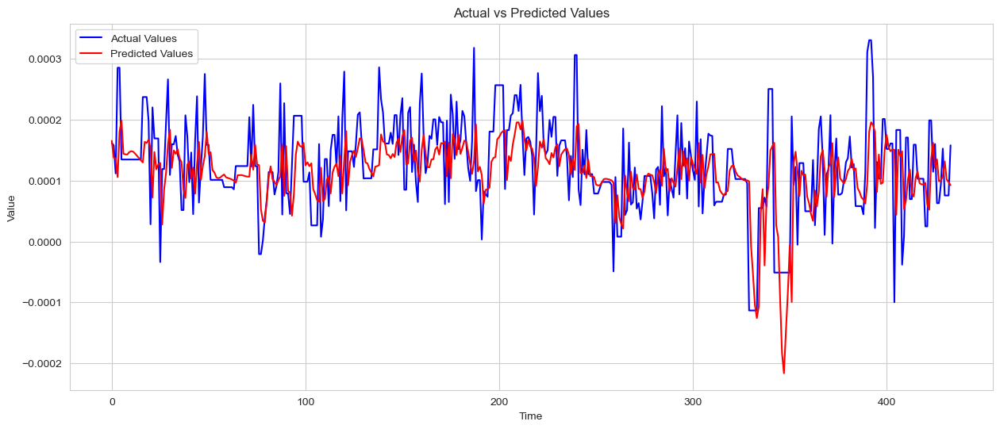

In [189]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [190]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 4.839686128367884e-09
Mean Absolute Percentage Error (MAPE): 0.8900813081165826 %
R-squared (R2) Score: 0.1817448173012578


In [191]:
model.save("lstm_model_Kurunegala.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM FOR Nuwara eliya

In [173]:
hcho_df = hcho_df[hcho_df['Location'] == 'Nuwara Eliya Proper']
df6=hcho_df.reset_index()['HCHO Reading']

In [174]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df6=scaler.fit_transform(np.array(df6).reshape(-1,1))                                         
training_size=int(len(df6)*0.70)
test_size=len(df6)-training_size
train_data,test_data=df6[0:training_size,:],df6[training_size:len(df6),:1] 

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY) 

X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
73/73 [==============================] - 12s 86ms/step - loss: 0.0400 - val_loss: 0.0390
Epoch 2/100
73/73 [==============================] - 5s 68ms/step - loss: 0.0310 - val_loss: 0.0311
Epoch 3/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0300 - val_loss: 0.0301
Epoch 4/100
73/73 [==============================] - 5s 68ms/step - loss: 0.0299 - val_loss: 0.0288
Epoch 5/100
73/73 [==============================] - 5s 68ms/step - loss: 0.0290 - val_loss: 0.0273
Epoch 6/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0268 - val_loss: 0.0238
Epoch 7/100
73/73 [==============================] - 5s 68ms/step - loss: 0.0251 - val_loss: 0.0274
Epoch 8/100
73/73 [==============================] - 5s 69ms/step - loss: 0.0232 - val_loss: 0.0204
Epoch 9/100
73/73 [==============================] - 5s 70ms/step - loss: 0.0228 - val_loss: 0.0188
Epoch 10/100
73/73 [==============================] - 6s 84ms/step - loss: 0.0228 - val_loss: 0.020

73/73 [==============================] - 5s 67ms/step - loss: 0.0208 - val_loss: 0.0191
Epoch 83/100
73/73 [==============================] - 6s 76ms/step - loss: 0.0213 - val_loss: 0.0177
Epoch 84/100
73/73 [==============================] - 5s 69ms/step - loss: 0.0210 - val_loss: 0.0177
Epoch 85/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0209 - val_loss: 0.0187
Epoch 86/100
73/73 [==============================] - 6s 78ms/step - loss: 0.0208 - val_loss: 0.0174
Epoch 87/100
73/73 [==============================] - 5s 70ms/step - loss: 0.0209 - val_loss: 0.0182
Epoch 88/100
73/73 [==============================] - 5s 67ms/step - loss: 0.0209 - val_loss: 0.0178
Epoch 89/100
73/73 [==============================] - 5s 74ms/step - loss: 0.0210 - val_loss: 0.0176
Epoch 90/100
73/73 [==============================] - 5s 71ms/step - loss: 0.0209 - val_loss: 0.0177
Epoch 91/100
73/73 [==============================] - 5s 68ms/step - loss: 0.0210 - val_loss: 0.0193
Epo

In [178]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)##Transformback to original form
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

37/37 [==============================] - 1s 22ms/step


In [179]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000256,0.000172
1,0.000256,0.000179
2,0.000256,0.000181
3,0.000256,0.000183
4,0.000256,0.000183
5,0.000256,0.000183
6,0.000256,0.000181
7,0.000256,0.000180
8,0.000256,0.000179
9,0.000256,0.000177


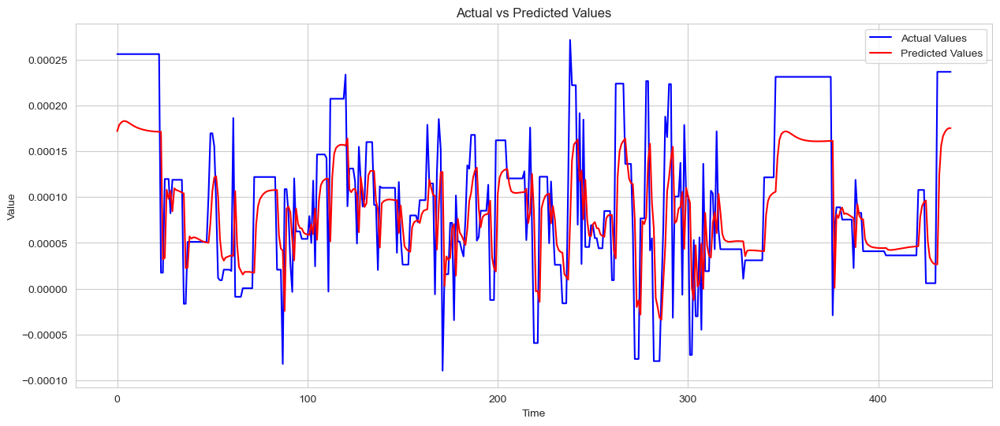

In [180]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [181]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 3.6121075632790694e-09
Mean Absolute Percentage Error (MAPE): 1.5315297005187491 %
R-squared (R2) Score: 0.49677381370347207


In [182]:
model.save("lstm_model_Nuwara_eliya.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM for Deniyaya

In [258]:
hcho_df = hcho_df[hcho_df['Location'] == 'Deniyaya, Matara']
df7=hcho_df.reset_index()['HCHO Reading']

In [259]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df7=scaler.fit_transform(np.array(df7).reshape(-1,1))                                         
training_size=int(len(df7)*0.70)
test_size=len(df7)-training_size
train_data,test_data=df7[0:training_size,:],df7[training_size:len(df7),:1]  

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY)                                                                                                        
X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
72/72 [==============================] - 12s 88ms/step - loss: 0.0387 - val_loss: 0.0321
Epoch 2/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0309 - val_loss: 0.0311
Epoch 3/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0285 - val_loss: 0.0318
Epoch 4/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0272 - val_loss: 0.0303
Epoch 5/100
72/72 [==============================] - 5s 67ms/step - loss: 0.0262 - val_loss: 0.0290
Epoch 6/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0265 - val_loss: 0.0263
Epoch 7/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0248 - val_loss: 0.0251
Epoch 8/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0229 - val_loss: 0.0263
Epoch 9/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0227 - val_loss: 0.0227
Epoch 10/100
72/72 [==============================] - 5s 68ms/step - loss: 0.0216 - val_loss: 0.021

72/72 [==============================] - 5s 72ms/step - loss: 0.0206 - val_loss: 0.0217
Epoch 83/100
72/72 [==============================] - 5s 70ms/step - loss: 0.0204 - val_loss: 0.0215
Epoch 84/100
72/72 [==============================] - 6s 78ms/step - loss: 0.0209 - val_loss: 0.0216
Epoch 85/100
72/72 [==============================] - 5s 73ms/step - loss: 0.0205 - val_loss: 0.0215
Epoch 86/100
72/72 [==============================] - 5s 71ms/step - loss: 0.0208 - val_loss: 0.0217
Epoch 87/100
72/72 [==============================] - 6s 80ms/step - loss: 0.0206 - val_loss: 0.0217
Epoch 88/100
72/72 [==============================] - 5s 72ms/step - loss: 0.0207 - val_loss: 0.0216
Epoch 89/100
72/72 [==============================] - 5s 69ms/step - loss: 0.0205 - val_loss: 0.0215
Epoch 90/100
72/72 [==============================] - 6s 79ms/step - loss: 0.0208 - val_loss: 0.0232
Epoch 91/100
72/72 [==============================] - 6s 77ms/step - loss: 0.0207 - val_loss: 0.0216
Epo

In [260]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

36/36 [==============================] - 1s 23ms/step


In [261]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000121,0.000122
1,0.000121,0.000122
2,0.000121,0.000122
3,0.000121,0.000122
4,0.000035,0.000121
5,0.000035,0.000075
6,0.000035,0.000072
7,0.000035,0.000066
8,0.000035,0.000064
9,0.000035,0.000062


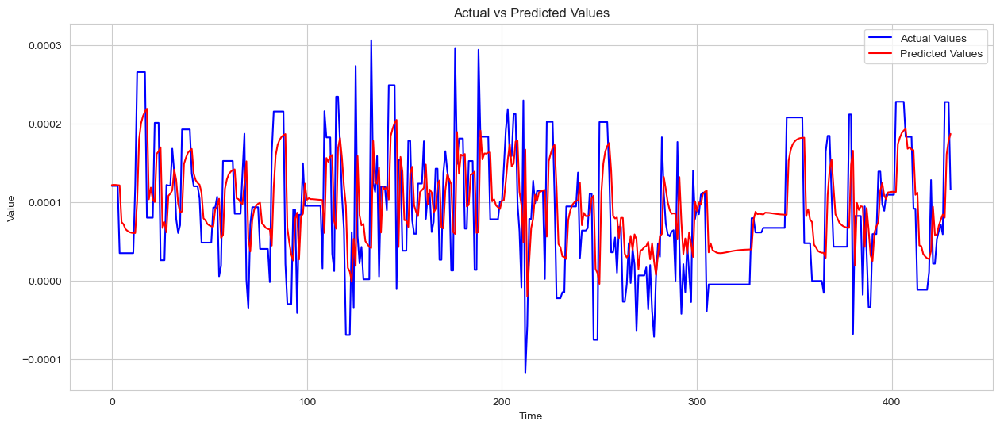

In [262]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [263]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 4.5078191869887476e-09
Mean Absolute Percentage Error (MAPE): 18.69599692761024 %
R-squared (R2) Score: 0.3200105555461661


In [264]:
model.save("lstm_model_deniyaya.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# LSTM model for Bibile

In [267]:
hcho_df = hcho_df[hcho_df['Location'] == 'Bibile, Monaragala']
df8=hcho_df.reset_index()['HCHO Reading']

In [268]:
from sklearn.preprocessing import MinMaxScaler

scaler=MinMaxScaler(feature_range=(0,1))
df8=scaler.fit_transform(np.array(df8).reshape(-1,1))                                         
training_size=int(len(df8)*0.70)
test_size=len(df8)-training_size
train_data,test_data=df8[0:training_size,:],df8[training_size:len(df8),:1]      

# convert an array of values into a dataset matrix
def create_dataset(dataset, time_step=1):
    dataX, dataY = [], []
    for i in range(len(dataset)-time_step-1):
        a = dataset[i:(i+time_step), 0]  
        dataX.append(a)
        dataY.append(dataset[i + time_step, 0])
    return numpy.array(dataX), numpy.array(dataY)   

X_train, y_train = create_dataset(train_data, time_step)
X_test, ytest = create_dataset(test_data, time_step)                                                                                                         
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1)
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1) 

model=Sequential()
model.add(LSTM(50,return_sequences=True,input_shape=(100,1)))
model.add(LSTM(50,return_sequences=True))
model.add(LSTM(50))
model.add(Dense(1))
model.compile(loss='mean_squared_error',optimizer='adam')
model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=16,verbose=1)                        


Epoch 1/100
71/71 [==============================] - 13s 90ms/step - loss: 0.0464 - val_loss: 0.0341
Epoch 2/100
71/71 [==============================] - 5s 71ms/step - loss: 0.0319 - val_loss: 0.0337
Epoch 3/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0319 - val_loss: 0.0339
Epoch 4/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0318 - val_loss: 0.0329
Epoch 5/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0311 - val_loss: 0.0322
Epoch 6/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0312 - val_loss: 0.0321
Epoch 7/100
71/71 [==============================] - 5s 71ms/step - loss: 0.0297 - val_loss: 0.0327
Epoch 8/100
71/71 [==============================] - 5s 69ms/step - loss: 0.0278 - val_loss: 0.0314
Epoch 9/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0269 - val_loss: 0.0260
Epoch 10/100
71/71 [==============================] - 5s 68ms/step - loss: 0.0263 - val_loss: 0.024

71/71 [==============================] - 5s 69ms/step - loss: 0.0230 - val_loss: 0.0233
Epoch 83/100
71/71 [==============================] - 6s 78ms/step - loss: 0.0234 - val_loss: 0.0232
Epoch 84/100
71/71 [==============================] - 5s 71ms/step - loss: 0.0235 - val_loss: 0.0235
Epoch 85/100
71/71 [==============================] - 5s 71ms/step - loss: 0.0236 - val_loss: 0.0233
Epoch 86/100
71/71 [==============================] - 6s 79ms/step - loss: 0.0232 - val_loss: 0.0239
Epoch 87/100
71/71 [==============================] - 5s 72ms/step - loss: 0.0234 - val_loss: 0.0231
Epoch 88/100
71/71 [==============================] - 5s 70ms/step - loss: 0.0234 - val_loss: 0.0235
Epoch 89/100
71/71 [==============================] - 5s 77ms/step - loss: 0.0231 - val_loss: 0.0235
Epoch 90/100
71/71 [==============================] - 5s 74ms/step - loss: 0.0232 - val_loss: 0.0234
Epoch 91/100
71/71 [==============================] - 5s 70ms/step - loss: 0.0233 - val_loss: 0.0230
Epo

In [269]:
test_predict=model.predict(X_test) 
train_predict=model.predict(X_train)
train_predict=scaler.inverse_transform(train_predict)
test_predict=scaler.inverse_transform(test_predict)

36/36 [==============================] - 1s 23ms/step


In [270]:
import pandas as pd

# Inverse transform the original test data for comparison
actual_values = scaler.inverse_transform(ytest.reshape(-1, 1))

# Create a DataFrame to display the actual and predicted values
results = pd.DataFrame({
    'Actual Values': actual_values.flatten(),
    'Predicted Values': test_predict.flatten()
})

results.head(20)


,Actual Values,Predicted Values
0,0.000158,0.000156
1,0.000158,0.000153
2,0.000158,0.000153
3,0.000127,0.000151
4,-0.000026,0.000139
5,0.000210,0.000096
6,0.000210,0.000146
7,0.000210,0.000156
8,0.000204,0.000165
9,0.000063,0.000168


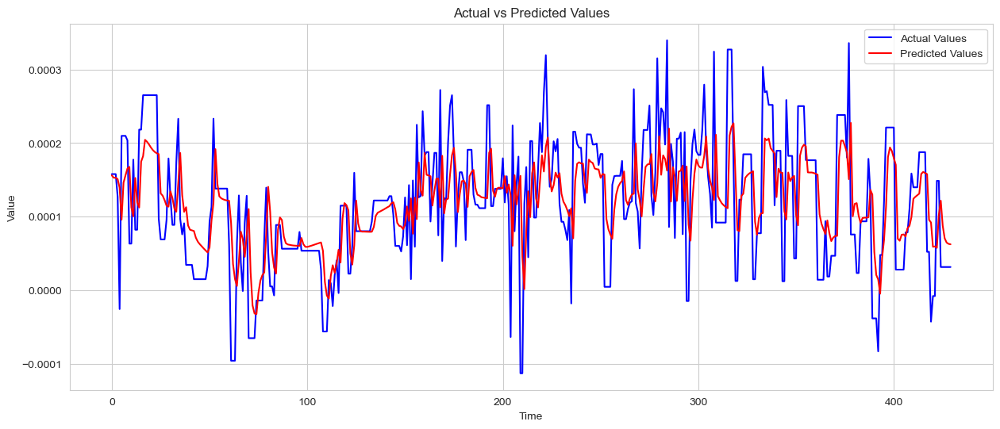

In [271]:
plt.figure(figsize=(15, 6))
plt.plot(results['Actual Values'], label='Actual Values', color='blue')
plt.plot(results['Predicted Values'], label='Predicted Values', color='red')
plt.title('Actual vs Predicted Values')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

In [272]:
from sklearn.metrics import mean_squared_error, r2_score
# Compute Mean Squared Error (MSE)
mse = mean_squared_error(actual_values, test_predict)
print(f"Mean Squared Error (MSE): {mse}")

# Compute Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((actual_values - test_predict) / actual_values)) 
print(f"Mean Absolute Percentage Error (MAPE): {mape} %")

# Compute R-squared (R2) score
r2 = r2_score(actual_values, test_predict)
print(f"R-squared (R2) Score: {r2}")

Mean Squared Error (MSE): 4.747889149642713e-09
Mean Absolute Percentage Error (MAPE): 1.3300343723000838 %
R-squared (R2) Score: 0.3923201493987719


In [273]:
model.save("lstm_model_bibile.h5")

C:\Users\asus\AppData\Roaming\Python\Python311\site-packages\keras\src\engine\training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
